In [1]:
# Import libraries

import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image
from sklearn.decomposition import PCA
from sklearn.manifold import Isomap
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV, StratifiedKFold, ShuffleSplit
from sklearn.model_selection import cross_val_predict
from imblearn.over_sampling import SMOTENC, SMOTE
from imblearn.pipeline import Pipeline 
from sklearn.metrics import roc_auc_score, classification_report, f1_score, accuracy_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix
from sklearn.feature_selection import SelectKBest, SequentialFeatureSelector, mutual_info_classif, chi2, f_classif
from sklearn.linear_model import LinearRegression
from sklearn.cluster import SpectralClustering
from sklearn.svm import SVC
from sklearn import linear_model
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier, AdaBoostClassifier
from sklearn.utils.class_weight import compute_class_weight
from sklearn.tree import DecisionTreeClassifier
from collections import defaultdict
import lightgbm as lgb
from scipy.stats import f_oneway
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.cluster import KMeans
from sklearn.linear_model import LassoCV, Lasso, LogisticRegression
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from scipy.stats import wilcoxon
from scipy.stats import ttest_ind

## Data Source

- The data set, which was initially created by IBM data scientists in 2017, is from the Kaggle platform (link). As Human Resources data is highly confidential, the data provided here is fictional but structured similarly to real data. It has 1470 rows and 35 columns, and each row indicates each employee data. This data set has no missing values. As for the response variable, Attrition, it consists of 237 of ‘Yes’ values and 1233 of ‘No’ values. The following table explains each variable with short description and type. 
- Dataset link: https://www.kaggle.com/datasets/pavansubhasht/ibm-hr-analytics-attrition-dataset/data

## Variable Description

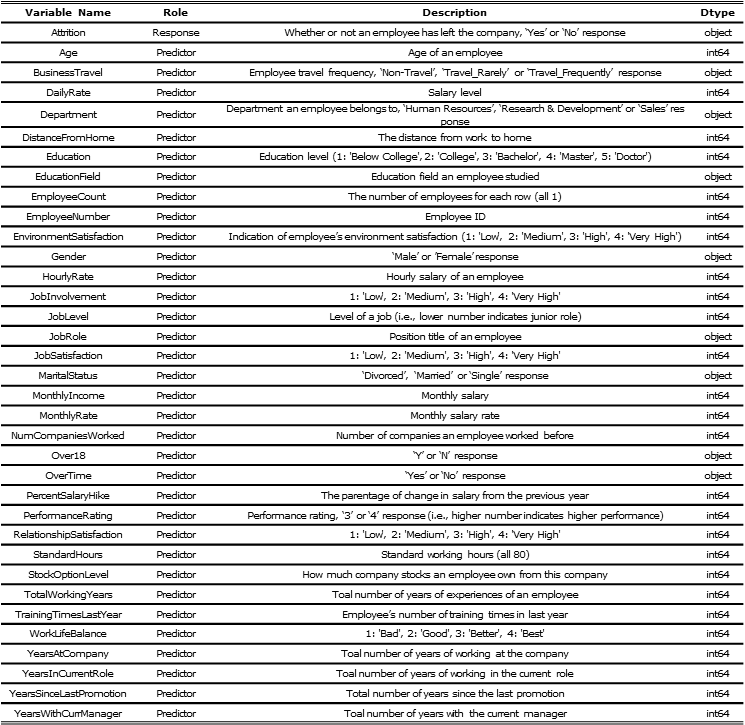

In [2]:
Image('var_description.png')

## 1. Basic Information of Data

In [3]:
# load the data
os.getcwd()
data = pd.read_csv("dataset/WA_Fn-UseC_-HR-Employee-Attrition.csv")

# missing data check
data = data.copy()

print(f'# of missing data : {(data.isna().any(axis=1)).sum()}')

# white space check
check_spaces = data.apply(lambda x: x.map(lambda x: str(x).isspace()))
print(f'# of white space data : {check_spaces.any(axis=1).sum()}')

# of missing data : 0
# of white space data : 0


In [4]:
# check the basic info of data
data.info()
data.describe().transpose()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.00,3.0,4.00,5.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.00,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.00,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.00,2.0,3.00,5.0


In [5]:
# check the first 5 rows of data
data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


## 2. Exploratory Data Analysis (EDA)

### 2.1. Attrition based on Our Interest

In [6]:
# total # of Attrition
print(data["Attrition"].value_counts(), "\n") # No     1233, Yes     237

# attrition based on Department, PerformanceRating, Generation
category_check_data = data.copy()
category_check_data["Generation"] = category_check_data.apply(lambda x : "GenZ&M" if x["Age"] <= 36 else ("GenX" if (x["Age"] > 36 and x["Age"] <= 52) else "Boomers"), axis=1)
category = ["Department", "PerformanceRating", "Generation"]

for i in category :
    total_ppl = category_check_data.groupby(i).size()
    attr_y = category_check_data.groupby(i).apply(lambda group : group[group["Attrition"]=="Yes"].count())["Attrition"]
    new_hires = category_check_data.groupby(i).apply(lambda group : group[group["YearsAtCompany"]==0].count())["YearsAtCompany"]
    start_ppl = total_ppl - new_hires
    end_ppl = start_ppl - attr_y + new_hires
    attr_rate = attr_y/((start_ppl + end_ppl)/2)
    print(attr_rate)
    print()

Attrition
No     1233
Yes     237
Name: count, dtype: int64 

Department
Human Resources           0.210526
Research & Development    0.150965
Sales                     0.234994
dtype: float64

PerformanceRating
3    0.177699
4    0.181373
dtype: float64

Generation
Boomers    0.131313
GenX       0.109434
GenZ&M     0.236974
dtype: float64



### 2. 2. PCA, ISOMAP plots of Data

Cumulative explained variance of 2 PCs (Department) : 0.23912161742587784
Cumulative explained variance of 2 PCs (PerformanceRating) : 0.2432790135424676
Cumulative explained variance of 2 PCs (Generation) : 0.23403282863299898


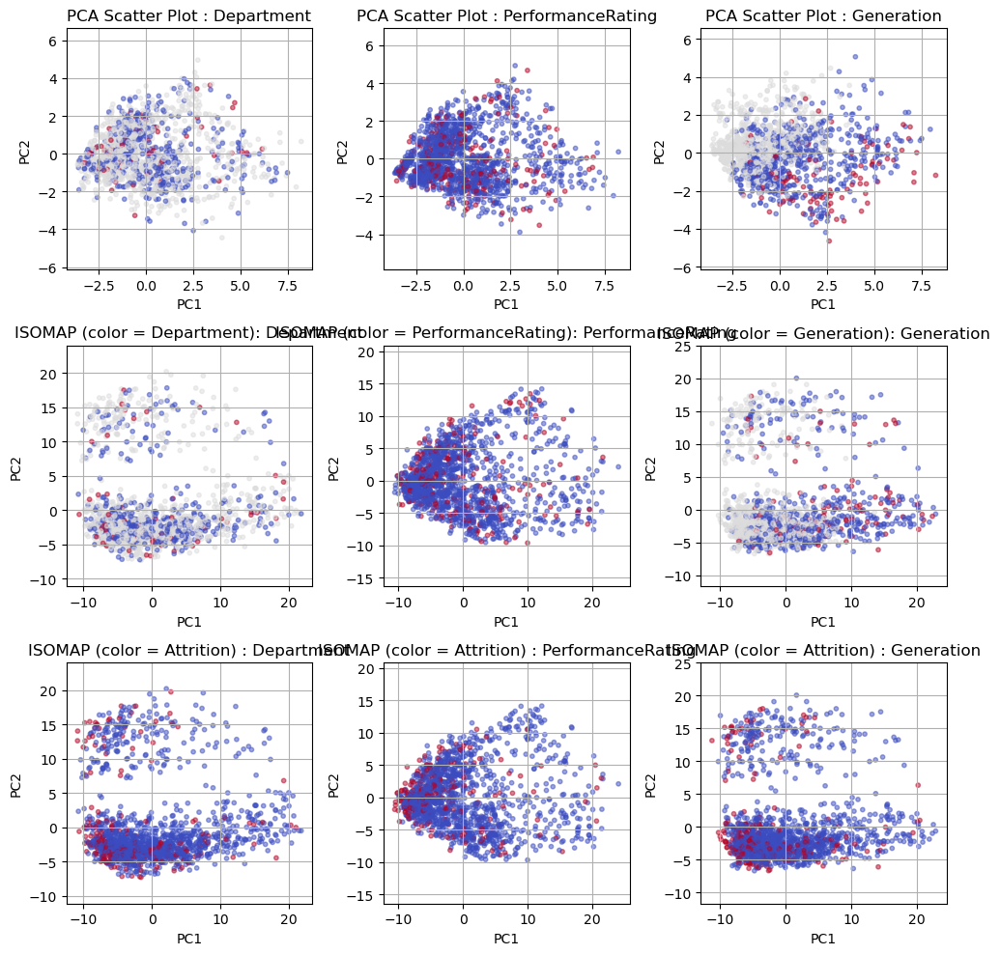

In [7]:
# PCA

# Notice that it is just to roughly check how the data is structured. Therefore potential outliers were not removed.
# Considering low explained variance ratio, it could be not fully representing the data.

# Attrition variable transformation
category_check_data["Attrition"] = category_check_data["Attrition"].apply(lambda x : 1 if x == "Yes" else 0)

fig, ax = plt.subplots(3, 3, figsize = (10, 10))

for i in range(len(category)) :
    row = i // 3
    col = i % 3
    
    # assign numbers to unique values in each category (ex. Sales = 1, Research & Development = 2, HR = 3)
    unique_cate = category_check_data[category[i]].unique()
    category_mapping = {cate: j+1 for j, cate in enumerate(unique_cate)}
    category_check = category_check_data[category[i]].replace(category_mapping) 
    
    # create dummy variables from predictors
    data_pca_check = pd.get_dummies(category_check_data.drop(columns = category[i]).drop(columns=["Attrition"])) 
    data_numeric_col = data_pca_check.select_dtypes(include=['int64', 'float64']).columns
    
    # scaling numerical variables
    data_pca_check[data_numeric_col] = StandardScaler().fit(data_pca_check[data_numeric_col]).transform(data_pca_check[data_numeric_col]) 

    # PCA 
    pca = PCA(n_components =2).fit(data_pca_check)
    pc = pca.transform(data_pca_check)
    print(f'Cumulative explained variance of 2 PCs ({category[i]}) : {sum(pca.explained_variance_ratio_)}') 
    # plot
    ax[row, col].scatter(pc[:,0], pc[:,1], s=10, c=category_check, alpha=0.5, cmap="coolwarm")
    ax[row, col].set_title(f'PCA Scatter Plot : {category[i]}')
    ax[row, col].set_xlabel('PC1')  
    ax[row, col].set_ylabel('PC2')
    ax[row, col].axis('equal')
    ax[row, col].grid()

    # ISOMAP 
    isomap = Isomap(n_components=2, n_neighbors=5)
    X_reduced = isomap.fit_transform(data_pca_check)
    # plot (colors = category)
    ax[row+1, col].scatter(X_reduced[:,0], X_reduced[:,1], s=10, c=category_check, alpha=0.5, cmap="coolwarm")
    ax[row+1, col].set_title(f'ISOMAP (color = {category[i]}): {category[i]}')
    ax[row+1, col].set_xlabel('PC1')  
    ax[row+1, col].set_ylabel('PC2')
    ax[row+1, col].axis('equal')
    ax[row+1, col].grid()
    # plot (colors = attrition)
    ax[row+2, col].scatter(X_reduced[:,0], X_reduced[:,1], s=10, c=category_check_data["Attrition"], alpha=0.5, cmap="coolwarm")
    ax[row+2, col].set_title(f'ISOMAP (color = Attrition) : {category[i]}')
    ax[row+2, col].set_xlabel('PC1')  
    ax[row+2, col].set_ylabel('PC2')
    ax[row+2, col].axis('equal')
    ax[row+2, col].grid()
    
plt.tight_layout() 
plt.show()

C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.
  warnings.warn(


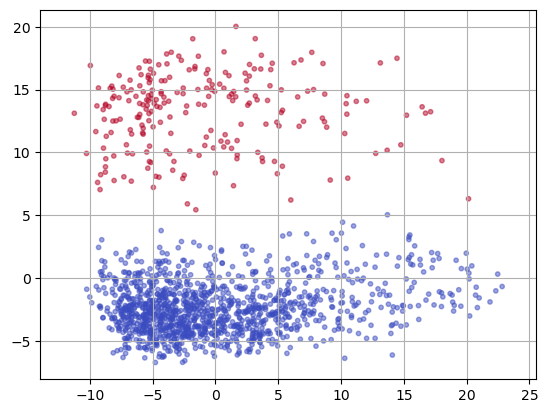

In [8]:
# ISOMAP with spectral clustering
spectral_clustering = SpectralClustering(n_clusters=2, affinity='rbf', n_neighbors=5, random_state=42)
y_pred = spectral_clustering.fit_predict(X_reduced[:,:2])

plt.figure()
plt.scatter(X_reduced[:,0], X_reduced[:,1], s=10, c=y_pred, alpha=0.5, cmap="coolwarm")
plt.axis('equal')
plt.grid()
plt.show()

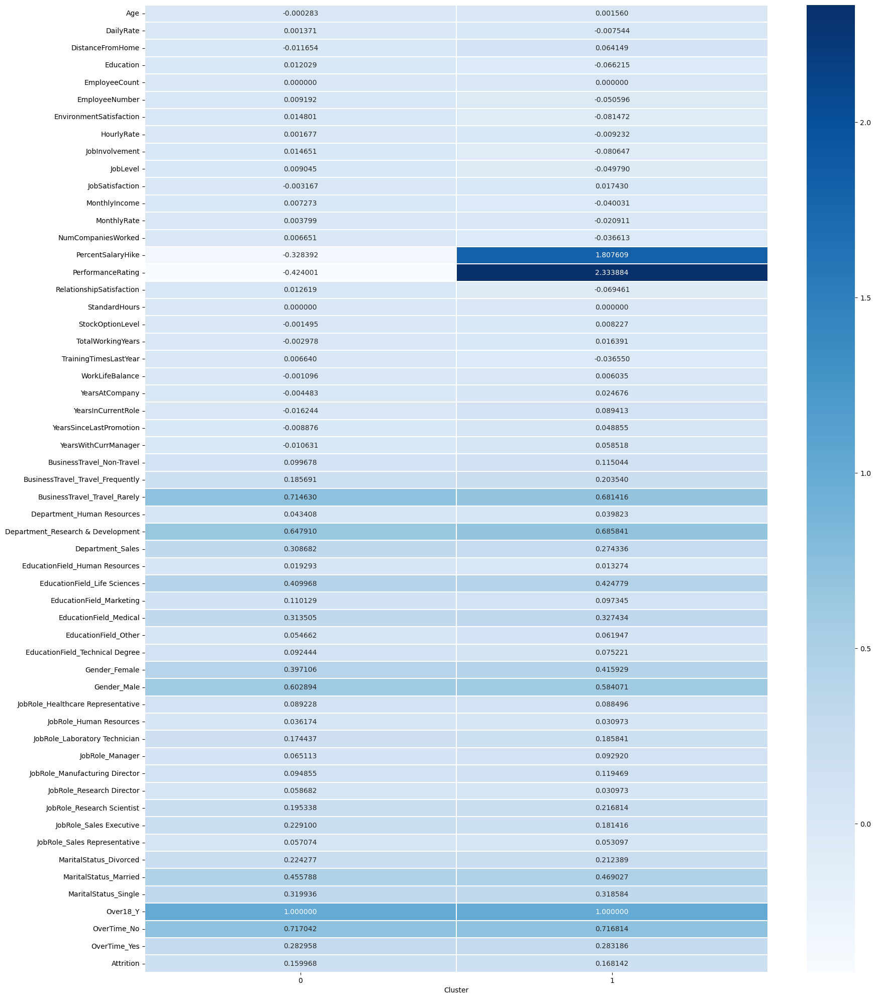

In [9]:
# checking the cluster
# interesting result is that data can be non linearly separable using PerformanceRating or PercentSalaryHike
# although Attrition does not seem to seperate the data well, these variables do 
# this is not related to our goal of this analysis, but this implies we could construct models that can predict PerformanceRating

data_pca_check["Cluster"] = y_pred
data_pca_check["Attrition"]= category_check_data["Attrition"]

data_pca_check[data_pca_check["Cluster"]==1].mean()
cluster_mean = data_pca_check.groupby(["Cluster"]).mean().T
plt.figure(figsize=(20, 25))
sns.heatmap(cluster_mean, annot = True, fmt='1f', linewidth = 0.1, annot_kws = {'fontsize':10}, cmap="Blues")
plt.show()

### 2. 3. ANOVA Test

In [10]:
# ANOVA based on groups of our interest
for i in range(len(category)) :
    unique_cate = category_check_data[category[i]].unique()
    unique_cate_data = []
    for j in unique_cate :
        unique_cate_data.append(category_check_data[category_check_data[category[i]] == j]['Attrition'].tolist())
    f_statistic, p_value = f_oneway(*unique_cate_data)
    print(f"F-statistic {category[i]}: ", f_statistic)
    print(f"p-value {category[i]}:", p_value, "\n")

# The result indicates that gruops with different PerformanceRating seem to show no difference in their means.

F-statistic Department:  5.426843272582724
p-value Department: 0.004485674813058454 

F-statistic PerformanceRating:  0.01225039553422336
p-value PerformanceRating: 0.9118840421067758 

F-statistic Generation:  14.520649244449514
p-value Generation: 5.693387735335216e-07 



### 2. 4. Data Preprocessing

In [11]:
# Attiriton variable transformation
data["Attrition"] = data["Attrition"].apply(lambda x : 1 if x == "Yes" else 0) 

# Check the EmployeeNumber duplication
print(f'# of duplicated Employee Number in the data : {sum(data["EmployeeNumber"].duplicated())}') # 0

# Remove duplicated or similar metrics variables
data = data.drop(columns = ["EmployeeCount", "EmployeeNumber", "DailyRate", "HourlyRate", "MonthlyRate",  
                            "MaritalStatus", "Over18", "StandardHours"])
# EmployeeCount : It's all 1
# EmployeeNumber : Just an indicator of each employee
# DailyRate, HourlyRate, MonthlyRate : For the simplicity of the problem, drop income measures beside MonthlyIncome
# MaritalStatus : Solution cannot be made regardless of the power of this variable
# Over18, StandardHours : All data points have the same values in these variables 

# check the number of the variables in new data
print(f'The number of the variables in after the data preprocess : {len(data.columns)}')

# of duplicated Employee Number in the data : 0
The number of the variables in after the data preprocess : 27


## 3. Data Analysis (Department)

<font size = 3> The purpose of this analysis is to analyze the reasons why employees leave their jobs in each department and to build appropriate models that can help us identify potential employees attrition in advance.

## 3.1. Sales Department Analysis

### 3.1.1. Exploratory Data Analysis (Sales)

### 3.1.1.1. Distritbution

# of Attrition in Sales Department : 92
# of Non-Attrition in Sales Department : 354


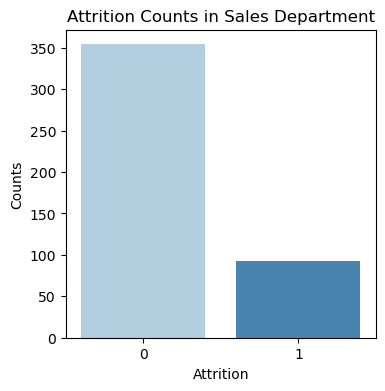

In [12]:
# Department set up 
data_HR = data.loc[data["Department"]=="Human Resources",]
data_RnD = data.loc[data["Department"]=="Research & Development",]
data_Sales = data.loc[data["Department"]=="Sales",]

X_HR = data_HR.drop(columns = ["Attrition", "Department"])
X_RnD = data_RnD.drop(columns = ["Attrition", "Department"])
X_Sales = data_Sales.drop(columns = ["Attrition", "Department"])

y_HR = data_HR["Attrition"]
y_RnD = data_RnD["Attrition"]
y_Sales = data_Sales["Attrition"]

data_Sales = data_Sales.drop(columns=["Department"])

# Attrition count plot
Sales_attriton = y_Sales.value_counts()
print(f'# of Attrition in Sales Department : {Sales_attriton[1]}')
print(f'# of Non-Attrition in Sales Department : {Sales_attriton[0]}')
plt.figure(figsize=(4, 4))
sns.countplot(data=data_Sales, x="Attrition", palette="Blues")
plt.title("Attrition Counts in Sales Department")
plt.xlabel("Attrition")
plt.ylabel("Counts")
plt.xticks(rotation=0)
plt.show()

# The data is imbalanced.

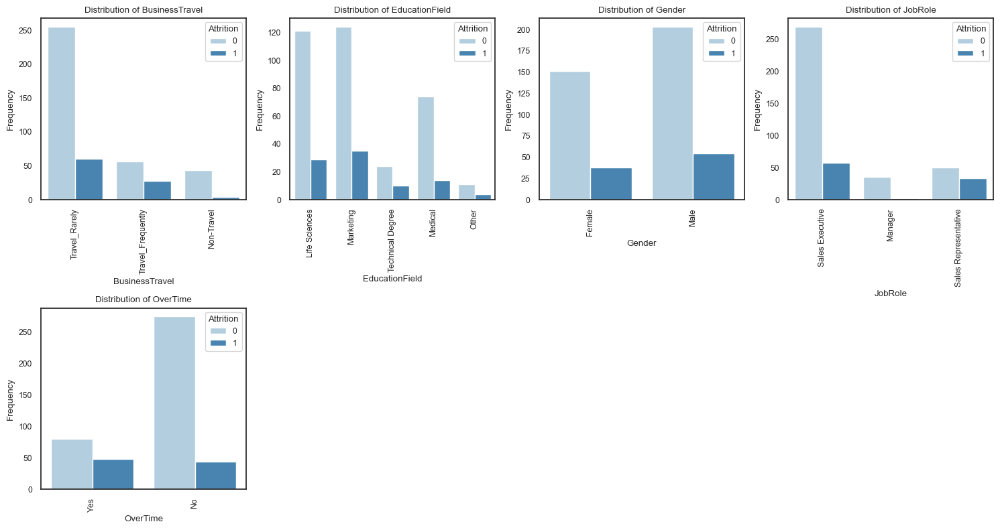

In [13]:
# Categorical variables count plot

# set up the categorical columns
cate_cols = X_Sales.select_dtypes(include=['object']).columns

# counter plot for categorical variables
sns.set(font_scale=0.8)
sns.set_style("white")

# calculate the number of rows/columns needed for subplots
n_rows = int(np.ceil(len(cate_cols) / 4)) 

plt.figure(figsize=(15, n_rows * 4))  # Dynamic figure size

for i, col in enumerate(cate_cols, 1): 
    plt.subplot(n_rows, 4, i)  
    sns.countplot(x=cate_cols[i-1], data=X_Sales, palette='Blues', hue=y_Sales) 
    plt.title(f"Distribution of {col}")
    plt.xlabel(f"{col}")
    plt.ylabel('Frequency')
    plt.tick_params(axis='x', rotation=90)

plt.tight_layout() 
plt.show()

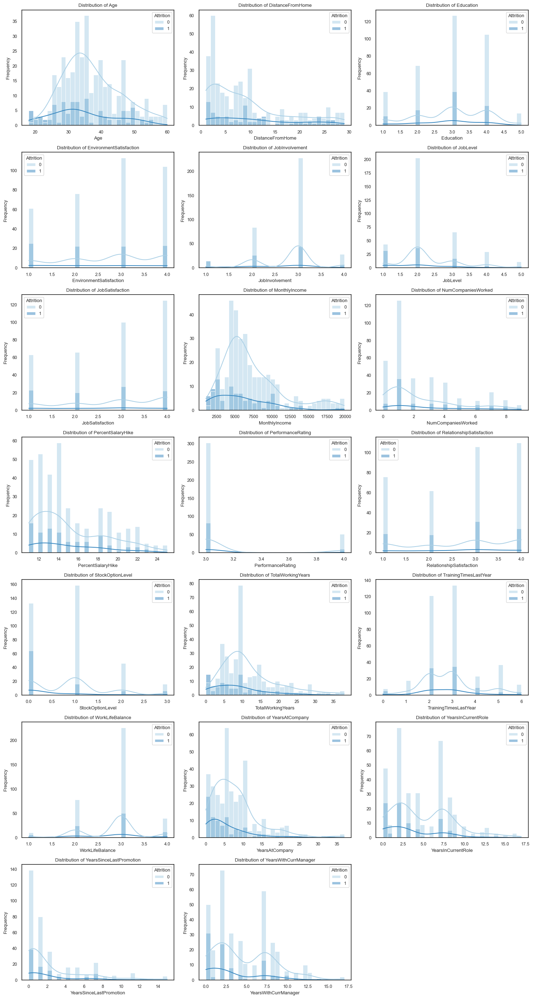

In [14]:
# Numerical variables distribution

# set up the numerical columns
numeric_cols = X_Sales.select_dtypes(include=['int64', 'float64']).columns

# calculate the number of rows/columns needed for subplots
n_rows = int(np.ceil(len(numeric_cols) / 3))  

plt.figure(figsize=(15, n_rows * 4)) 

for i, col in enumerate(numeric_cols, 1): 
    plt.subplot(n_rows, 3, i)  
    sns.histplot(data=X_Sales, x=col, bins=30, palette='Blues', hue=y_Sales, kde=True) 
    plt.title(f"Distribution of {col}")
    plt.xlabel(f"{col}")
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [15]:
# First year seems to be very important factor in Attrition

In [16]:
print(data_Sales["JobInvolvement"].value_counts(), "\n")
print(data_Sales["JobLevel"].value_counts(), "\n")
print(data_Sales["NumCompaniesWorked"].value_counts(), "\n")
print(data_Sales["StockOptionLevel"].value_counts(), "\n")
print(data_Sales["TrainingTimesLastYear"].value_counts(), "\n")
print(data_Sales["WorkLifeBalance"].value_counts())

JobInvolvement
3    272
2    110
4     35
1     29
Name: count, dtype: int64 

JobLevel
2    240
3     83
1     76
4     34
5     13
Name: count, dtype: int64 

NumCompaniesWorked
1    162
0     65
3     46
2     45
4     39
7     26
5     20
8     17
6     17
9      9
Name: count, dtype: int64 

StockOptionLevel
0    197
1    175
2     52
3     22
Name: count, dtype: int64 

TrainingTimesLastYear
3    169
2    154
5     41
4     32
1     20
6     17
0     13
Name: count, dtype: int64 

WorkLifeBalance
3    276
2    102
4     52
1     16
Name: count, dtype: int64


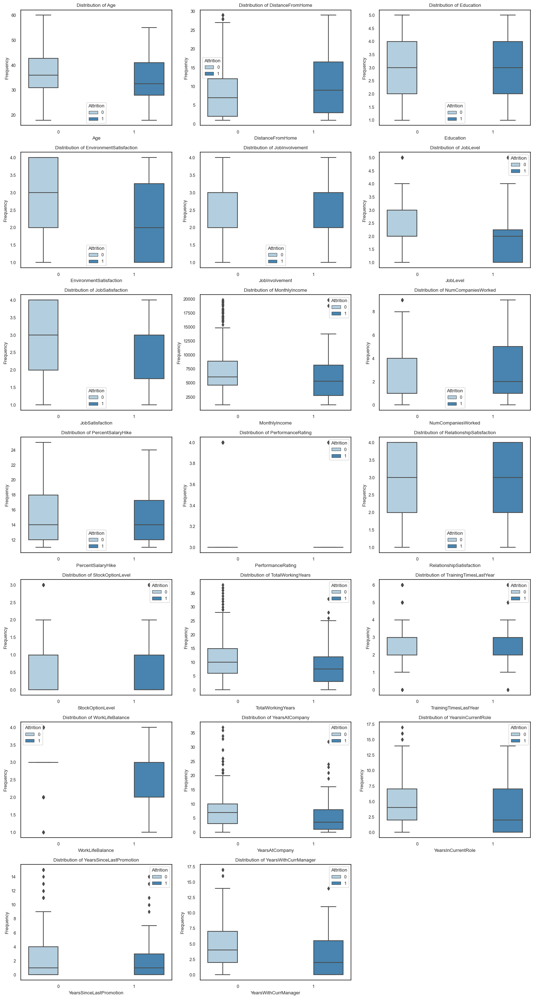

In [17]:
# Numerical variables distribution

# set up the numerical columns
numeric_cols = X_Sales.select_dtypes(include=['int64', 'float64']).columns

# calculate the number of rows/columns needed for subplots
n_rows = int(np.ceil(len(numeric_cols) / 3))  

plt.figure(figsize=(15, n_rows * 4)) 

for i, col in enumerate(numeric_cols, 1): 
    plt.subplot(n_rows, 3, i)  
#     sns.histplot(data=X_Sales, x=col, bins=30, palette='Blues', hue=y_Sales, kde=True) 
    sns.boxplot(x = "Attrition", y = col, data=data_Sales, palette='Blues', hue=y_Sales)
    plt.title(f"Distribution of {col}")
    plt.xlabel(f"{col}")
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

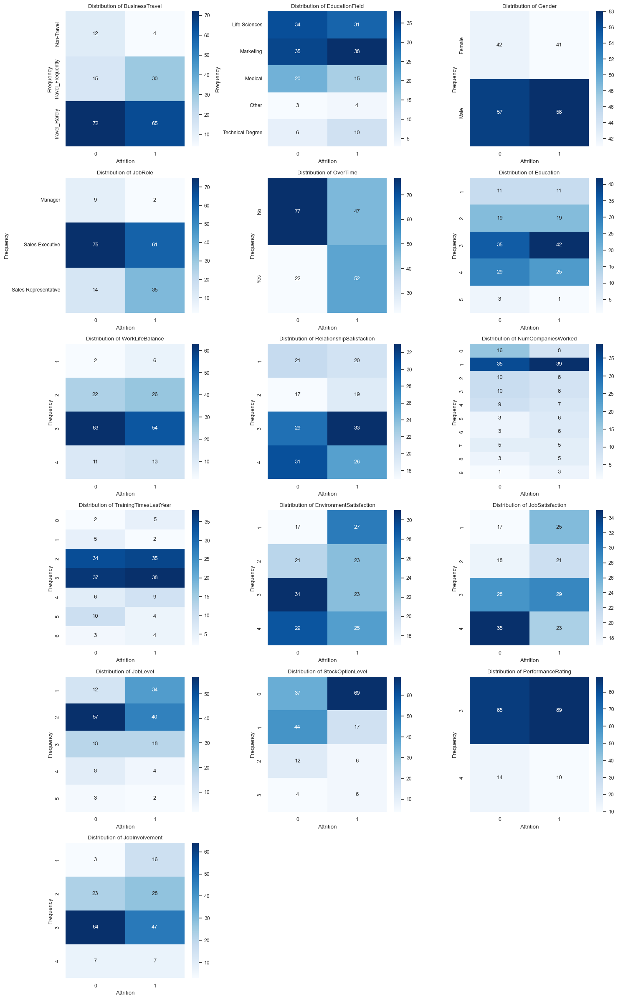

In [18]:
# Heatmap check for categorical col + numerical col(categorical order)

# set up the numerical columns that contain increasing order categories and combine them with categorical columns
numeric_cate_cols = list(set(numeric_cols) - set(["Age", "DistanceFromHome", "MonthlyIncome", "PercentSalaryHike", "TotalWorkingYears",
                                         "YearsAtCompany", "YearsInCurrentRole", "YearsSinceLastPromotion", 
                                          "YearsWithCurrManager"]))
cate_numerical_cate_col = list(cate_cols) + numeric_cate_cols

# calculate the number of rows/columns needed for subplots
n_rows = int(np.ceil(len(cate_numerical_cate_col) / 3))  

plt.figure(figsize=(15, n_rows * 4)) 

for i, col in enumerate(cate_numerical_cate_col, 1): 
    # percentage of each category in each variable
    grouped_data = data_Sales.groupby([col, 'Attrition']).size().unstack() 
    row_sums = grouped_data.sum(axis=0)
    grouped_data_percentage = (grouped_data.div(row_sums, axis=1) * 100).astype(int)
    
    plt.subplot(n_rows, 3, i)  
    sns.heatmap(grouped_data_percentage, cmap="Blues", annot=True, fmt="d")
    plt.title(f"Distribution of {col}")
    plt.xlabel("Attrition")
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# So far, some of the variables seem to have impact on the target variable (BusinessTravel, OverTime, etc), while some of them
# do not seem to influence much on the target variable (Gender, EducationField, WorkLifeBalance, PerformanceRating, etc.)

In [19]:
# Variable range adjustment
# certain categories within the variables occupy significantly smaller proportions compared to others.
# it might be beneficial to combine these less represented categories within each variable to avoid the overfitting issue.

data_Sales = data_Sales.copy() 
data_Sales["Education"] = data_Sales["Education"].apply(lambda x : 4 if x ==5 else x)
# data_Sales["JobInvolvement"] = data_Sales["JobInvolvement"].apply(lambda x : 2 if x ==1 else(3 if x==4 else x))
data_Sales["JobLevel"] = data_Sales["JobLevel"].apply(lambda x : 4 if x ==5 else x)
data_Sales["NumCompaniesWorked"] = data_Sales["NumCompaniesWorked"].apply(lambda x : 5 if x >= 5 else x)
data_Sales["StockOptionLevel"] = data_Sales["StockOptionLevel"].apply(lambda x : 2 if x >=2 else x)
data_Sales["TrainingTimesLastYear"] = data_Sales["TrainingTimesLastYear"].apply(lambda x : 2 if x <=2 else (3 if x>=3 else x))
data_Sales["WorkLifeBalance"] = data_Sales["WorkLifeBalance"].apply(lambda x : 2 if x <=2 else x)

### 3.1.1.2. Outlier Check

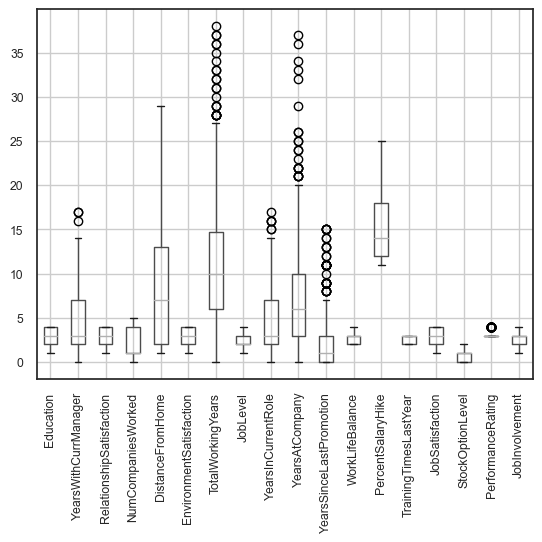

<Figure size 640x480 with 0 Axes>

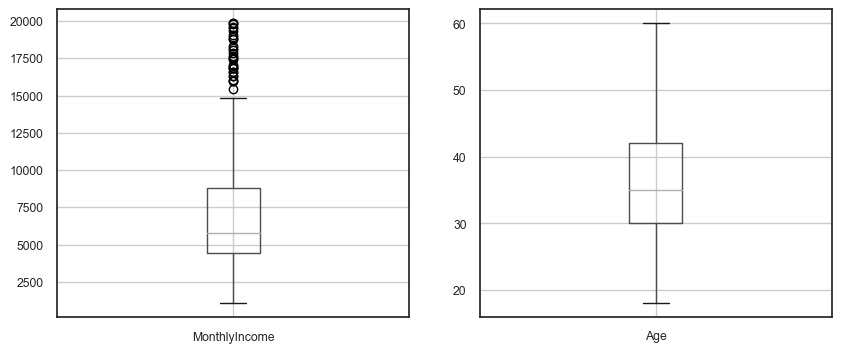

In [20]:
# outlier check for numerical variables

data_Sales.boxplot(column=list(set(numeric_cols) - {"MonthlyIncome", "Age"}), rot = 90) 
plt.figure()
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
pd.DataFrame(data_Sales["MonthlyIncome"]).boxplot(column="MonthlyIncome", ax=ax[0])
pd.DataFrame(data_Sales["Age"]).boxplot(column="Age", ax=ax[1])
plt.show()

In [21]:
# Potential outliers transformed to the max value in each variable
outlier_group_list = ["TotalWorkingYears", "YearsInCurrentRole", "YearsAtCompany", "MonthlyIncome", 
                      "YearsSinceLastPromotion", "YearsWithCurrManager"]

# Here, PerformanceRating only contains 2 categories. Therefore, outliers in PerformanceRating are not removed.

for i in outlier_group_list :
    q1 = np.percentile(data_Sales[i],25)
    q3 = np.percentile(data_Sales[i],75)
    iqr = q3-q1
    upper_bound = q3 + 1.5 * iqr
    lower_bound = q1 - 1.5 * iqr
    data_Sales.loc[data_Sales[i] > upper_bound, i] = upper_bound
    data_Sales.loc[data_Sales[i] < lower_bound, i] = lower_bound

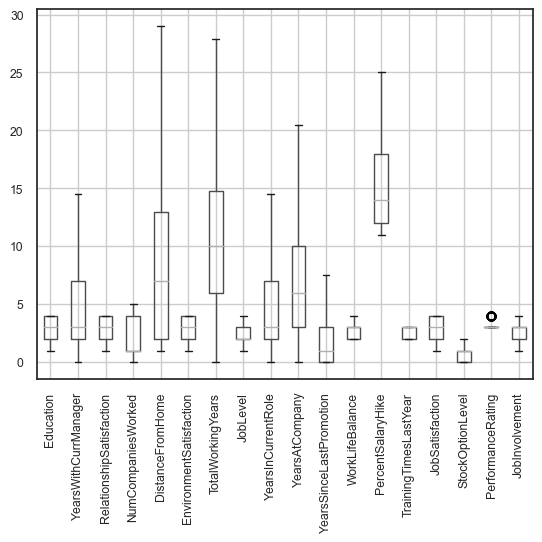

<Figure size 640x480 with 0 Axes>

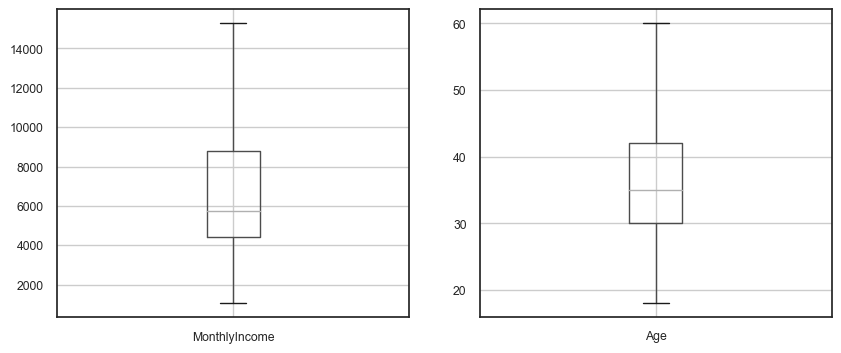

In [22]:
# Boxplot check again
data_Sales.boxplot(column=list(set(numeric_cols) - {"MonthlyIncome", "Age"}), rot = 90) 
plt.figure()
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
pd.DataFrame(data_Sales["MonthlyIncome"]).boxplot(column="MonthlyIncome", ax=ax[0])
pd.DataFrame(data_Sales["Age"]).boxplot(column="Age", ax=ax[1])
plt.show()

### 3.1.1.3. Correlation

<Axes: >

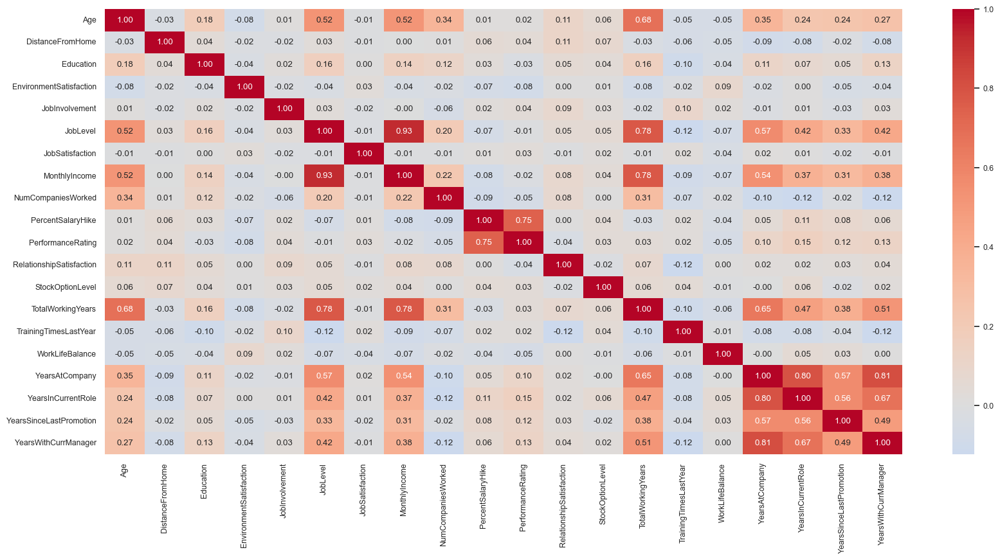

In [23]:
# re-define data after outlier adjustment, and create dummy variables for categorical variables
X_Sales = data_Sales.drop(columns = ["Attrition"])
data_Sales = pd.concat([pd.DataFrame(y_Sales), pd.get_dummies(X_Sales)], axis=1) # dummy creation
X_Sales = data_Sales.drop(columns = ["Attrition"])

# correlation among numerical variables
corr_df = X_Sales[numeric_cols].corr() 
corr_df_x = corr_df.sort_index().sort_index(axis=1) 
plt.figure(figsize=(20,9))
sns.heatmap(corr_df_x, annot=True, fmt=".2f", cmap="coolwarm", center=0) 

# Joblevel, MonthlyIncome seems to be correlated 

<Axes: >

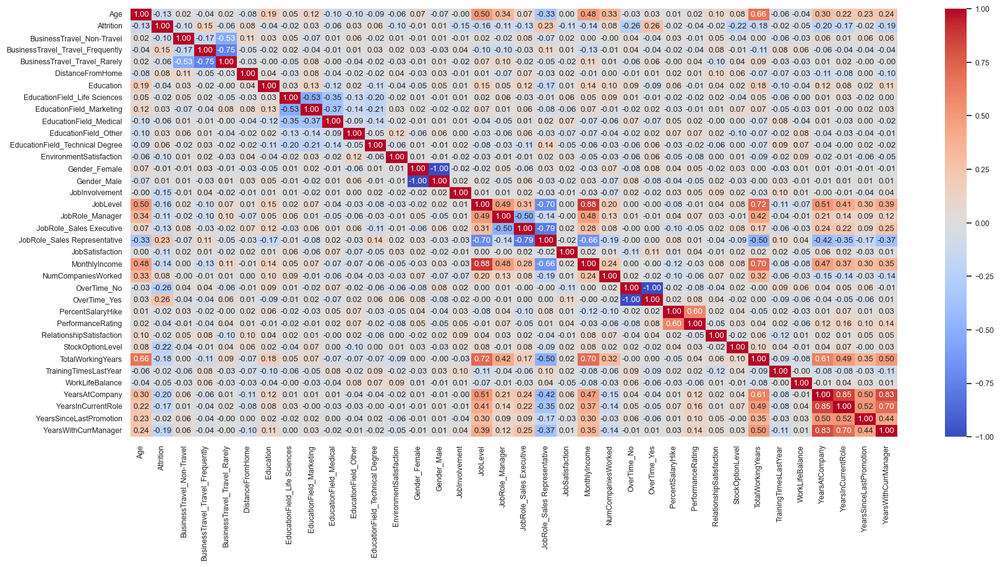

In [24]:
# correlations among all variables, using spearman
corr_df1 = data_Sales.corr(method="spearman")
corr_df_x1 = corr_df1.sort_index().sort_index(axis=1) 
plt.figure(figsize=(20,9))
sns.heatmap(corr_df_x1, annot=True, fmt=".2f", cmap="coolwarm", center=0) 

# No significant correlation exists, even with the target variable

In [25]:
# R result
# table is VIF result in R. As we had a categorical variable, GVIF^(1/(2*Df)) can be considered this time,
# and 3.16 is equivalent to VIF 10 approximately. Therefore, we can assume that there is no potential multicollinearity issue 

# > vif(model)
#                              GVIF Df GVIF^(1/(2*Df))
# Age                      2.095281  1        1.447509
# BusinessTravel           1.132179  2        1.031523
# DistanceFromHome         1.087487  1        1.042826
# Education                1.120690  1        1.058626
# EducationField           1.301817  4        1.033520
# EnvironmentSatisfaction  1.061357  1        1.030222
# Gender                   1.037067  1        1.018365
# JobInvolvement           1.050298  1        1.024840
# JobLevel                 9.664461  1        3.108772
# JobRole                  4.686324  2        1.471323
# JobSatisfaction          1.041598  1        1.020587
# MonthlyIncome            9.556177  1        3.091307
# NumCompaniesWorked       1.476353  1        1.215053
# OverTime                 1.088236  1        1.043185
# PercentSalaryHike        2.415778  1        1.554277
# PerformanceRating        2.408074  1        1.551797
# RelationshipSatisfaction 1.095680  1        1.046747
# StockOptionLevel         1.070159  1        1.034485
# TotalWorkingYears        5.334525  1        2.309659
# TrainingTimesLastYear    1.107807  1        1.052524
# WorkLifeBalance          1.057462  1        1.028330
# YearsAtCompany           6.411382  1        2.532071
# YearsInCurrentRole       3.195010  1        1.787459
# YearsSinceLastPromotion  1.670545  1        1.292496
# YearsWithCurrManager     3.272589  1        1.809030

### 3.1.1.4. PCA, ISOMAP Plot of Sales Department

LinearRegression score : 0.3006 

Cumulative explained variance of 2 PCs (Sales Dept.) : 0.3084


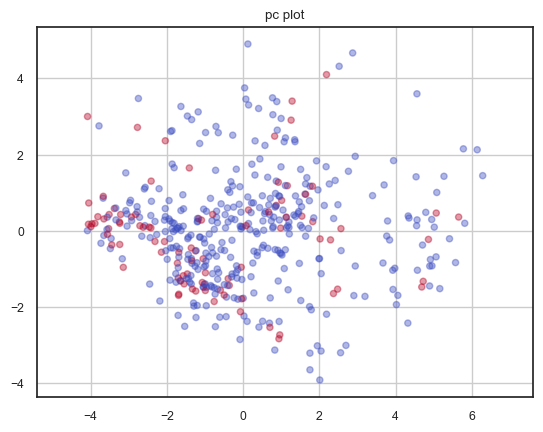

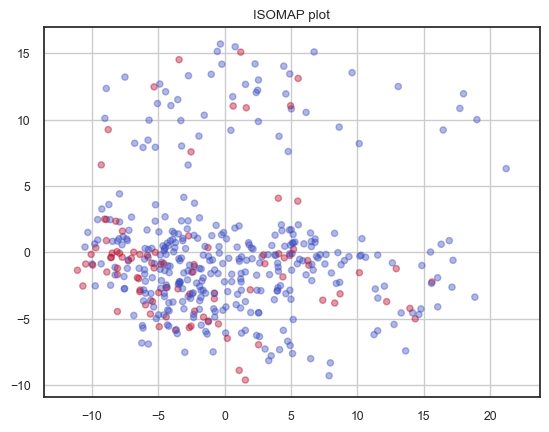

In [26]:
# Check the linearity
X_train, X_test, y_train, y_test = train_test_split(X_Sales, y_Sales, train_size = 0.8, test_size=0.2, random_state=42)

X_train[numeric_cols] = StandardScaler().fit(X_train[numeric_cols]).transform(X_train[numeric_cols]) 
X_test[numeric_cols] = StandardScaler().fit(X_test[numeric_cols]).transform(X_test[numeric_cols])

linear = LinearRegression()
linear.fit(X_train, y_train)
print(f'LinearRegression score : {round(linear.score(X_train, y_train),4)}', "\n") # non - linear


# PCA
X_Sales_pca = X_Sales.copy()
X_Sales_pca[numeric_cols] = StandardScaler().fit(X_Sales_pca[numeric_cols]).transform(X_Sales_pca[numeric_cols]) 

pca = PCA(n_components =2).fit(X_Sales_pca)
pc = pca.transform(X_Sales_pca)
print(f'Cumulative explained variance of 2 PCs (Sales Dept.) : {round(sum(pca.explained_variance_ratio_),4)}') 

plt.figure()
plt.scatter(pc[:,0], pc[:,1], s=20, c=y_Sales, alpha = 0.4, cmap = "coolwarm")
plt.axis('equal')
plt.grid()
plt.title('pc plot')
plt.show() 

# ISOMAP
isomap = Isomap(n_components=2, n_neighbors=5)
X_reduced = isomap.fit_transform(X_Sales_pca)

plt.figure()
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], s=20, c=y_Sales, alpha = 0.4, cmap = "coolwarm")
plt.axis('equal')
plt.grid()
plt.title('ISOMAP plot')
plt.show() 

In [27]:
print(f'The # of variables including dummy variables is : {len(X_Sales.columns)}')

numerical_cols = X_Sales.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X_Sales.select_dtypes(include=['bool']).columns
list(X_Sales.columns)

The # of variables including dummy variables is : 35


['Age',
 'DistanceFromHome',
 'Education',
 'EnvironmentSatisfaction',
 'JobInvolvement',
 'JobLevel',
 'JobSatisfaction',
 'MonthlyIncome',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager',
 'BusinessTravel_Non-Travel',
 'BusinessTravel_Travel_Frequently',
 'BusinessTravel_Travel_Rarely',
 'EducationField_Life Sciences',
 'EducationField_Marketing',
 'EducationField_Medical',
 'EducationField_Other',
 'EducationField_Technical Degree',
 'Gender_Female',
 'Gender_Male',
 'JobRole_Manager',
 'JobRole_Sales Executive',
 'JobRole_Sales Representative',
 'OverTime_No',
 'OverTime_Yes']

### 3.1.2. Feature Selection 

In [28]:
# In feature selection, we are considering f1 score as a performance metrics here 
# as we are focused on true positive, which is Attrition_Yes.

In [29]:
# modeling function
def modeling(model, X_train, X_test, y_train, y_test):
    model.fit(X_train,y_train)
    ypred = model.predict(X_test)
    return metrics(y_test, ypred)
    
# performance metrics function
def metrics(y_test, ypred):
    accuracy = accuracy_score(y_test,ypred)
    precision = precision_score(y_test,ypred)
    recall = recall_score(y_test,ypred)
    f1 = f1_score(y_test,ypred)
    roc_score = roc_auc_score(y_test,ypred,average='macro')
    result = {'accuracy': accuracy, 'precision': precision, 'recall': recall, 'f1': f1, 'roc_auc' : roc_score}
    return result

# define startified Kfold for CV later
stratified_kfold = StratifiedKFold(n_splits=10,
                                       shuffle=True,
                                       random_state=42)

### 3.1.2.1. LASSO

Best model searched for Lasso:
alpha = 0.006194549345149471
intercept = 0.32760778582417804
betas = [-2.51185846e-02  3.40565610e-02  2.29964224e-03 -4.48332182e-02
 -5.34397396e-02  0.00000000e+00 -4.43775679e-02  0.00000000e+00
  4.80184747e-02 -0.00000000e+00 -1.39072880e-02 -5.88631780e-03
 -6.54706001e-02 -3.01489171e-02  0.00000000e+00 -8.21033461e-03
  0.00000000e+00 -5.02721312e-03  3.52601164e-02 -2.59055198e-02
 -4.81921600e-02  1.09225733e-01 -0.00000000e+00 -0.00000000e+00
  1.22267722e-02 -0.00000000e+00  0.00000000e+00  0.00000000e+00
 -1.63425188e-04  0.00000000e+00 -0.00000000e+00 -0.00000000e+00
  1.27908403e-01 -2.31297388e-01  8.75871702e-16], 


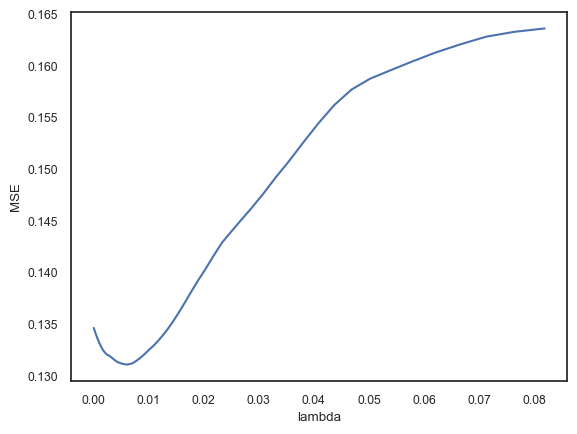

LASSO CV MSE best result : lambda = 0.006194549345149471, MSE = 0.1311292837502472


,variable,coef
0,Age,-2.511858e-02
1,DistanceFromHome,3.405656e-02
2,Education,2.299642e-03
3,EnvironmentSatisfaction,-4.483322e-02
4,JobInvolvement,-5.343974e-02
5,JobLevel,0.000000e+00
6,JobSatisfaction,-4.437757e-02
7,MonthlyIncome,0.000000e+00
8,NumCompaniesWorked,4.801847e-02
9,PercentSalaryHike,-0.000000e+00


In [30]:
lasso_model = LassoCV(cv = stratified_kfold, random_state=42, max_iter=10000) 

X_Sales_lasso = X_Sales.copy() 

# Scale the data before LASSO
X_Sales_lasso[numeric_cols] = StandardScaler().fit(X_Sales_lasso[numeric_cols]).transform(X_Sales_lasso[numeric_cols]) 

# LASSO : find the optimal parameter lambda
lasso_model.fit(X_Sales_lasso, y_Sales)

print("Best model searched for Lasso:\nalpha = {}\nintercept = {}\nbetas = {}, ".format(lasso_model.alpha_,
                                                                            lasso_model.intercept_,
                                                                            lasso_model.coef_
                                                                            ))
# LASSO CV MSE check
lasso_cv_min_mse_idx = np.argmin(np.mean(lasso_model.mse_path_,axis=1))
lasso_cv_mse = np.mean(lasso_model.mse_path_,axis=1)
plt.figure()
plt.plot(lasso_model.alphas_, lasso_cv_mse)
plt.xlabel("lambda")
plt.ylabel("MSE")
plt.show()
print(f'LASSO CV MSE best result : lambda = {lasso_model.alpha_}, MSE = {lasso_cv_mse[lasso_cv_min_mse_idx]}')


# LASSO : optimal parameter lambda fitting to the model
lasso_opt_model = Lasso(alpha=lasso_model.alpha_)
lasso_opt_model.fit(X_Sales_lasso, y_Sales) 

lasso_coef_df = pd.DataFrame({"variable" :list(X_Sales_lasso.columns), "coef":lasso_opt_model.coef_,})
lasso_coef_df

In [31]:
# Non-selected variables
non_selected_var_lasso = list(lasso_coef_df[lasso_coef_df["coef"]==0]["variable"].values)
print(f'The {len(non_selected_var_lasso)} non-selected variables from LASSO : {non_selected_var_lasso}')

The 13 non-selected variables from LASSO : ['JobLevel', 'MonthlyIncome', 'PercentSalaryHike', 'TrainingTimesLastYear', 'YearsAtCompany', 'BusinessTravel_Travel_Rarely', 'EducationField_Life Sciences', 'EducationField_Medical', 'EducationField_Other', 'EducationField_Technical Degree', 'Gender_Male', 'JobRole_Manager', 'JobRole_Sales Executive']


In [32]:
# Selected variables
selected_var_lasso =list(X_Sales_lasso.drop(columns=non_selected_var_lasso).columns)

print(f'The {len(selected_var_lasso)} selected variables from LASSO : {list(selected_var_lasso)}')

The 22 selected variables from LASSO : ['Age', 'DistanceFromHome', 'Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobSatisfaction', 'NumCompaniesWorked', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'WorkLifeBalance', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'BusinessTravel_Non-Travel', 'BusinessTravel_Travel_Frequently', 'EducationField_Marketing', 'Gender_Female', 'JobRole_Sales Representative', 'OverTime_No', 'OverTime_Yes']


In [33]:
# Selected variables applied to Logistic model
X_Sales_lasso_opt = X_Sales_lasso.drop(columns=non_selected_var_lasso) 
X_Sales_lasso_numeric_cols = X_Sales_lasso_opt.select_dtypes(include=['int64', 'float64']).columns

# LASSO
lasso_result = {'accuracy': 0, 'precision': 0, 'recall': 0, 'f1': 0, 'roc_auc' : 0}

np.random.seed(42)

# Test on Logistic regression with 50 different split
for c in range(50) :
    X_train, X_test, y_train, y_test = train_test_split(X_Sales_lasso_opt, y_Sales, train_size = 0.8, test_size=0.2)

    X_train[X_Sales_lasso_numeric_cols] = StandardScaler().fit(X_train[X_Sales_lasso_numeric_cols]).\
    transform(X_train[X_Sales_lasso_numeric_cols]) 
    X_test[X_Sales_lasso_numeric_cols] = StandardScaler().fit(X_test[X_Sales_lasso_numeric_cols]).\
    transform(X_test[X_Sales_lasso_numeric_cols]) 
        
    logit = LogisticRegression()
    lasso_metrics = modeling(logit, X_train, X_test, y_train, y_test)
    for metric, score in lasso_metrics.items() :
        lasso_result[metric] += score

print("Logistic Regression (cv=50) result, using selected variables from LASSO :")
{key: value / 50 for key, value in lasso_result.items()}

Logistic Regression (cv=50) result, using selected variables from LASSO :


{'accuracy': 0.8539999999999998,
 'precision': 0.7065240304071574,
 'recall': 0.49627016308275557,
 'f1': 0.5755930942161293,
 'roc_auc': 0.7218274090448624}

### 3.1.2.2. SelectKbest (Mutual Information, Chi-Squared, ANOVA)

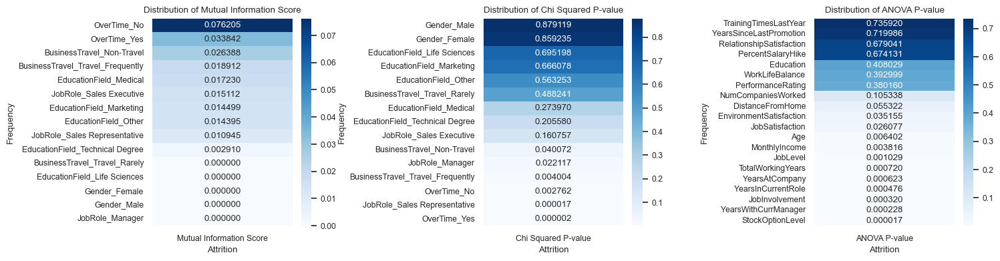

In [34]:
np.random.seed(42)

# filter categorical variables (Mutual Information)
kbest_MI = SelectKBest(score_func = mutual_info_classif, k = 'all')
# kbest_MI_fit = kbest_MI.fit(X_train_smt[categorical_cols], y_train_smt)
kbest_MI_fit = kbest_MI.fit(X_Sales[categorical_cols], y_Sales) 

kbest_MI_result = pd.DataFrame(data = kbest_MI_fit.scores_, index = list(X_Sales[categorical_cols].columns), 
                             columns = ['Mutual Information Score']).sort_values(by = "Mutual Information Score", 
                                                                                 ascending=False)  # MI gives only score

# filter categorical variables (Chi Squared)
kbest_chi = SelectKBest(score_func = chi2, k = 'all')
# kbest_chi_fit = kbest_chi.fit(X_train_smt[categorical_cols], y_train_smt)
kbest_chi_fit = kbest_chi.fit(X_Sales[categorical_cols], y_Sales)


kbest_chi_result = pd.DataFrame(data = kbest_chi_fit.pvalues_, index = list(X_Sales[categorical_cols].columns), 
                             columns = ['Chi Squared P-value']).sort_values(by = "Chi Squared P-value", ascending=False) \
                                # Chi Sqaured p value 

# filter numerical variables (ANOVA)
kbest_anova = SelectKBest(score_func = f_classif, k = 'all')
# kbest_anova_fit = kbest_anova.fit(X_train_smt[numerical_cols], y_train_smt)

# numerical variables scaling
X_Sales_anova = X_Sales.copy()
X_Sales_anova[numeric_cols] = StandardScaler().fit(X_Sales_anova[numeric_cols]).transform(X_Sales_anova[numeric_cols]) 

kbest_anova_fit = kbest_anova.fit(X_Sales_anova[numerical_cols], y_Sales)


kbest_anova_result = pd.DataFrame(data = kbest_anova_fit.pvalues_, index = list(X_Sales_anova[numerical_cols].columns), 
                             columns = ['ANOVA P-value']).sort_values(by = "ANOVA P-value", ascending=False) 

kbest_results = [kbest_MI_result, kbest_chi_result, kbest_anova_result]

plt.figure(figsize=(15, 1 * 4)) 

for i, kbest in enumerate(kbest_results, 1): 
    plt.subplot(1, 3, i)  
    sns.heatmap(kbest, cmap="Blues", annot=True, fmt="f")
    plt.title(f"Distribution of {list(kbest.columns)[0]}")
    plt.xlabel("Attrition")
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Based on the results, the MI result implies none of the categorical variables has much relation with Attrition
# the Chi-squared result indicates that some categorical variables significant 
# the ANOVA result shows that some variables are not significant

In [35]:
kbest_selected_categorical = kbest_chi_result[(kbest_chi_result <= 0.05).any(axis=1)].index 
kbest_selected_numerical = kbest_anova_result[(kbest_anova_result <= 0.05).any(axis=1)].index

kbest_selected_cols = list(kbest_selected_categorical) + list(kbest_selected_numerical)
print(f'The {len(kbest_selected_cols)} selected variables from SelectKbest : {kbest_selected_cols}', "\n")

kbest_nonselected_cols = list(set(X_Sales.columns) - set(kbest_selected_cols))
print(f'The {len(kbest_nonselected_cols)} non-selected variables from SelectKbest : {kbest_nonselected_cols}')

The 17 selected variables from SelectKbest : ['BusinessTravel_Non-Travel', 'JobRole_Manager', 'BusinessTravel_Travel_Frequently', 'OverTime_No', 'JobRole_Sales Representative', 'OverTime_Yes', 'EnvironmentSatisfaction', 'JobSatisfaction', 'Age', 'MonthlyIncome', 'JobLevel', 'TotalWorkingYears', 'YearsAtCompany', 'YearsInCurrentRole', 'JobInvolvement', 'YearsWithCurrManager', 'StockOptionLevel'] 

The 18 non-selected variables from SelectKbest : ['Education', 'YearsSinceLastPromotion', 'RelationshipSatisfaction', 'WorkLifeBalance', 'Gender_Female', 'NumCompaniesWorked', 'JobRole_Sales Executive', 'PercentSalaryHike', 'Gender_Male', 'EducationField_Technical Degree', 'DistanceFromHome', 'EducationField_Other', 'TrainingTimesLastYear', 'EducationField_Marketing', 'EducationField_Life Sciences', 'EducationField_Medical', 'BusinessTravel_Travel_Rarely', 'PerformanceRating']


In [36]:
# Applying to Logistic Regression, using selected variables form Kbest
X_Sales_kbest = X_Sales[kbest_selected_cols]

# Kbest result
kbest_result = {'accuracy': 0, 'precision': 0, 'recall': 0, 'f1': 0, 'roc_auc' : 0}

np.random.seed(42)

# Test on Logistic regression with 50 different split
for c in range(50) :
    X_train, X_test, y_train, y_test = train_test_split(X_Sales_kbest, y_Sales, train_size = 0.8, test_size=0.2)

    X_train[kbest_selected_numerical] = StandardScaler().fit(X_train[kbest_selected_numerical]).\
    transform(X_train[kbest_selected_numerical]) 
    X_test[kbest_selected_numerical] = StandardScaler().fit(X_test[kbest_selected_numerical]).\
    transform(X_test[kbest_selected_numerical]) 
  
    logit = LogisticRegression()
    kbest_metrics = modeling(logit, X_train, X_test, y_train, y_test)
    for metric, score in kbest_metrics.items() :
        kbest_result[metric] += score

print("Logistic Regression (cv=50) result, using selected variables from Kbest :")
{key: value / 50 for key, value in kbest_result.items()}

Logistic Regression (cv=50) result, using selected variables from Kbest :


{'accuracy': 0.8388888888888887,
 'precision': 0.6862898833192952,
 'recall': 0.4072185498427926,
 'f1': 0.501015101794596,
 'roc_auc': 0.6794370705722993}

### 3.1.2.3. Tree-based Selection method

In [37]:
# Random Forest 
clf_result_num = {}

# check different number of the variables used
for i in range(len(X_Sales.columns)) :
    clf = RandomForestClassifier(n_estimators=100)
    
    clf_fit = clf.fit(X_Sales, y_Sales) # no scaling needed for RF
    clf_features = pd.DataFrame(clf_fit.feature_importances_, index=list(X_Sales.columns), 
                                columns=["features"]).sort_values(by="features", ascending=False)
    clf_selected_features = clf_features.head(i+1).index 
    X_Sales_clf = X_Sales[clf_selected_features] 
    X_Sales_clf_numeric = X_Sales_clf.select_dtypes(include=("int64", "float")).columns

    clf_result = []
    clf_coef = {}
  
    np.random.seed(42)
    
    # run CV with Logistic Regression for each different number of variables
    for c in range(50) :
        X_train, X_test, y_train, y_test = train_test_split(X_Sales_clf, y_Sales, train_size = 0.8, test_size=0.2)

        X_train[X_Sales_clf_numeric] = StandardScaler().fit(X_train[X_Sales_clf_numeric]).transform(X_train[X_Sales_clf_numeric])
        X_test[X_Sales_clf_numeric] = StandardScaler().fit(X_test[X_Sales_clf_numeric]).transform(X_test[X_Sales_clf_numeric]) 
        
        logit = LogisticRegression()
        clf_fit = logit.fit(X_train, y_train).predict(X_test)
        clf_f1 = f1_score(y_test, clf_fit)
        clf_result.append(clf_f1)
        clf_coef[c]=clf.feature_importances_
    clf_result_num[i+1] = np.mean(clf_result)

print(clf_result_num)

{1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.00396135265700483, 6: 0.09894798912966904, 7: 0.1048818427062336, 8: 0.10849726188870455, 9: 0.2399240130429904, 10: 0.23193074614850173, 11: 0.274754558138576, 12: 0.42167424887883925, 13: 0.424328020091342, 14: 0.4693219738249333, 15: 0.47119262936943845, 16: 0.4770208806217855, 17: 0.5046034972127901, 18: 0.4921429825079304, 19: 0.49484299321489333, 20: 0.5009020058118364, 21: 0.5222767622880682, 22: 0.5281148494919364, 23: 0.5681164508715449, 24: 0.5665345108004365, 25: 0.5598318465147286, 26: 0.5549440019213382, 27: 0.5555544651943848, 28: 0.5540414613858643, 29: 0.5544404189758528, 30: 0.5528719792290759, 31: 0.5509116583446582, 32: 0.5591291934920625, 33: 0.5612588262802116, 34: 0.5584679534339849, 35: 0.5575473650472631}


In [38]:
max_key = max(clf_result_num, key=clf_result_num.get)
max_value = clf_result_num[max_key]
max_key, max_value
print(f"Logistic Regression (cv=50) result, {max_key} variables with f1 score of {max_value} from Random Forest Classifier")

Logistic Regression (cv=50) result, 23 variables with f1 score of 0.5681164508715449 from Random Forest Classifier


In [39]:
clf = RandomForestClassifier(n_estimators=100)
clf_fit = clf.fit(X_Sales, y_Sales)
clf_features = pd.DataFrame(clf_fit.feature_importances_, index=list(X_Sales.columns), 
                            columns=["features"]).sort_values(by="features", ascending=False)
clf_selected_features = list(clf_features.head(max_key).index)

print(f'The {len(clf_selected_features)} selected variables from Random Forest Classifier : {clf_selected_features}', "\n")
rf_nonselected_cols = list(set(X_Sales.columns) - set(X_Sales[clf_selected_features]))
print(f'The {len(rf_nonselected_cols)} non-selected variables from Random Forest Classifier : {rf_nonselected_cols}')

The 23 selected variables from Random Forest Classifier : ['MonthlyIncome', 'DistanceFromHome', 'Age', 'TotalWorkingYears', 'YearsAtCompany', 'StockOptionLevel', 'PercentSalaryHike', 'YearsSinceLastPromotion', 'JobInvolvement', 'YearsWithCurrManager', 'JobSatisfaction', 'OverTime_Yes', 'YearsInCurrentRole', 'NumCompaniesWorked', 'RelationshipSatisfaction', 'OverTime_No', 'EnvironmentSatisfaction', 'WorkLifeBalance', 'Education', 'JobLevel', 'JobRole_Sales Representative', 'EducationField_Marketing', 'BusinessTravel_Travel_Frequently'] 

The 12 non-selected variables from Random Forest Classifier : ['JobRole_Manager', 'Gender_Female', 'Gender_Male', 'EducationField_Technical Degree', 'JobRole_Sales Executive', 'EducationField_Other', 'TrainingTimesLastYear', 'BusinessTravel_Non-Travel', 'EducationField_Life Sciences', 'EducationField_Medical', 'BusinessTravel_Travel_Rarely', 'PerformanceRating']


### 3.1.2.4 Forward Feature Selection Method

In [40]:
logit = LogisticRegression(max_iter=3000)
np.random.seed(42)
sfs = SequentialFeatureSelector(logit, direction="forward", scoring='f1', cv=stratified_kfold, n_features_to_select='auto')
# backward too slow

# numerical variables scaling
X_Sales_sfs = X_Sales.copy()
X_Sales_sfs[numeric_cols] = StandardScaler().fit(X_Sales_sfs[numeric_cols]).transform(X_Sales_sfs[numeric_cols]) 

sfs_fit = sfs.fit(X_Sales_sfs, y_Sales) 

selected_sfs = list(sfs_fit.get_feature_names_out())
print(f'The {len(selected_sfs)} selected variables are {selected_sfs}')

The 17 selected variables are ['Age', 'DistanceFromHome', 'Education', 'JobSatisfaction', 'NumCompaniesWorked', 'RelationshipSatisfaction', 'StockOptionLevel', 'YearsAtCompany', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'BusinessTravel_Non-Travel', 'BusinessTravel_Travel_Rarely', 'EducationField_Life Sciences', 'EducationField_Technical Degree', 'JobRole_Manager', 'OverTime_No', 'OverTime_Yes']


In [41]:
non_selected_sfs = list(set(X_Sales_sfs.columns)-set(list(sfs_fit.get_feature_names_out())))
print(f'The {len(non_selected_sfs)} non-selected variables are {non_selected_sfs}')

The 18 non-selected variables are ['WorkLifeBalance', 'Gender_Female', 'PercentSalaryHike', 'Gender_Male', 'JobRole_Sales Executive', 'JobRole_Sales Representative', 'MonthlyIncome', 'EducationField_Other', 'TrainingTimesLastYear', 'EnvironmentSatisfaction', 'EducationField_Marketing', 'TotalWorkingYears', 'EducationField_Medical', 'JobLevel', 'YearsInCurrentRole', 'PerformanceRating', 'JobInvolvement', 'BusinessTravel_Travel_Frequently']


In [42]:
# Apply the selected variables to Logistic Regression (cv=50)

X_Sales_sfs_opt = X_Sales_sfs[selected_sfs] 
X_Sales_sfs_opt_numeric = X_Sales_sfs_opt.select_dtypes(include=['int64', 'float64']).columns

# sfs result
sfs_result = {'accuracy': 0, 'precision': 0, 'recall': 0, 'f1': 0, 'roc_auc' : 0}

np.random.seed(42)

for c in range(50) :
    X_train, X_test, y_train, y_test = train_test_split(X_Sales_sfs_opt, y_Sales, train_size = 0.8, test_size=0.2)

    X_train[X_Sales_sfs_opt_numeric] = StandardScaler().fit(X_train[X_Sales_sfs_opt_numeric]).transform(X_train[X_Sales_sfs_opt_numeric]) 
    X_test[X_Sales_sfs_opt_numeric] = StandardScaler().fit(X_test[X_Sales_sfs_opt_numeric]).transform(X_test[X_Sales_sfs_opt_numeric])
   
    logit = LogisticRegression()
    sfs_metrics = modeling(logit, X_train, X_test, y_train, y_test)
    for metric, score in sfs_metrics.items() :
        sfs_result[metric] += score

print("Logistic Regression (cv=50) result, using selected variables from Kbest :")
{key: value / 50 for key, value in sfs_result.items()}

Logistic Regression (cv=50) result, using selected variables from Kbest :


{'accuracy': 0.8424444444444446,
 'precision': 0.7288300588300592,
 'recall': 0.3754769973075936,
 'f1': 0.4847785886780468,
 'roc_auc': 0.6695629242294445}

### 3.1.2.5. Using All variables

In [43]:
# Apply the selected variables to Logistic Regression (cv=50)

X_Sales_all = X_Sales.copy()
X_Sales_all_numeric = X_Sales_all.select_dtypes(include=['int64', 'float64']).columns

# all result
all_result = {'accuracy': 0, 'precision': 0, 'recall': 0, 'f1': 0, 'roc_auc' : 0}

np.random.seed(42)

for c in range(50) :
    X_train, X_test, y_train, y_test = train_test_split(X_Sales_all, y_Sales, train_size = 0.8, test_size=0.2)

    X_train[X_Sales_all_numeric] = StandardScaler().fit(X_train[X_Sales_all_numeric]).transform(X_train[X_Sales_all_numeric]) 
    X_test[X_Sales_all_numeric] = StandardScaler().fit(X_test[X_Sales_all_numeric]).transform(X_test[X_Sales_all_numeric])
    
    logit = LogisticRegression()
    all_metrics = modeling(logit, X_train, X_test, y_train, y_test)
    for metric, score in all_metrics.items() :
        all_result[metric] += score

print("Logistic Regression (cv=50) result, using all variables :")
{key: value / 50 for key, value in all_result.items()}

Logistic Regression (cv=50) result, using all variables :


{'accuracy': 0.8484444444444443,
 'precision': 0.6819834005863418,
 'recall': 0.48416589806672583,
 'f1': 0.5575473650472631,
 'roc_auc': 0.7137859105869182}

### The selected variables from LASSO method yield the best result

LinearRegression score : 0.2945 

Cumulative explained variance of 2 PCs (Sales Dept.) : 0.2801


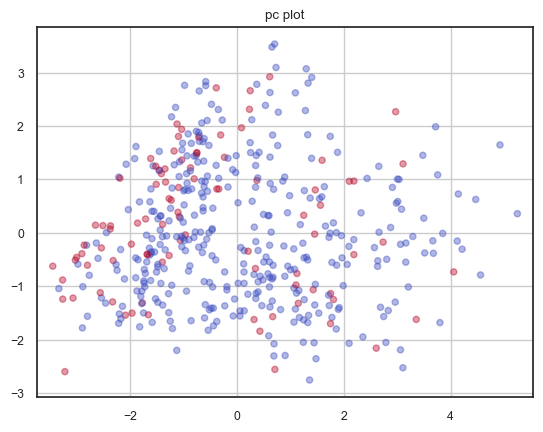

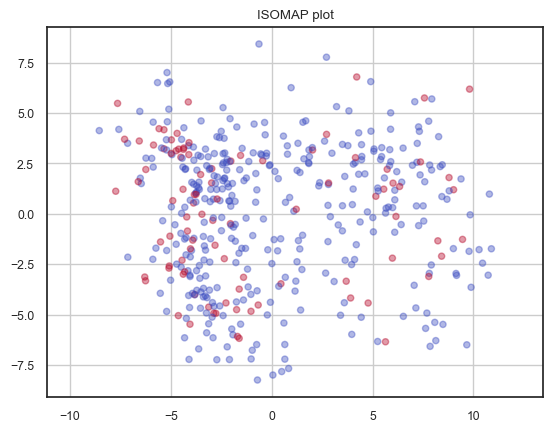

In [44]:
# The selected variables from LASSO yield the best result
# PCA, ISOMAP plot with the selected variables from RF

X_Sales_final = X_Sales[selected_var_lasso].copy()
X_Sales_final_numerical_col = X_Sales_final.select_dtypes(include = ["float64", "int64"]).columns
X_Sales_final[X_Sales_final_numerical_col] = StandardScaler().fit(X_Sales_final[X_Sales_final_numerical_col]).\
                                                transform(X_Sales_final[X_Sales_final_numerical_col]) 

linear = LinearRegression()
linear.fit(X_Sales_final, y_Sales)
print(f'LinearRegression score : {round(linear.score(X_Sales_final, y_Sales),4)}', "\n") # non - linear


# PCA
pca = PCA(n_components =2).fit(X_Sales_final)
pc = pca.transform(X_Sales_final)
print(f'Cumulative explained variance of 2 PCs (Sales Dept.) : {round(sum(pca.explained_variance_ratio_),4)}') 

plt.figure()
plt.scatter(pc[:,0], pc[:,1], s=20, c=y_Sales, alpha = 0.4, cmap = "coolwarm")
plt.axis('equal')
plt.grid()
plt.title('pc plot')
plt.show() 

# ISOMAP
isomap = Isomap(n_components=2, n_neighbors=5)
X_reduced = isomap.fit_transform(X_Sales_final)

plt.figure()
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], s=20, c=y_Sales, alpha = 0.4, cmap = "coolwarm")
plt.axis('equal')
plt.grid()
plt.title('ISOMAP plot')
plt.show() 

In [46]:
X_Sales_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 446 entries, 0 to 1468
Data columns (total 22 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Age                               446 non-null    float64
 1   DistanceFromHome                  446 non-null    float64
 2   Education                         446 non-null    float64
 3   EnvironmentSatisfaction           446 non-null    float64
 4   JobInvolvement                    446 non-null    float64
 5   JobSatisfaction                   446 non-null    float64
 6   NumCompaniesWorked                446 non-null    float64
 7   PerformanceRating                 446 non-null    float64
 8   RelationshipSatisfaction          446 non-null    float64
 9   StockOptionLevel                  446 non-null    float64
 10  TotalWorkingYears                 446 non-null    float64
 11  WorkLifeBalance                   446 non-null    float64
 12  YearsInCurre

### SMOTE

In [47]:
## Before diving into feature modeling, as our data is imbalanced, it's better to deal with resampling method.
# Here, using oversampling method SMOTE, we can mitigate the impact of imbalanced data

In [48]:
weights = list(np.linspace(0.3, 1.0, 50))

smote_pipe = Pipeline([('smote', SMOTE(random_state=42)),
                       ('scale', StandardScaler()),
                         ('logit', LogisticRegression(random_state=42, max_iter = 5000))])

stratified_kfold = StratifiedKFold(n_splits=10,
                                       shuffle=True,
                                       random_state=42)

gcv_sm = GridSearchCV(estimator = smote_pipe, param_grid = {'smote__sampling_strategy' : weights}, scoring = 'f1', 
                   cv = stratified_kfold, error_score='raise')

gcv_result_sm = gcv_sm.fit(X_Sales_final, y_Sales) 
print(f'The best resampling ratio is {gcv_result_sm.best_params_["smote__sampling_strategy"]}, yielding score of ' 
      f'{gcv_result_sm.best_score_}')

The best resampling ratio is 0.5571428571428572, yielding score of 0.6299469931513275


### SMOTENC

In [49]:
# Find categorical column indices for SMOTENC
smotenc_cate_feature = [ind for ind, tf in enumerate(X_Sales_final.dtypes == bool) if tf == True]
smotenc_cate_feature

[15, 16, 17, 18, 19, 20, 21]

In [50]:
weights = list(np.linspace(0.7, 1.0, 50))

smotenc_pipe = Pipeline([('smotenc', SMOTENC(random_state=42, categorical_features = smotenc_cate_feature)), 
                         ('scale', StandardScaler()),
                         ('logit', LogisticRegression(random_state=42, max_iter = 5000))])

gcv_smnc = GridSearchCV(estimator = smotenc_pipe, param_grid = {'smotenc__sampling_strategy' : weights}, scoring = 'f1', 
                   cv = stratified_kfold, error_score='raise')

gcv_result_smnc = gcv_smnc.fit(X_Sales_final, y_Sales) 
print(f'The best resampling ratio is {gcv_result_smnc.best_params_["smotenc__sampling_strategy"]}, yielding score of ' 
      f'{gcv_result_smnc.best_score_}')

The best resampling ratio is 0.736734693877551, yielding score of 0.5784539610324513


### 3.1.3 Modeling

### 3.1.3.1. Parameter Tuning

In [51]:
# XGB Class Weight 
X_train, X_test, y_train, y_test = train_test_split(X_Sales_final, y_Sales, train_size = 0.8, test_size=0.2, random_state=42)
ratio = float(y_train.value_counts()[0]) / y_train.value_counts()[1]
y_pred_temp = XGBClassifier(scale_pos_weight=ratio, random_state=42, learning_rate = 0.005, n_estimators = 1750, max_depth = 10).fit(X_train, y_train).predict(X_test)
ratio, f1_score(y_test, y_pred_temp)

(3.6233766233766236, 0.5517241379310344)

In [52]:
np.random.seed(42)
model_params = {
                "logit" : {'model' : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                                    sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('logit', LogisticRegression(random_state=42, tol=1.0e-2, max_iter=5000, 
                                                                         solver='lbfgs', class_weight = {0:1, 1:1}))]), # lbfgs  the best
                                            'params' : {'logit__penalty': ["l2"], 
                                                        'logit__C' : [0.025, 0.03, 0.035]}},
                "SVM" : {'model' : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('nomal', MinMaxScaler()),
                                            ('SVM', SVC(random_state=42, tol=1.0e-2, max_iter=100000))]),
                          'params' : {'SVM__kernel': ["linear", "rbf", "sigmoid", "poly"], 
                                      'SVM__gamma' : ["auto", "scale"], 
                                     'SVM__class_weight' : ["balanced", None], 
                                     'SVM__C' : [8, 9, 10, 11, 12]}},
                "LGBM" : {'model' : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('LGBM', lgb.LGBMClassifier(random_state=42))]),
                          'params' : {'LGBM__num_leaves' : [2, 3, 4],
                                      'LGBM__n_estimators':[2000, 2500, 3000, 3500],
                                      'LGBM__learning_rate': [0.005],
                                      'LGBM__verbosity':[-1]}},
                "XGB": {'model': Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('XGB', XGBClassifier(random_state=42, scale_pos_weight=ratio))]),
                        'params': { 'XGB__learning_rate': [0.005],
                                    'XGB__n_estimators': [1500, 2000, 2500] , 
                                    'XGB__max_depth':[2, 3, 4]}},
                "AdaBoost": {'model': Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('AdaBoost', AdaBoostClassifier(random_state=42))]),
                        'params': {'AdaBoost__estimator': [DecisionTreeClassifier(max_depth=i) for i in range(2,10,2)], 
                                   'AdaBoost__n_estimators':[1, 2, 3, 4],
                                   'AdaBoost__learning_rate':[0.005]}},
                "RF": {'model' : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('RF', RandomForestClassifier(random_state=42))]),
                       'params' : {'RF__n_estimators' : [4, 5, 6, 7],
                                   'RF__min_samples_split' : [2, 3, 4],
                                   'RF__max_depth' : [2, 3, 4], 
                                  'RF__class_weight' : ["balanced", None]}},
                "MLP": {'model' : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('MLP', MLPClassifier(random_state=42, max_iter =1000, tol=1e-2))]),
                       'params' : {'MLP__learning_rate_init' : [0.005],
                                   'MLP__hidden_layer_sizes' : [(20, ), (19, ), (20, 5), (19, 5)],
                                   'MLP__activation' : ['identity', 'logistic', 'tanh', 'relu'],
                                    'MLP__solver' : ['lbfgs', 'sgd', 'adam']}},
                "lda" : {'model' : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('lda', LinearDiscriminantAnalysis(tol=1.0e-2))]),
                          'params' : {'lda__solver': ["svd", "lsqr", "eigen"], 
                                      'lda__shrinkage' : ["auto", None]}}}

In [53]:
X_train, X_test, y_train, y_test = train_test_split(X_Sales_final, y_Sales, train_size = 0.8, test_size=0.2, random_state=42)

best_para = []
best_score = []
test_score = []
grid_cm = {}
best_coef = {}

np.random.seed(42)

stratified_kfold = StratifiedKFold(n_splits=10,
                                       shuffle=True, 
                                       random_state=42)

for name, model in model_params.items() :
    grid_cv = GridSearchCV(model['model'], model['params'], cv=stratified_kfold, scoring='f1')
    grid_cv.fit(X_train, y_train) 
    
    best_para.append(grid_cv.best_params_) 
    best_score.append(grid_cv.best_score_) 
    
    # test score 
    y_pred = grid_cv.predict(X_test)
    grid_test_score = f1_score(y_test, y_pred)
    test_score.append(grid_test_score)
    
    # confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    grid_cm[name] = cm

    # feature importance or coef
    if name in ["LGBM", "XGB", "AdaBoost", "RF"] :
        best_coef[name] = grid_cv.best_estimator_.named_steps[name].feature_importances_
    elif name in ["MLP"] :
        best_coef[name] = grid_cv.best_estimator_.named_steps[name].coefs_
    elif name in ["SVM"] :
        if grid_cv.best_estimator_["SVM"].kernel=="linear" : 
            best_coef[name] = grid_cv.best_estimator_.named_steps[name].coef_
        else : 
            continue
    else :
        best_coef[name] = grid_cv.best_estimator_.named_steps[name].coef_

C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 60.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\taewu\anaconda3\Lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\discriminant_analysis.py", line 615, in fit
    raise NotImplementedError("shrinkage not supported

In [54]:
# validation set score vs test set score
pd.DataFrame({"CV Validation score" : best_score, "Test score" : test_score}, model_params.keys()).sort_values(
    by="CV Validation score", ascending=False)

,CV Validation score,Test score
SVM,0.609982,0.685714
MLP,0.598275,0.666667
logit,0.586810,0.687500
lda,0.573473,0.666667
XGB,0.554846,0.512821
LGBM,0.523028,0.518519
RF,0.498367,0.432432
AdaBoost,0.452337,0.307692


In [55]:
# check the optimal parameters for each model
para_dict = {}
for idx, result in enumerate(best_para):
    model_name = list(result.keys())[0].split('__')[0]
    para_dict[model_name] = result

para_dict

{'logit': {'logit__C': 0.025, 'logit__penalty': 'l2'},
 'SVM': {'SVM__C': 11,
  'SVM__class_weight': 'balanced',
  'SVM__gamma': 'auto',
  'SVM__kernel': 'rbf'},
 'LGBM': {'LGBM__learning_rate': 0.005,
  'LGBM__n_estimators': 3000,
  'LGBM__num_leaves': 2,
  'LGBM__verbosity': -1},
 'XGB': {'XGB__learning_rate': 0.005,
  'XGB__max_depth': 4,
  'XGB__n_estimators': 1500},
 'AdaBoost': {'AdaBoost__estimator': DecisionTreeClassifier(max_depth=8),
  'AdaBoost__learning_rate': 0.005,
  'AdaBoost__n_estimators': 3},
 'RF': {'RF__class_weight': 'balanced',
  'RF__max_depth': 4,
  'RF__min_samples_split': 3,
  'RF__n_estimators': 7},
 'MLP': {'MLP__activation': 'identity',
  'MLP__hidden_layer_sizes': (20, 5),
  'MLP__learning_rate_init': 0.005,
  'MLP__solver': 'lbfgs'},
 'lda': {'lda__shrinkage': 'auto', 'lda__solver': 'lsqr'}}

In [56]:
grid_cm

{'logit': array([[69,  6],
        [ 4, 11]], dtype=int64),
 'SVM': array([[67,  8],
        [ 3, 12]], dtype=int64),
 'LGBM': array([[70,  5],
        [ 8,  7]], dtype=int64),
 'XGB': array([[61, 14],
        [ 5, 10]], dtype=int64),
 'AdaBoost': array([[57, 18],
        [ 9,  6]], dtype=int64),
 'RF': array([[61, 14],
        [ 7,  8]], dtype=int64),
 'MLP': array([[68,  7],
        [ 4, 11]], dtype=int64),
 'lda': array([[68,  7],
        [ 4, 11]], dtype=int64)}

### 3.1.3.2. Modeling with the optimal parameters

In [57]:
# Final model pipeline with the optimal parameters
np.random.seed(42)
model_pipeline = {
                "LGBM" : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('LGBM', lgb.LGBMClassifier(random_state=42, num_leaves = para_dict["LGBM"]["LGBM__num_leaves"]
                                                                    , n_estimators= para_dict["LGBM"]["LGBM__n_estimators"],
                                                                   learning_rate = para_dict["LGBM"]["LGBM__learning_rate"]
                                                                    ,verbosity = -1))]),
                "logit" : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                                    sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('logit', LogisticRegression(random_state=42, tol=1.0e-2, max_iter=5000,
                                                                         class_weight = {0:1, 1:1},
                                                                         solver='lbfgs', penalty= para_dict["logit"]["logit__penalty"], 
                                                                         C = para_dict["logit"]["logit__C"]))]),
                "XGB": Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('XGB', XGBClassifier(random_state=42, scale_pos_weight=ratio, 
                                                                  learning_rate= para_dict["XGB"]["XGB__learning_rate"]
                                                                  , n_estimators= para_dict["XGB"]["XGB__n_estimators"],
                                                                 max_depth = para_dict["XGB"]["XGB__max_depth"]))]),
                "AdaBoost": Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('AdaBoost', AdaBoostClassifier(random_state=42, estimator = para_dict["AdaBoost"]["AdaBoost__estimator"], 
                                                                            n_estimators = para_dict["AdaBoost"]["AdaBoost__n_estimators"], 
                                                                            learning_rate = para_dict["AdaBoost"]["AdaBoost__learning_rate"]))]),
                "RF": Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('RF', RandomForestClassifier(random_state=42, class_weight = para_dict["RF"]["RF__class_weight"],
                                                                          n_estimators = para_dict["RF"]["RF__n_estimators"], 
                                                                         min_samples_split =para_dict["RF"]["RF__min_samples_split"] , 
                                                                          max_depth = para_dict["RF"]["RF__max_depth"]))]),
                "MLP": Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('MLP', MLPClassifier(random_state=42, max_iter =1000, tol=1e-2, 
                                                                  activation=para_dict["MLP"]["MLP__activation"],
                                                                  solver = para_dict["MLP"]["MLP__solver"],
                                                                 learning_rate_init= para_dict["MLP"]["MLP__learning_rate_init"], 
                                                                  hidden_layer_sizes= para_dict["MLP"]["MLP__hidden_layer_sizes"]))]),
                "lda" : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('lda', LinearDiscriminantAnalysis(tol=1.0e-2, solver = para_dict["lda"]["lda__solver"], 
                                                                              shrinkage = para_dict["lda"]["lda__shrinkage"]))]),
                 "SVM" : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                           ('nomal', MinMaxScaler()),
                                            ('SVM', SVC(random_state=42, tol=1.0e-2, max_iter=100000, kernel= para_dict["SVM"]["SVM__kernel"], 
                                                       gamma= para_dict["SVM"]["SVM__gamma"], C = para_dict["SVM"]["SVM__C"], 
                                                       class_weight = para_dict["SVM"]["SVM__class_weight"]))])}

In [58]:
recall, f1, precision, accuracy, roc_auc = {}, {}, {}, {}, {}
recall_mean, f1_mean, precision_mean, accuracy_mean, roc_auc_mean = {}, {}, {}, {}, {}

final_cm = {}


# stratified_kfold1 = StratifiedKFold(n_splits=50,
#                                        shuffle=True,
#                                        random_state=42)

s_split = ShuffleSplit(n_splits=50, test_size=0.2, random_state=42) # Monte Carlo gives better result than KFold

for name, pipe in model_pipeline.items() :
    recall[name] = cross_val_score(estimator=pipe, X=X_Sales_final, y=y_Sales, cv=s_split, scoring='recall')
    f1[name] = cross_val_score(estimator=pipe, X=X_Sales_final, y=y_Sales, cv=s_split, scoring = 'f1')
    precision[name] = cross_val_score(estimator=pipe, X=X_Sales_final, y=y_Sales, cv=s_split, scoring = 'precision')
    roc_auc[name] = cross_val_score(estimator=pipe, X=X_Sales_final, y=y_Sales, cv=s_split, scoring = 'roc_auc')
    accuracy[name] = cross_val_score(estimator=pipe, X=X_Sales_final, y=y_Sales, cv=s_split, scoring = 'accuracy')
    y_pred = cross_val_predict(estimator=pipe, X=X_Sales_final, y=y_Sales, cv=stratified_kfold) # cross_val_predict only accepts Kfold

    recall_mean[name] = np.mean(recall[name])
    f1_mean[name] = np.mean(f1[name])
    precision_mean[name] = np.mean(precision[name])
    roc_auc_mean[name] = np.mean(roc_auc[name])
    accuracy_mean[name] = np.mean(accuracy[name])
        
    cm = confusion_matrix(y_Sales, y_pred)
    final_cm[name] = cm


### 3.1.3.3. Performance Comparison

In [59]:
# validation set score vs test set score
f1_df = pd.DataFrame(list(f1_mean.items()), columns=['Model', 'F1_Score']).sort_values(by="F1_Score", ascending=False).reset_index(drop=True)
recall_df = pd.DataFrame(list(recall_mean.items()), columns=['Model', 'Recall_Score']).sort_values(by="Recall_Score", ascending=False).reset_index(drop=True)
precision_df = pd.DataFrame(list(precision_mean.items()), columns=['Model', 'Precision_Score']).sort_values(by="Precision_Score", ascending=False).reset_index(drop=True)
accuracy_df = pd.DataFrame(list(accuracy_mean.items()), columns=['Model', 'Accuracy_Score']).sort_values(by="Accuracy_Score", ascending=False).reset_index(drop=True)
roc_auc_df = pd.DataFrame(list(roc_auc_mean.items()), columns=['Model', 'ROC_AUC_Score']).sort_values(by="ROC_AUC_Score", ascending=False).reset_index(drop=True)

tempdf1 = pd.merge(f1_df, recall_df, on=["Model"], how="inner")
tempdf2 = pd.merge(tempdf1, precision_df, on=["Model"], how="inner")
tempdf3 = pd.merge(tempdf2, accuracy_df, on=["Model"], how="inner")
result_df = pd.merge(tempdf3, roc_auc_df, on=["Model"], how="inner")

result_df

,Model,F1_Score,Recall_Score,Precision_Score,Accuracy_Score,ROC_AUC_Score
0,SVM,0.600129,0.638013,0.575687,0.829778,0.803876
1,MLP,0.595298,0.607769,0.594270,0.835111,0.800808
2,lda,0.592091,0.597562,0.598205,0.835111,0.799677
3,logit,0.570469,0.520945,0.644433,0.842667,0.799474
4,LGBM,0.552367,0.501925,0.634911,0.837333,0.770440
5,XGB,0.517537,0.538876,0.510479,0.796667,0.746161
6,RF,0.454724,0.471510,0.454746,0.772889,0.725240
7,AdaBoost,0.395733,0.407339,0.395174,0.750000,0.626917


In [60]:
# based model (without feature engeenering / selection, etc) check
data_temp = pd.read_csv("dataset/WA_Fn-UseC_-HR-Employee-Attrition.csv")
data_temp = data_temp.loc[data["Department"]=="Sales",].drop(columns = ["Department"])
data_temp = data_temp.drop(columns = ["EmployeeCount", "EmployeeNumber", "DailyRate", "HourlyRate", "MonthlyRate",  
                            "MaritalStatus", "Over18", "StandardHours"])
X_temp = pd.get_dummies(data_temp.drop(columns=["Attrition"]))
y_temp = data_temp["Attrition"].apply(lambda x : 1 if x == "Yes" else 0)

print(f'The # of variables used (including dummies) : {len(X_temp.columns)}')

np.random.seed(42)

s_split = ShuffleSplit(n_splits=50, test_size=0.2, random_state=42)

based_f1 = {}
based_model_check = {"SVM" : Pipeline(steps = [('scaler', StandardScaler()),
                                            ('SVM', SVC(random_state=42, tol=1.0e-2, max_iter=100000))]), 
                    "logit" : Pipeline(steps = [('scaler', StandardScaler()),
                                            ('logit', LogisticRegression(random_state=42, tol=1.0e-2, max_iter=5000))]),
                      "lda" : Pipeline(steps = [('scaler', StandardScaler()),
                                            ('lda', LinearDiscriminantAnalysis(tol=1.0e-2))]),
                    "MLP": Pipeline(steps = [('scaler', StandardScaler()),
                                            ('MLP', MLPClassifier(random_state=42, max_iter =1000, tol=1e-2))])}
for name, pipe in based_model_check.items() :
    based_f1[name] = np.mean(cross_val_score(estimator=pipe, X=X_temp, y=y_temp, cv=s_split, scoring='f1'))

print(f'The F1 score of base models, using all variables without feature engineering :')
based_f1

The # of variables used (including dummies) : 35
The F1 score of base models, using all variables without feature engineering :


{'SVM': 0.30902004929996074,
 'logit': 0.5728245717118199,
 'lda': 0.5549712177643129,
 'MLP': 0.32401209869278114}

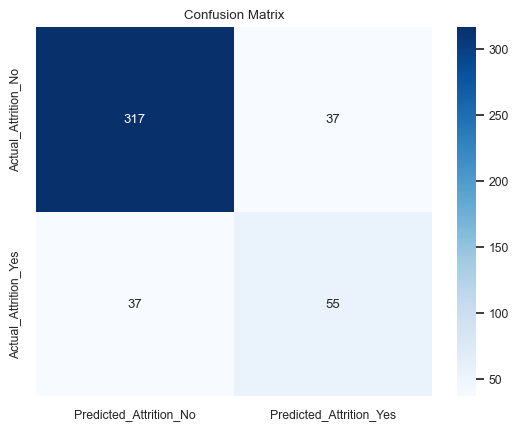

In [61]:
# Confusion Matrix of the best model
svm_cm = final_cm["SVM"]

# heatmap
sns.heatmap(svm_cm, annot=True, fmt='d', cmap='Blues', cbar=True, 
            xticklabels=['Predicted_Attrition_No', 'Predicted_Attrition_Yes'], 
            yticklabels=['Actual_Attrition_No', 'Actual_Attrition_Yes'])
plt.title('Confusion Matrix')
plt.show()

In [62]:
# Confusion matrix of all models
final_cm

{'LGBM': array([[332,  22],
        [ 46,  46]], dtype=int64),
 'logit': array([[332,  22],
        [ 41,  51]], dtype=int64),
 'XGB': array([[306,  48],
        [ 47,  45]], dtype=int64),
 'AdaBoost': array([[312,  42],
        [ 51,  41]], dtype=int64),
 'RF': array([[298,  56],
        [ 45,  47]], dtype=int64),
 'MLP': array([[319,  35],
        [ 35,  57]], dtype=int64),
 'lda': array([[323,  31],
        [ 38,  54]], dtype=int64),
 'SVM': array([[317,  37],
        [ 37,  55]], dtype=int64)}

### 3.1.3.4. Feature Importance 

In [63]:
# Our best model that can give the feature importance or coefficients is the lda model

In [64]:
lda_coef = best_coef["lda"]
lda_coef_df = pd.DataFrame(index=list(X_Sales_final.columns), data=list(lda_coef[0])).sort_values(ascending = False, by =0).reset_index()
lda_coef_df.columns = ["Variable", "Coef_lda"]

logit_coef = best_coef["logit"]
logit_coef_df = pd.DataFrame(index=list(X_Sales_final.columns), data=list(logit_coef[0])).sort_values(ascending = False, by =0).reset_index()
logit_coef_df.columns = ["Variable", "Coef_logit"]

pd.merge(lda_coef_df, logit_coef_df, on="Variable")

,Variable,Coef_lda,Coef_logit
0,OverTime_Yes,1.204696,0.519049
1,JobRole_Sales Representative,0.694880,0.333864
2,BusinessTravel_Travel_Frequently,0.580845,0.314680
3,YearsSinceLastPromotion,0.497367,0.263264
4,NumCompaniesWorked,0.437641,0.208196
5,EducationField_Marketing,0.365795,0.200508
6,DistanceFromHome,0.353531,0.187929
7,OverTime_No,0.250483,0.001482
8,Gender_Female,0.120793,0.070921
9,PerformanceRating,0.036255,0.018259


<Figure size 1000x600 with 0 Axes>

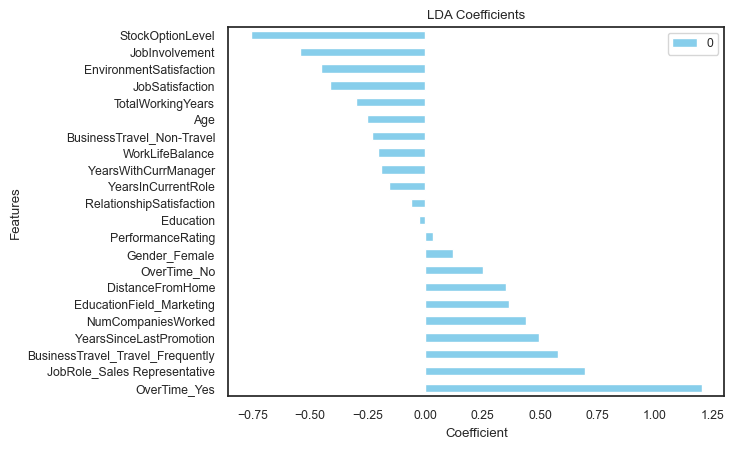

In [65]:
lda_coef_df_viz = pd.DataFrame(index=list(X_Sales_final.columns), data=list(lda_coef[0])).sort_values(ascending = False, by =0)

plt.figure(figsize=(10, 6))
lda_coef_df_viz.plot(kind="barh", color="skyblue")
plt.xlabel("Coefficient")
plt.ylabel("Features")
plt.title("LDA Coefficients")
plt.show()

In [66]:
# Top 5 important variables from lda
lda_abs = lda_coef_df["Coef_lda"].abs() # absolute coef
lda_abs_df = pd.DataFrame(data=[lda_coef_df["Variable"], lda_abs]).T.sort_values(by="Coef_lda", ascending=False)
lda_abs_df["Coef_lda"]=lda_abs_df["Coef_lda"].astype("float")
top5_coef_lda = lda_abs_df.nlargest(5, "Coef_lda").reset_index(drop=True)

print(f'Top 5 variables that might have affected to Attrition in Sales Dept. are {list(top5_coef_lda["Variable"])} in order.')
top5_coef_lda

Top 5 variables that might have affected to Attrition in Sales Dept. are ['OverTime_Yes', 'StockOptionLevel', 'JobRole_Sales Representative', 'BusinessTravel_Travel_Frequently', 'JobInvolvement'] in order.


,Variable,Coef_lda
0,OverTime_Yes,1.204696
1,StockOptionLevel,0.757403
2,JobRole_Sales Representative,0.694880
3,BusinessTravel_Travel_Frequently,0.580845
4,JobInvolvement,0.542451


In [67]:
# Top 5 important variables from logit
logit_abs = logit_coef_df["Coef_logit"].abs() # absolute coef
logit_abs_df = pd.DataFrame(data=[logit_coef_df["Variable"], logit_abs]).T.sort_values(by="Coef_logit", ascending=False)
logit_abs_df["Coef_logit"]=logit_abs_df["Coef_logit"].astype("float")
top5_coef_logit = logit_abs_df.nlargest(5, "Coef_logit").reset_index(drop=True)

print(f'Top 5 variables that might have affected to Attrition in Sales Dept. are {list(top5_coef_logit["Variable"])} in order.')
top5_coef_logit

Top 5 variables that might have affected to Attrition in Sales Dept. are ['OverTime_Yes', 'StockOptionLevel', 'JobRole_Sales Representative', 'BusinessTravel_Travel_Frequently', 'JobInvolvement'] in order.


,Variable,Coef_logit
0,OverTime_Yes,0.519049
1,StockOptionLevel,0.415502
2,JobRole_Sales Representative,0.333864
3,BusinessTravel_Travel_Frequently,0.314680
4,JobInvolvement,0.305702


### 3.1.3.5. Best Model vs Others Comparison

In [68]:
print(f'T-Test result w/ {"SVM"} : {ttest_ind(f1["lda"], f1["SVM"])}')
print(f'T-Test result w/ {"XGB"} : {ttest_ind(f1["lda"], f1["XGB"])}')
print(f'T-Test result w/ {"RF"} : {ttest_ind(f1["lda"], f1["RF"])}')
print(f'T-Test result w/ {"MLP"} : {ttest_ind(f1["lda"], f1["MLP"])}')
print(f'T-Test result w/ {"LGBM"} : {ttest_ind(f1["lda"], f1["LGBM"])}')
print(f'T-Test result w/ {"logit"} : {ttest_ind(f1["lda"], f1["logit"])}')
print(f'T-Test result w/ {"AdaBoost"} : {ttest_ind(f1["lda"], f1["AdaBoost"])}',"\n")

print(f'W-Test result w/ {"SVM"} : {wilcoxon(f1["lda"], f1["SVM"])}')
print(f'W-Test result w/ {"XGB"} : {wilcoxon(f1["lda"], f1["XGB"])}')
print(f'W-Test result w/ {"RF"} : {wilcoxon(f1["lda"], f1["RF"])}')
print(f'W-Test result w/ {"MLP"} : {wilcoxon(f1["lda"], f1["MLP"])}')
print(f'W-Test result w/ {"LGBM"} : {wilcoxon(f1["lda"], f1["LGBM"])}')
print(f'W-Test result w/ {"logit"} : {wilcoxon(f1["lda"], f1["logit"])}')
print(f'W-Test result w/ {"AdaBoost"} : {wilcoxon(f1["lda"], f1["AdaBoost"])}')


T-Test result w/ SVM : TtestResult(statistic=-0.48945805790170155, pvalue=0.6256112293283227, df=98.0)
T-Test result w/ XGB : TtestResult(statistic=4.321350150901391, pvalue=3.723970669748761e-05, df=98.0)
T-Test result w/ RF : TtestResult(statistic=7.640309566222936, pvalue=1.4728122820643626e-11, df=98.0)
T-Test result w/ MLP : TtestResult(statistic=-0.18408542314060505, pvalue=0.8543268179535835, df=98.0)
T-Test result w/ LGBM : TtestResult(statistic=2.2122911562591034, pvalue=0.029268733584463455, df=98.0)
T-Test result w/ logit : TtestResult(statistic=1.2309130557274877, pvalue=0.22130144488700948, df=98.0)
T-Test result w/ AdaBoost : TtestResult(statistic=10.08535526592765, pvalue=7.900626896337176e-17, df=98.0) 

W-Test result w/ SVM : WilcoxonResult(statistic=498.5, pvalue=0.35863307497681396)
W-Test result w/ XGB : WilcoxonResult(statistic=141.0, pvalue=2.1499046276574063e-07)
W-Test result w/ RF : WilcoxonResult(statistic=16.0, pvalue=2.964333500367118e-09)
W-Test result w/ M

C:\Users\taewu\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


## 3.2. R&D Department Analysis

### 3.2.1. Exploratory Data Analysis (R&D)

### 3.2.1.1. Distribution

# of Attrition in R&D Department : 133
# of Non-Attrition in R&D Department : 828


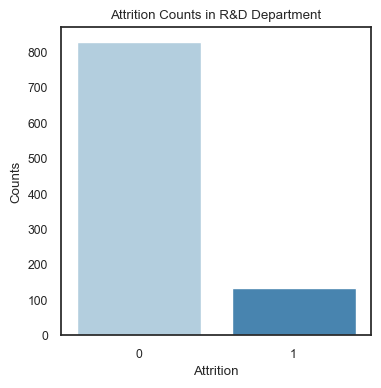

In [69]:
# Department set up 
data_RnD = data.loc[data["Department"]=="Research & Development",]
X_RnD = data_RnD.drop(columns = ["Attrition", "Department"])
y_RnD = data_RnD["Attrition"]

data_RnD = data_RnD.drop(columns=["Department"])

# Attrition count plot
RnD_attriton = y_RnD.value_counts()
print(f'# of Attrition in R&D Department : {RnD_attriton[1]}')
print(f'# of Non-Attrition in R&D Department : {RnD_attriton[0]}')
plt.figure(figsize=(4, 4))
sns.countplot(data=data_RnD, x="Attrition", palette="Blues")
plt.title("Attrition Counts in R&D Department")
plt.xlabel("Attrition")
plt.ylabel("Counts")
plt.xticks(rotation=0)
plt.show()

# The data is imbalanced.

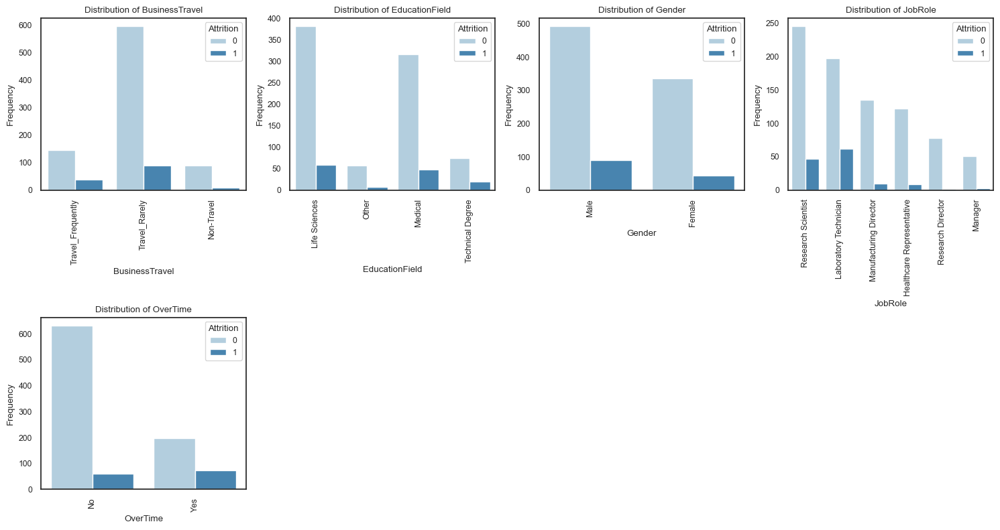

In [70]:
# Categorical variables count plot

# set up the categorical columns
cate_cols = X_RnD.select_dtypes(include=['object']).columns

# counter plot for categorical variables
sns.set(font_scale=0.8)
sns.set_style("white")

# calculate the number of rows/columns needed for subplots
n_rows = int(np.ceil(len(cate_cols) / 4)) 

plt.figure(figsize=(15, n_rows * 4))  # Dynamic figure size

for i, col in enumerate(cate_cols, 1): 
    plt.subplot(n_rows, 4, i)  
    sns.countplot(x=cate_cols[i-1], data=X_RnD, palette='Blues', hue=y_RnD)
    plt.title(f"Distribution of {col}")
    plt.xlabel(f"{col}")
    plt.ylabel('Frequency')
    plt.tick_params(axis='x', rotation=90)

plt.tight_layout() 
plt.show()

In [71]:
# Interestingly, as opposed to Sales dept, when it comes to BusinessTravel, Travel_Frequenly does not affect to Attrition 
# as much as in Sales dept.

# Laboratory Tech seems to be more likely to leave the work

# OverTime seems to be also important factor in R&D as well

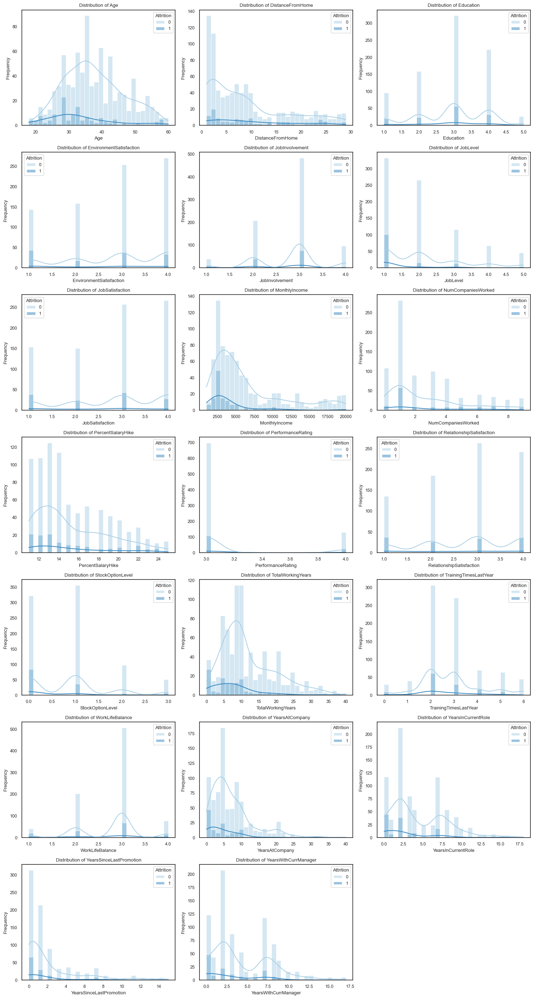

In [72]:
# Numerical variables distribution

# set up the numerical columns
numeric_cols = X_RnD.select_dtypes(include=['int64', 'float64']).columns

# calculate the number of rows/columns needed for subplots
n_rows = int(np.ceil(len(numeric_cols) / 3))  

plt.figure(figsize=(15, n_rows * 4)) 

for i, col in enumerate(numeric_cols, 1): 
    plt.subplot(n_rows, 3, i)  
    sns.histplot(data=X_RnD, x=col, bins=30, palette='Blues', hue=y_RnD, kde=True) 
    plt.title(f"Distribution of {col}")
    plt.xlabel(f"{col}")
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [73]:
# Young generation seem to be more likely to leave the work (also groups closed to retirement)
# lower Job level (associated with lower monthly income) also might be a contributing factor 
# As like Sales Dept, Stock option could be also a trigger
# As like Sales Dept,People without any work experience tend to leave the work easier
# As like Sales Dept, almost half of total working year 0 left the company (Need to be cared more)
# All year related variables has similar patterns

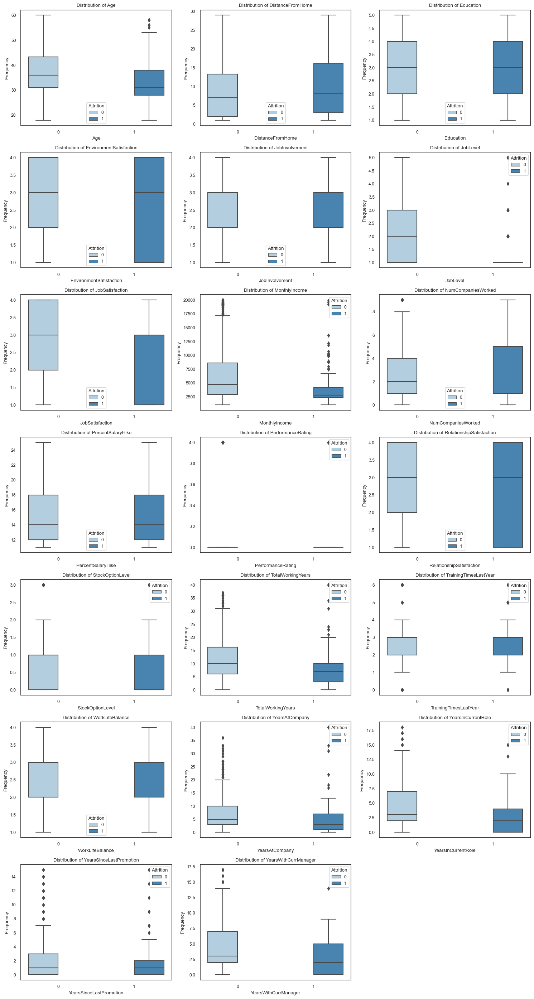

In [74]:
# Numerical variables distribution

# set up the numerical columns
numeric_cols = X_RnD.select_dtypes(include=['int64', 'float64']).columns

# calculate the number of rows/columns needed for subplots
n_rows = int(np.ceil(len(numeric_cols) / 3))  

plt.figure(figsize=(15, n_rows * 4)) 

for i, col in enumerate(numeric_cols, 1): 
    plt.subplot(n_rows, 3, i)  
    sns.boxplot(x = "Attrition", y = col, data=data_RnD, palette='Blues', hue=y_RnD)
    plt.title(f"Distribution of {col}")
    plt.xlabel(f"{col}")
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [75]:
# box plot results are similar to what we have analyzed from distribution

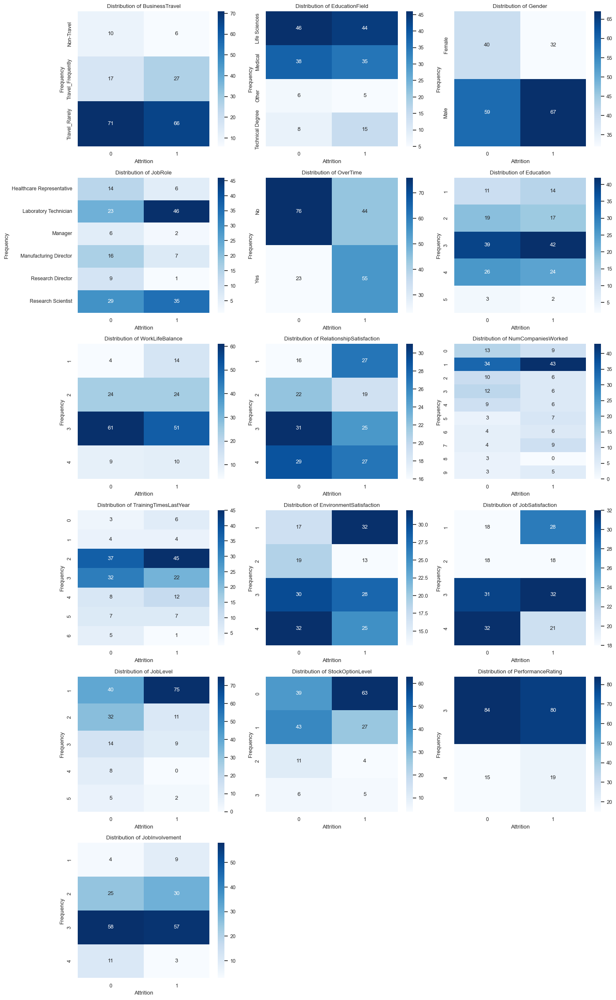

In [76]:
# Heatmap check for categorical col + numerical col(categorical order)

# set up the numerical columns that contain increasing order categories and combine them with categorical columns
numeric_cate_cols = list(set(numeric_cols) - set(["Age", "DistanceFromHome", "MonthlyIncome", "PercentSalaryHike", "TotalWorkingYears",
                                         "YearsAtCompany", "YearsInCurrentRole", "YearsSinceLastPromotion", 
                                          "YearsWithCurrManager"]))
cate_numerical_cate_col = list(cate_cols) + numeric_cate_cols

# calculate the number of rows/columns needed for subplots
n_rows = int(np.ceil(len(cate_numerical_cate_col) / 3))  

plt.figure(figsize=(15, n_rows * 4)) 

for i, col in enumerate(cate_numerical_cate_col, 1): 
    # percentage of each category in each variable
    grouped_data = data_RnD.groupby([col, 'Attrition']).size().unstack()
    row_sums = grouped_data.sum(axis=0)
    grouped_data_percentage = (grouped_data.div(row_sums, axis=1) * 100).astype(int)
    
    plt.subplot(n_rows, 3, i)  
    sns.heatmap(grouped_data_percentage, cmap="Blues", annot=True, fmt="d")
    plt.title(f"Distribution of {col}")
    plt.xlabel("Attrition")
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# So far, some of the variables seem to have impact on the target variable (BusinessTravel, OverTime, etc), while some of them
# do not seem to influence much on the target variable (Gender, EducationField, WorkLifeBalance, PerformanceRating, etc.)

In [77]:
# Business Travel affect somewhat but not as much as in Sales
# Tech degree seems to be more likely to leave the work
# Laboratory Tech has higher attrition proportion
# Overtime is a contributing factor
# WorklifeBalance a bit affects to it
# JobSatisfaction seems to be a trigger too
# Numcompanywork affects a bit 
# Stock is highly influencing factor
# Relationship also contributes
# low Joblevel higher attrition
# Enviroment also triggers

In [78]:
# Variable range adjustment(similar to Sales dept)
# certain categories within the variables occupy significantly smaller proportions compared to others.
# it might be beneficial to combine these less represented categories within each variable to avoid the overfitting issue.

data_RnD = data_RnD.copy() 
data_RnD["Education"] = data_RnD["Education"].apply(lambda x : 4 if x ==5 else x)
data_RnD["JobLevel"] = data_RnD["JobLevel"].apply(lambda x : 4 if x ==5 else x)
data_RnD["NumCompaniesWorked"] = data_RnD["NumCompaniesWorked"].apply(lambda x : 5 if x >= 5 else x)
data_RnD["StockOptionLevel"] = data_RnD["StockOptionLevel"].apply(lambda x : 2 if x >=2 else x)

### 3.2.1.2. Outlier Check

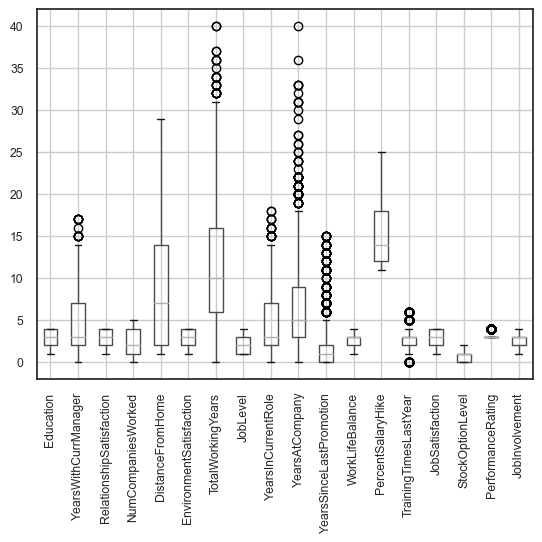

<Figure size 640x480 with 0 Axes>

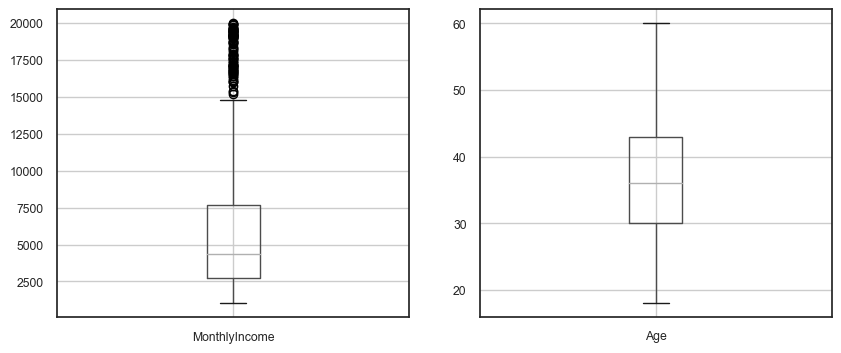

In [79]:
# outlier check for numerical variables

data_RnD.boxplot(column=list(set(numeric_cols) - {"MonthlyIncome", "Age"}), rot = 90) 
plt.figure()
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
pd.DataFrame(data_RnD["MonthlyIncome"]).boxplot(column="MonthlyIncome", ax=ax[0])
pd.DataFrame(data_RnD["Age"]).boxplot(column="Age", ax=ax[1])
plt.show()

In [80]:
# Potential outliers transformed to the max value in each variable
outlier_group_list = ["TotalWorkingYears", "YearsInCurrentRole", "YearsAtCompany", "MonthlyIncome", 
                      "YearsSinceLastPromotion", "YearsWithCurrManager", "TrainingTimesLastYear"]

# Here, PerformanceRating only contains 2 categories. Therefore, outliers in PerformanceRating are not removed.

for i in outlier_group_list :
    q1 = np.percentile(data_RnD[i],25)
    q3 = np.percentile(data_RnD[i],75)
    iqr = q3-q1
    upper_bound = q3 + 1.5 * iqr
    lower_bound = q1 - 1.5 * iqr
    data_RnD.loc[data_RnD[i] > upper_bound, i] = upper_bound
    data_RnD.loc[data_RnD[i] < lower_bound, i] = lower_bound

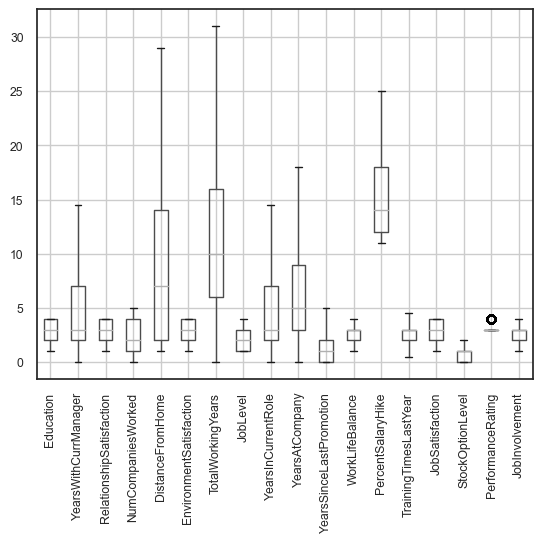

<Figure size 640x480 with 0 Axes>

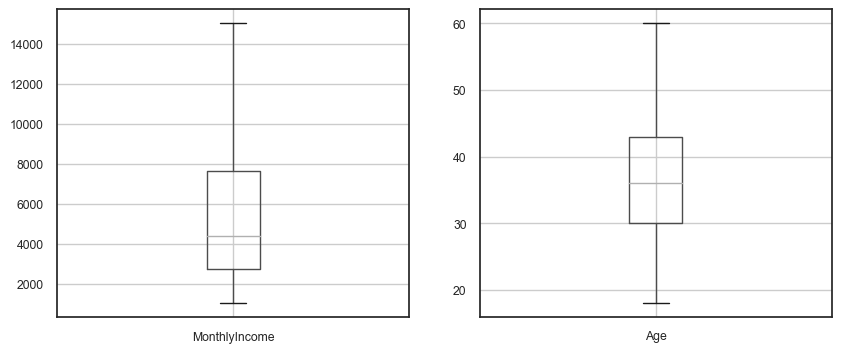

In [81]:
# Boxplot check again
data_RnD.boxplot(column=list(set(numeric_cols) - {"MonthlyIncome", "Age"}), rot = 90) 
plt.figure()
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
pd.DataFrame(data_RnD["MonthlyIncome"]).boxplot(column="MonthlyIncome", ax=ax[0])
pd.DataFrame(data_RnD["Age"]).boxplot(column="Age", ax=ax[1])
plt.show()

### 3.2.1.3. Correlation

In [82]:
data_RnD.info()

<class 'pandas.core.frame.DataFrame'>
Index: 961 entries, 1 to 1469
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       961 non-null    int64  
 1   Attrition                 961 non-null    int64  
 2   BusinessTravel            961 non-null    object 
 3   DistanceFromHome          961 non-null    int64  
 4   Education                 961 non-null    int64  
 5   EducationField            961 non-null    object 
 6   EnvironmentSatisfaction   961 non-null    int64  
 7   Gender                    961 non-null    object 
 8   JobInvolvement            961 non-null    int64  
 9   JobLevel                  961 non-null    int64  
 10  JobRole                   961 non-null    object 
 11  JobSatisfaction           961 non-null    int64  
 12  MonthlyIncome             961 non-null    int64  
 13  NumCompaniesWorked        961 non-null    int64  
 14  OverTime      

<Axes: >

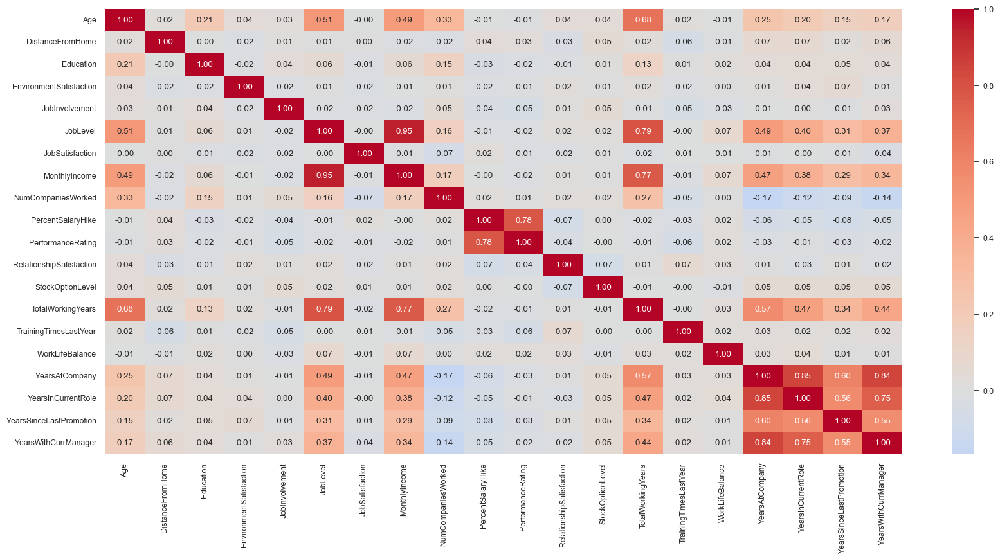

In [83]:
# re-define data after outlier adjustment, and create dummy variables for categorical variables
X_RnD = data_RnD.drop(columns = ["Attrition"])
data_RnD = pd.concat([pd.DataFrame(y_RnD), pd.get_dummies(X_RnD)], axis=1) # dummy creation
X_RnD = data_RnD.drop(columns = ["Attrition"])

# correlation among numerical variables
corr_df = X_RnD[numeric_cols].corr() 
corr_df_x = corr_df.sort_index().sort_index(axis=1) 
plt.figure(figsize=(20,9))
sns.heatmap(corr_df_x, annot=True, fmt=".2f", cmap="coolwarm", center=0) 

# Joblevel, MonthlyIncome seems to be correlated 

<Axes: >

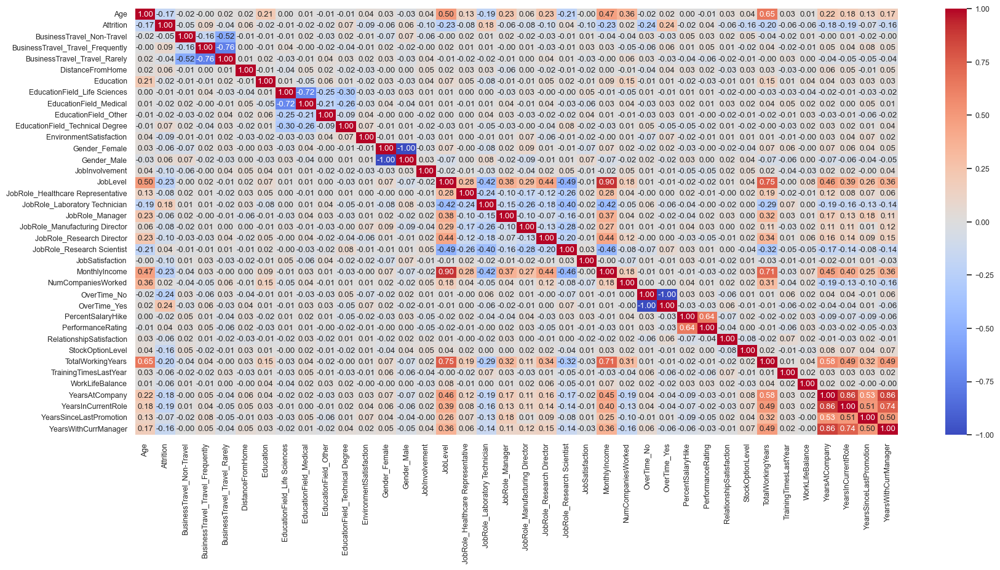

In [84]:
# correlations among all variables, using spearman
corr_df1 = data_RnD.corr(method="spearman")
corr_df_x1 = corr_df1.sort_index().sort_index(axis=1) 
plt.figure(figsize=(20,9))
sns.heatmap(corr_df_x1, annot=True, fmt=".2f", cmap="coolwarm", center=0) 

# No significant correlation exists, even with the target variable

In [85]:
# R result
# table is VIF result in R. As we had a categorical variable, GVIF^(1/(2*Df)) can be considered this time,
# and 3.16 is equivalent to VIF 10 approximately. Therefore, we can assume that there is potential multicollinearity issue 
# when using all predictor variables.(MonthlyIncome with JobLevel)

# > vif(model)
#                               GVIF Df GVIF^(1/(2*Df))
# Age                       2.069437  1        1.438554
# BusinessTravel            1.059690  2        1.014600
# DistanceFromHome          1.032410  1        1.016076
# Education                 1.081094  1        1.039757
# EducationField            1.090063  3        1.014476
# EnvironmentSatisfaction   1.035732  1        1.017709
# Gender                    1.041036  1        1.020312
# JobInvolvement            1.037176  1        1.018418
# JobLevel                 13.500953  1        3.674364
# JobRole                   9.210192  5        1.248610
# JobSatisfaction           1.027223  1        1.013520
# MonthlyIncome            17.075605  1        4.132264
# NumCompaniesWorked        1.375775  1        1.172934
# OverTime                  1.043584  1        1.021559
# PercentSalaryHike         2.712502  1        1.646968
# PerformanceRating         2.678530  1        1.636621
# RelationshipSatisfaction  1.034646  1        1.017175
# StockOptionLevel          1.033848  1        1.016783
# TotalWorkingYears         5.035968  1        2.244096
# TrainingTimesLastYear     1.049251  1        1.024330
# WorkLifeBalance           1.020778  1        1.010336
# YearsAtCompany            7.038652  1        2.653046
# YearsInCurrentRole        3.742468  1        1.934546
# YearsSinceLastPromotion   1.669220  1        1.291983
# YearsWithCurrManager      3.723954  1        1.929755

### 3.2.1.4. PCA, ISOMAP Plot for R&D Department

LinearRegression score : 0.2307 

Cumulative explained variance of 2 PCs (R&D Dept.) : 0.2954


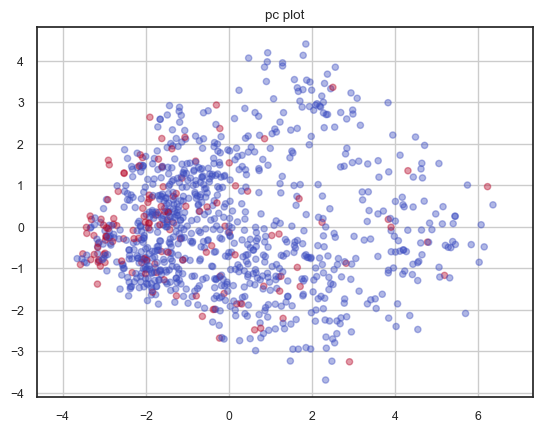

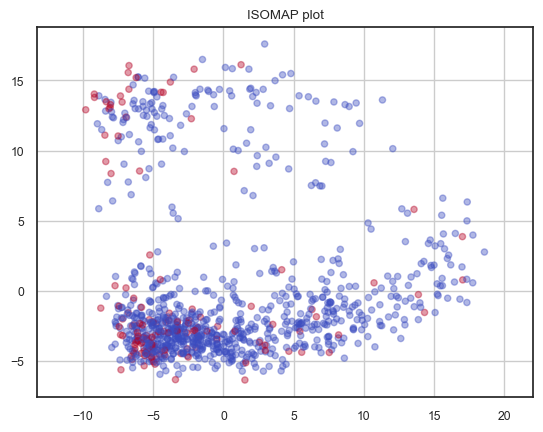

In [86]:
# Check the linearity
X_train, X_test, y_train, y_test = train_test_split(X_RnD, y_RnD, train_size = 0.8, test_size=0.2, random_state=42)

X_train[numeric_cols] = StandardScaler().fit(X_train[numeric_cols]).transform(X_train[numeric_cols]) 
X_test[numeric_cols] = StandardScaler().fit(X_test[numeric_cols]).transform(X_test[numeric_cols])

linear = LinearRegression()
linear.fit(X_train, y_train)
print(f'LinearRegression score : {round(linear.score(X_train, y_train),4)}', "\n") # non - linear


# PCA
X_RnD_pca = X_RnD.copy()
X_RnD_pca[numeric_cols] = StandardScaler().fit(X_RnD_pca[numeric_cols]).transform(X_RnD_pca[numeric_cols]) 

pca = PCA(n_components =2).fit(X_RnD_pca)
pc = pca.transform(X_RnD_pca)
print(f'Cumulative explained variance of 2 PCs (R&D Dept.) : {round(sum(pca.explained_variance_ratio_),4)}') 

plt.figure()
plt.scatter(pc[:,0], pc[:,1], s=20, c=y_RnD, alpha = 0.4, cmap = "coolwarm")
plt.axis('equal')
plt.grid()
plt.title('pc plot')
plt.show() 

# ISOMAP
isomap = Isomap(n_components=2, n_neighbors=5)
X_reduced = isomap.fit_transform(X_RnD_pca)

plt.figure()
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], s=20, c=y_RnD, alpha = 0.4, cmap = "coolwarm")
plt.axis('equal')
plt.grid()
plt.title('ISOMAP plot')
plt.show() 

In [87]:
print(f'The # of variables including dummy variables is : {len(X_RnD.columns)}')

numerical_cols = X_RnD.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X_RnD.select_dtypes(include=['bool']).columns
list(X_RnD.columns)

The # of variables including dummy variables is : 37


['Age',
 'DistanceFromHome',
 'Education',
 'EnvironmentSatisfaction',
 'JobInvolvement',
 'JobLevel',
 'JobSatisfaction',
 'MonthlyIncome',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager',
 'BusinessTravel_Non-Travel',
 'BusinessTravel_Travel_Frequently',
 'BusinessTravel_Travel_Rarely',
 'EducationField_Life Sciences',
 'EducationField_Medical',
 'EducationField_Other',
 'EducationField_Technical Degree',
 'Gender_Female',
 'Gender_Male',
 'JobRole_Healthcare Representative',
 'JobRole_Laboratory Technician',
 'JobRole_Manager',
 'JobRole_Manufacturing Director',
 'JobRole_Research Director',
 'JobRole_Research Scientist',
 'OverTime_No',
 'OverTime_Yes']

### 3.2.2. Feature Selection

In [88]:
# modeling function
def modeling(model, X_train, X_test, y_train, y_test):
    model.fit(X_train,y_train)
    ypred = model.predict(X_test)
    return metrics(y_test, ypred)
    
# performance metrics function
def metrics(y_test, ypred):
    accuracy = accuracy_score(y_test,ypred)
    precision = precision_score(y_test,ypred)
    recall = recall_score(y_test,ypred)
    f1 = f1_score(y_test,ypred)
    roc_score = roc_auc_score(y_test,ypred,average='macro')
    result = {'accuracy': accuracy, 'precision': precision, 'recall': recall, 'f1': f1, 'roc_auc' : roc_score}
    return result

# define startified Kfold for CV later
stratified_kfold = StratifiedKFold(n_splits=10,
                                       shuffle=True, 
                                       random_state=42)

### 3.2.2.1. LASSO

Best model searched for Lasso:
alpha = 0.00266102550574491
intercept = 0.24463251572942696
betas = [-2.70247890e-02  1.67828831e-02  0.00000000e+00 -3.73127907e-02
 -3.12092841e-02 -2.56799049e-02 -3.04199899e-02 -0.00000000e+00
  2.40437915e-02 -4.58393356e-03  1.07090104e-02 -2.76411875e-02
 -4.80408014e-02 -8.16944363e-03 -9.51988541e-03 -2.19327215e-02
 -0.00000000e+00 -2.70395294e-02  2.01083968e-02 -4.03519738e-03
 -1.56556647e-02  4.95733820e-02  0.00000000e+00  0.00000000e+00
 -0.00000000e+00 -0.00000000e+00  7.58037481e-02 -3.28146448e-02
  0.00000000e+00 -2.40581540e-03  8.48925928e-02  0.00000000e+00
 -0.00000000e+00 -0.00000000e+00  0.00000000e+00 -1.82545544e-01
  9.79112329e-16], 


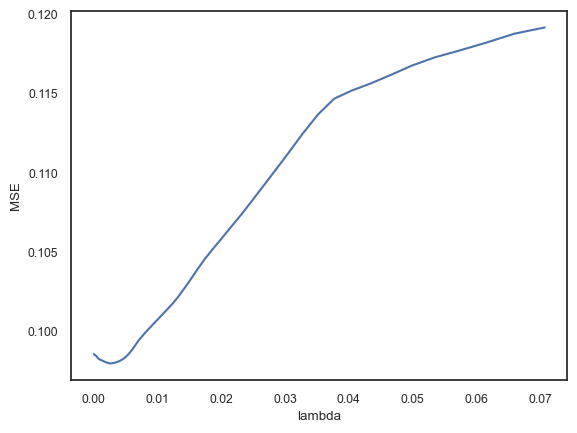

LASSO CV MSE best result : lambda = 0.00266102550574491, MSE = 0.09799219403283173


,variable,coef
0,Age,-2.702479e-02
1,DistanceFromHome,1.678288e-02
2,Education,0.000000e+00
3,EnvironmentSatisfaction,-3.731279e-02
4,JobInvolvement,-3.120928e-02
5,JobLevel,-2.567990e-02
6,JobSatisfaction,-3.041999e-02
7,MonthlyIncome,-0.000000e+00
8,NumCompaniesWorked,2.404379e-02
9,PercentSalaryHike,-4.583934e-03


In [89]:
lasso_model = LassoCV(cv = stratified_kfold, random_state=42, max_iter=10000) 

X_RnD_lasso = X_RnD.copy()

# Scale the data before LASSO
X_RnD_lasso[numeric_cols] = StandardScaler().fit(X_RnD_lasso[numeric_cols]).transform(X_RnD_lasso[numeric_cols]) 

# LASSO : find the optimal parameter lambda
lasso_model.fit(X_RnD_lasso, y_RnD)

print("Best model searched for Lasso:\nalpha = {}\nintercept = {}\nbetas = {}, ".format(lasso_model.alpha_,
                                                                            lasso_model.intercept_,
                                                                            lasso_model.coef_
                                                                            ))
# LASSO CV MSE check
lasso_cv_min_mse_idx = np.argmin(np.mean(lasso_model.mse_path_,axis=1))
lasso_cv_mse = np.mean(lasso_model.mse_path_,axis=1)
plt.figure()
plt.plot(lasso_model.alphas_, lasso_cv_mse)
plt.xlabel("lambda")
plt.ylabel("MSE")
plt.show()
print(f'LASSO CV MSE best result : lambda = {lasso_model.alpha_}, MSE = {lasso_cv_mse[lasso_cv_min_mse_idx]}')


# LASSO : optimal parameter lambda fitting to the model
lasso_opt_model = Lasso(alpha=lasso_model.alpha_)
lasso_opt_model.fit(X_RnD_lasso, y_RnD) 

lasso_coef_df = pd.DataFrame({"variable" :list(X_RnD_lasso.columns), "coef":lasso_opt_model.coef_,})
lasso_coef_df

In [90]:
# Non-selected variables
non_selected_var_lasso = list(lasso_coef_df[lasso_coef_df["coef"]==0]["variable"].values)
print(f'The {len(non_selected_var_lasso)} non-selected variables from LASSO : {non_selected_var_lasso}')

The 12 non-selected variables from LASSO : ['Education', 'MonthlyIncome', 'YearsAtCompany', 'BusinessTravel_Travel_Rarely', 'EducationField_Life Sciences', 'EducationField_Medical', 'EducationField_Other', 'Gender_Male', 'JobRole_Manager', 'JobRole_Manufacturing Director', 'JobRole_Research Director', 'JobRole_Research Scientist']


In [91]:
# Selected variables
selected_var_lasso =list(X_RnD_lasso.drop(columns=non_selected_var_lasso).columns)

print(f'The {len(selected_var_lasso)} selected variables from LASSO : {list(selected_var_lasso)}')

The 25 selected variables from LASSO : ['Age', 'DistanceFromHome', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'BusinessTravel_Non-Travel', 'BusinessTravel_Travel_Frequently', 'EducationField_Technical Degree', 'Gender_Female', 'JobRole_Healthcare Representative', 'JobRole_Laboratory Technician', 'OverTime_No', 'OverTime_Yes']


In [92]:
# Selected variables applied to Logistic model
X_RnD_lasso_opt = X_RnD_lasso.drop(columns=non_selected_var_lasso) 
X_RnD_lasso_numeric_cols = X_RnD_lasso_opt.select_dtypes(include=['int64', 'float64']).columns

# LASSO
lasso_result = {'accuracy': 0, 'precision': 0, 'recall': 0, 'f1': 0, 'roc_auc' : 0}

np.random.seed(42)

# Test on Logistic regression with 50 different split
for c in range(50) :
    X_train, X_test, y_train, y_test = train_test_split(X_RnD_lasso_opt, y_RnD, train_size = 0.8, test_size=0.2)

    X_train[X_RnD_lasso_numeric_cols] = StandardScaler().fit(X_train[X_RnD_lasso_numeric_cols]).\
    transform(X_train[X_RnD_lasso_numeric_cols]) 
    X_test[X_RnD_lasso_numeric_cols] = StandardScaler().fit(X_test[X_RnD_lasso_numeric_cols]).\
    transform(X_test[X_RnD_lasso_numeric_cols]) 
           
    logit = LogisticRegression()
    lasso_metrics = modeling(logit, X_train, X_test, y_train, y_test)
    for metric, score in lasso_metrics.items() :
        lasso_result[metric] += score

print("Logistic Regression (cv=50) result, using selected variables from LASSO :")
{key: value / 50 for key, value in lasso_result.items()}

Logistic Regression (cv=50) result, using selected variables from LASSO :


{'accuracy': 0.8869430051813475,
 'precision': 0.710550570344688,
 'recall': 0.3375418753007681,
 'f1': 0.4516668525658335,
 'roc_auc': 0.657556778452493}

### 3.2.2.2. SelectKbest (Mutual Information, Chi-Squared, ANOVA)

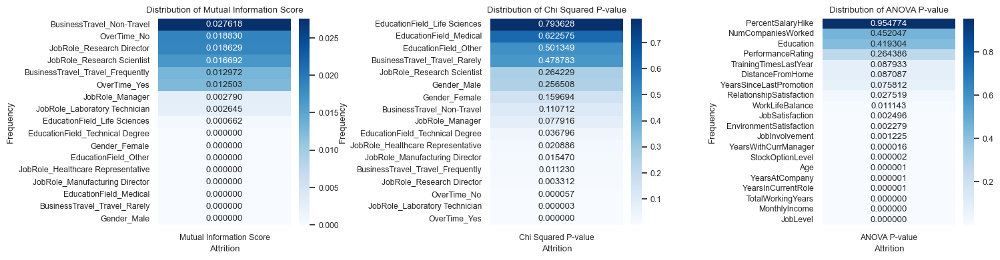

In [93]:
np.random.seed(42)

# filter categorical variables (Mutual Information)
kbest_MI = SelectKBest(score_func = mutual_info_classif, k = 'all')
# kbest_MI_fit = kbest_MI.fit(X_train_smt[categorical_cols], y_train_smt)
kbest_MI_fit = kbest_MI.fit(X_RnD[categorical_cols], y_RnD) 

kbest_MI_result = pd.DataFrame(data = kbest_MI_fit.scores_, index = list(X_RnD[categorical_cols].columns), 
                             columns = ['Mutual Information Score']).sort_values(by = "Mutual Information Score", 
                                                                                 ascending=False)  # MI gives only score

# filter categorical variables (Chi Squared)
kbest_chi = SelectKBest(score_func = chi2, k = 'all')
# kbest_chi_fit = kbest_chi.fit(X_train_smt[categorical_cols], y_train_smt)
kbest_chi_fit = kbest_chi.fit(X_RnD[categorical_cols], y_RnD)


kbest_chi_result = pd.DataFrame(data = kbest_chi_fit.pvalues_, index = list(X_RnD[categorical_cols].columns), 
                             columns = ['Chi Squared P-value']).sort_values(by = "Chi Squared P-value", ascending=False) \
                                # Chi Sqaured p value 

# filter numerical variables (ANOVA)
kbest_anova = SelectKBest(score_func = f_classif, k = 'all')
# kbest_anova_fit = kbest_anova.fit(X_train_smt[numerical_cols], y_train_smt)

# numerical variables scaling
X_RnD_anova = X_RnD.copy()
X_RnD_anova[numeric_cols] = StandardScaler().fit(X_RnD_anova[numeric_cols]).transform(X_RnD_anova[numeric_cols]) 

kbest_anova_fit = kbest_anova.fit(X_RnD_anova[numerical_cols], y_RnD)


kbest_anova_result = pd.DataFrame(data = kbest_anova_fit.pvalues_, index = list(X_RnD_anova[numerical_cols].columns), 
                             columns = ['ANOVA P-value']).sort_values(by = "ANOVA P-value", ascending=False) 

kbest_results = [kbest_MI_result, kbest_chi_result, kbest_anova_result]

plt.figure(figsize=(15, 1 * 4)) 

for i, kbest in enumerate(kbest_results, 1): 
    plt.subplot(1, 3, i)  
    sns.heatmap(kbest, cmap="Blues", annot=True, fmt="f")
    plt.title(f"Distribution of {list(kbest.columns)[0]}")
    plt.xlabel("Attrition")
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

# Based on the results, the MI result implies none of the categorical variables has much relation with Attrition
# the Chi-squared result indicates that some categorical variables significant 
# the ANOVA result shows that some variables are not significant

In [94]:
kbest_selected_categorical = kbest_chi_result[(kbest_chi_result <= 0.05).any(axis=1)].index 
kbest_selected_numerical = kbest_anova_result[(kbest_anova_result <= 0.05).any(axis=1)].index

kbest_selected_cols = list(kbest_selected_categorical) + list(kbest_selected_numerical)
print(f'The {len(kbest_selected_cols)} selected variables from SelectKbest : {kbest_selected_cols}', "\n")

kbest_nonselected_cols = list(set(X_RnD.columns) - set(kbest_selected_cols))
print(f'The {len(kbest_nonselected_cols)} non-selected variables from SelectKbest : {kbest_nonselected_cols}')

The 21 selected variables from SelectKbest : ['EducationField_Technical Degree', 'JobRole_Healthcare Representative', 'JobRole_Manufacturing Director', 'BusinessTravel_Travel_Frequently', 'JobRole_Research Director', 'OverTime_No', 'JobRole_Laboratory Technician', 'OverTime_Yes', 'RelationshipSatisfaction', 'WorkLifeBalance', 'JobSatisfaction', 'EnvironmentSatisfaction', 'JobInvolvement', 'YearsWithCurrManager', 'StockOptionLevel', 'Age', 'YearsAtCompany', 'YearsInCurrentRole', 'TotalWorkingYears', 'MonthlyIncome', 'JobLevel'] 

The 16 non-selected variables from SelectKbest : ['Education', 'JobRole_Manager', 'YearsSinceLastPromotion', 'Gender_Female', 'PercentSalaryHike', 'NumCompaniesWorked', 'Gender_Male', 'DistanceFromHome', 'EducationField_Other', 'TrainingTimesLastYear', 'BusinessTravel_Non-Travel', 'JobRole_Research Scientist', 'EducationField_Life Sciences', 'EducationField_Medical', 'BusinessTravel_Travel_Rarely', 'PerformanceRating']


In [95]:
# Applying to Logistic Regression, using selected variables form Kbest
X_RnD_kbest = X_RnD[kbest_selected_cols]

# Kbest result
kbest_result = {'accuracy': 0, 'precision': 0, 'recall': 0, 'f1': 0, 'roc_auc' : 0}

np.random.seed(42)

# Test on Logistic regression with 50 different split
for c in range(50) :
    X_train, X_test, y_train, y_test = train_test_split(X_RnD_kbest, y_RnD, train_size = 0.8, test_size=0.2)

    X_train[kbest_selected_numerical] = StandardScaler().fit(X_train[kbest_selected_numerical]).\
    transform(X_train[kbest_selected_numerical]) 
    X_test[kbest_selected_numerical] = StandardScaler().fit(X_test[kbest_selected_numerical]).\
    transform(X_test[kbest_selected_numerical]) 
   
    logit = LogisticRegression()
    kbest_metrics = modeling(logit, X_train, X_test, y_train, y_test)
    for metric, score in kbest_metrics.items() :
        kbest_result[metric] += score

print("Logistic Regression (cv=50) result, using selected variables from Kbest :")
{key: value / 50 for key, value in kbest_result.items()}

Logistic Regression (cv=50) result, using selected variables from Kbest :


{'accuracy': 0.886735751295337,
 'precision': 0.7321374866963102,
 'recall': 0.31371146479577516,
 'f1': 0.4328949920281843,
 'roc_auc': 0.6473688859000153}

### 3.2.2.3. Tree-based Selection method

In [96]:
# Random Forest 
clf_result_num = {}

# check different number of the variables used
for i in range(len(X_RnD.columns)) :
    clf = RandomForestClassifier(n_estimators=100)
    
    clf_fit = clf.fit(X_RnD, y_RnD) # no scaling needed for RF
    clf_features = pd.DataFrame(clf_fit.feature_importances_, index=list(X_RnD.columns), 
                                columns=["features"]).sort_values(by="features", ascending=False)
    clf_selected_features = clf_features.head(i+1).index 
    X_RnD_clf = X_RnD[clf_selected_features] 
    X_RnD_clf_numeric = X_RnD_clf.select_dtypes(include=("int64", "float")).columns

    clf_result = []
    clf_coef = {}
  
    np.random.seed(42)
    
    # run CV with Logistic Regression for each different number of variables
    for c in range(50) :
        X_train, X_test, y_train, y_test = train_test_split(X_RnD_clf, y_RnD, train_size = 0.8, test_size=0.2)

        X_train[X_RnD_clf_numeric] = StandardScaler().fit(X_train[X_RnD_clf_numeric]).transform(X_train[X_RnD_clf_numeric])
        X_test[X_RnD_clf_numeric] = StandardScaler().fit(X_test[X_RnD_clf_numeric]).transform(X_test[X_RnD_clf_numeric]) 
      
        logit = LogisticRegression()
        clf_fit = logit.fit(X_train, y_train).predict(X_test)
        clf_f1 = f1_score(y_test, clf_fit)
        clf_result.append(clf_f1)
        clf_coef[c]=clf.feature_importances_
    clf_result_num[i+1] = np.mean(clf_result)

print(clf_result_num)

{1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.1184832764057818, 8: 0.1177954457179511, 9: 0.1460842456281403, 10: 0.1512511216332516, 11: 0.20706769209153758, 12: 0.22977476440631975, 13: 0.21164249450251382, 14: 0.2668866557300963, 15: 0.2782548868617912, 16: 0.2778008311911206, 17: 0.27745488274204533, 18: 0.3292051342758078, 19: 0.38783459784395896, 20: 0.3824979532077586, 21: 0.3868263963420858, 22: 0.4275573712501668, 23: 0.42035067992440817, 24: 0.4320006847514334, 25: 0.4616903247578137, 26: 0.4572655278638063, 27: 0.4605560239823275, 28: 0.44991521029074266, 29: 0.4490366371797436, 30: 0.4512573605091405, 31: 0.44922082609445363, 32: 0.4462792247312122, 33: 0.4442124824769354, 34: 0.44148725776477, 35: 0.44138555822918085, 36: 0.44595005057236853, 37: 0.4447572701393265}


In [97]:
max_key = max(clf_result_num, key=clf_result_num.get)
max_value = clf_result_num[max_key]
max_key, max_value
print(f"Logistic Regression (cv=50) result, {max_key} variables with f1 score of {max_value} from Random Forest Classifier")

Logistic Regression (cv=50) result, 25 variables with f1 score of 0.4616903247578137 from Random Forest Classifier


In [98]:
clf = RandomForestClassifier(n_estimators=100)
clf_fit = clf.fit(X_RnD, y_RnD)
clf_features = pd.DataFrame(clf_fit.feature_importances_, index=list(X_RnD.columns), 
                            columns=["features"]).sort_values(by="features", ascending=False)
clf_selected_features = list(clf_features.head(max_key).index)

print(f'The {len(clf_selected_features)} selected variables from Random Forest Classifier : {clf_selected_features}', "\n")
rf_nonselected_cols = list(set(X_RnD.columns) - set(X_RnD[clf_selected_features]))
print(f'The {len(rf_nonselected_cols)} non-selected variables from Random Forest Classifier : {rf_nonselected_cols}')

The 25 selected variables from Random Forest Classifier : ['MonthlyIncome', 'Age', 'DistanceFromHome', 'TotalWorkingYears', 'PercentSalaryHike', 'YearsAtCompany', 'OverTime_No', 'YearsWithCurrManager', 'RelationshipSatisfaction', 'OverTime_Yes', 'EnvironmentSatisfaction', 'YearsInCurrentRole', 'WorkLifeBalance', 'JobSatisfaction', 'NumCompaniesWorked', 'JobLevel', 'TrainingTimesLastYear', 'StockOptionLevel', 'JobInvolvement', 'Education', 'YearsSinceLastPromotion', 'JobRole_Laboratory Technician', 'BusinessTravel_Travel_Frequently', 'EducationField_Medical', 'EducationField_Technical Degree'] 

The 12 non-selected variables from Random Forest Classifier : ['JobRole_Manager', 'Gender_Female', 'Gender_Male', 'JobRole_Healthcare Representative', 'EducationField_Other', 'BusinessTravel_Non-Travel', 'JobRole_Research Scientist', 'EducationField_Life Sciences', 'JobRole_Research Director', 'BusinessTravel_Travel_Rarely', 'PerformanceRating', 'JobRole_Manufacturing Director']


### 3.2.2.4. Forward Selection Method

In [99]:
logit = LogisticRegression(max_iter=3000)
np.random.seed(42)
sfs = SequentialFeatureSelector(logit, direction="forward", scoring='f1', cv=stratified_kfold, n_features_to_select='auto')
# backward too slow

# numerical variables scaling
X_RnD_sfs = X_RnD.copy()
X_RnD_sfs[numeric_cols] = StandardScaler().fit(X_RnD_sfs[numeric_cols]).transform(X_RnD_sfs[numeric_cols]) 

sfs_fit = sfs.fit(X_RnD_sfs, y_RnD) 

selected_sfs = list(sfs_fit.get_feature_names_out())
print(f'The {len(selected_sfs)} selected variables are {selected_sfs}')

The 18 selected variables are ['Age', 'DistanceFromHome', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'PerformanceRating', 'StockOptionLevel', 'TrainingTimesLastYear', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'BusinessTravel_Travel_Rarely', 'EducationField_Technical Degree', 'JobRole_Laboratory Technician', 'JobRole_Manager', 'JobRole_Manufacturing Director', 'OverTime_No', 'OverTime_Yes']


In [100]:
non_selected_sfs = list(set(X_RnD_sfs.columns)-set(list(sfs_fit.get_feature_names_out())))
print(f'The {len(non_selected_sfs)} non-selected variables are {non_selected_sfs}')

The 19 non-selected variables are ['NumCompaniesWorked', 'MonthlyIncome', 'EducationField_Other', 'JobRole_Research Scientist', 'YearsAtCompany', 'JobRole_Healthcare Representative', 'EducationField_Life Sciences', 'EducationField_Medical', 'Education', 'RelationshipSatisfaction', 'BusinessTravel_Non-Travel', 'TotalWorkingYears', 'WorkLifeBalance', 'Gender_Female', 'PercentSalaryHike', 'Gender_Male', 'JobSatisfaction', 'JobRole_Research Director', 'BusinessTravel_Travel_Frequently']


In [101]:
# Apply the selected variables to Logistic Regression (cv=50)

X_RnD_sfs_opt = X_RnD_sfs[selected_sfs]
X_RnD_sfs_opt_numeric = X_RnD_sfs_opt.select_dtypes(include=['int64', 'float64']).columns

# sfs result
sfs_result = {'accuracy': 0, 'precision': 0, 'recall': 0, 'f1': 0, 'roc_auc' : 0}

np.random.seed(42)

for c in range(50) :
    X_train, X_test, y_train, y_test = train_test_split(X_RnD_sfs_opt, y_RnD, train_size = 0.8, test_size=0.2)

    X_train[X_RnD_sfs_opt_numeric] = StandardScaler().fit(X_train[X_RnD_sfs_opt_numeric]).transform(X_train[X_RnD_sfs_opt_numeric]) 
    X_test[X_RnD_sfs_opt_numeric] = StandardScaler().fit(X_test[X_RnD_sfs_opt_numeric]).transform(X_test[X_RnD_sfs_opt_numeric])
   
    logit = LogisticRegression()
    sfs_metrics = modeling(logit, X_train, X_test, y_train, y_test)
    for metric, score in sfs_metrics.items() :
        sfs_result[metric] += score

print("Logistic Regression (cv=50) result, using selected variables from Kbest :")
{key: value / 50 for key, value in sfs_result.items()}

Logistic Regression (cv=50) result, using selected variables from Kbest :


{'accuracy': 0.8863212435233163,
 'precision': 0.7736924970454383,
 'recall': 0.27582030774779187,
 'f1': 0.4012409883430255,
 'roc_auc': 0.6312373909413868}

### 3.2.2.5. Using All Variables

In [102]:
# Apply the selected variables to Logistic Regression (cv=50)

X_RnD_all = X_RnD.copy() 
X_RnD_all_numeric = X_RnD_all.select_dtypes(include=['int64', 'float64']).columns

# all result
all_result = {'accuracy': 0, 'precision': 0, 'recall': 0, 'f1': 0, 'roc_auc' : 0}

np.random.seed(42)

for c in range(50) :
    X_train, X_test, y_train, y_test = train_test_split(X_RnD_all, y_RnD, train_size = 0.8, test_size=0.2)

    X_train[X_RnD_all_numeric] = StandardScaler().fit(X_train[X_RnD_all_numeric]).transform(X_train[X_RnD_all_numeric]) 
    X_test[X_RnD_all_numeric] = StandardScaler().fit(X_test[X_RnD_all_numeric]).transform(X_test[X_RnD_all_numeric])
       
    logit = LogisticRegression()
    all_metrics = modeling(logit, X_train, X_test, y_train, y_test)
    for metric, score in all_metrics.items() :
        all_result[metric] += score

print("Logistic Regression (cv=50) result, using all variables:")
{key: value / 50 for key, value in all_result.items()}

Logistic Regression (cv=50) result, using all variables:


{'accuracy': 0.8848704663212438,
 'precision': 0.6931277301130244,
 'recall': 0.33450504297282313,
 'f1': 0.4447572701393265,
 'roc_auc': 0.6551321224547046}

In [103]:
# class weight changed check up

X_RnD_all = X_RnD.copy() 
X_RnD_all_numeric = X_RnD_all.select_dtypes(include=['int64', 'float64']).columns

# all result
all_result = {'accuracy': 0, 'precision': 0, 'recall': 0, 'f1': 0, 'roc_auc' : 0}

np.random.seed(42)

for c in range(1) :
    X_train, X_test, y_train, y_test = train_test_split(X_RnD_all, y_RnD, train_size = 0.8, test_size=0.2)

    X_train[X_RnD_all_numeric] = StandardScaler().fit(X_train[X_RnD_all_numeric]).transform(X_train[X_RnD_all_numeric]) 
    X_test[X_RnD_all_numeric] = StandardScaler().fit(X_test[X_RnD_all_numeric]).transform(X_test[X_RnD_all_numeric])
      
    logit = LogisticRegression(class_weight = {0:1, 1:3}, max_iter = 10000)
    y_pred = logit.fit(X_train, y_train).predict(X_test)
    print(confusion_matrix(y_test, y_pred))
    all_metrics = modeling(logit, X_train, X_test, y_train, y_test)
    for metric, score in all_metrics.items() :
        all_result[metric] += score

print("Logistic Regression (cv=50) result, using all variables :")
{key: value / 1 for key, value in all_result.items()}

[[155  15]
 [  7  16]]
Logistic Regression (cv=50) result, using all variables :


{'accuracy': 0.8860103626943006,
 'precision': 0.5161290322580645,
 'recall': 0.6956521739130435,
 'f1': 0.5925925925925926,
 'roc_auc': 0.8037084398976981}

In [104]:
### Compared to F1 score from Sales Dept, F1 score in R&D seems lower. This might be because the data is more imbalanced

### The selected variables from Random Froest Classifier yield the best result

LinearRegression score : 0.2171 

Cumulative explained variance of 2 PCs (R&D Dept.) : 0.3308


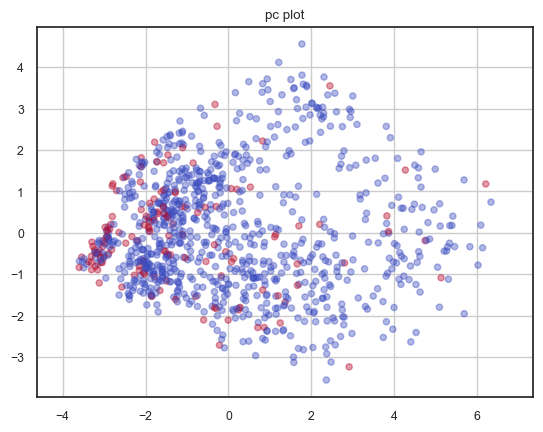

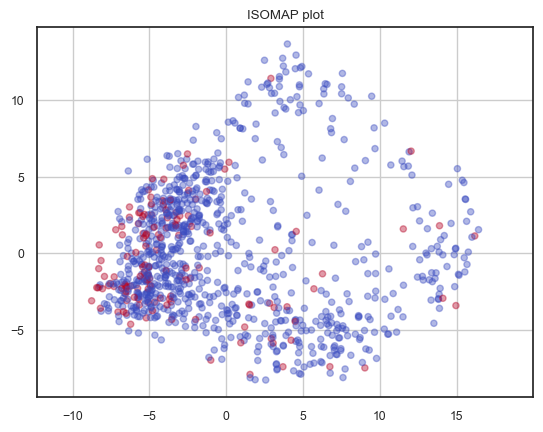

In [105]:
# The selected variables from LASSO yield the best result
# PCA, ISOMAP plot with the selected variables from RF

X_RnD_final = X_RnD[clf_selected_features].copy()
X_RnD_final_numerical_col = X_RnD_final.select_dtypes(include = ["float64", "int64"]).columns
X_RnD_final[X_RnD_final_numerical_col] = StandardScaler().fit(X_RnD_final[X_RnD_final_numerical_col]).\
                                                transform(X_RnD_final[X_RnD_final_numerical_col]) 

linear = LinearRegression()
linear.fit(X_RnD_final, y_RnD)
print(f'LinearRegression score : {round(linear.score(X_RnD_final, y_RnD),4)}', "\n") # non - linear


# PCA
pca = PCA(n_components =2).fit(X_RnD_final)
pc = pca.transform(X_RnD_final)
print(f'Cumulative explained variance of 2 PCs (R&D Dept.) : {round(sum(pca.explained_variance_ratio_),4)}') 

plt.figure()
plt.scatter(pc[:,0], pc[:,1], s=20, c=y_RnD, alpha = 0.4, cmap = "coolwarm")
plt.axis('equal')
plt.grid()
plt.title('pc plot')
plt.show() 

# ISOMAP
isomap = Isomap(n_components=2, n_neighbors=5)
X_reduced = isomap.fit_transform(X_RnD_final)

plt.figure()
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], s=20, c=y_RnD, alpha = 0.4, cmap = "coolwarm")
plt.axis('equal')
plt.grid()
plt.title('ISOMAP plot')
plt.show() 

In [106]:
X_RnD_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 961 entries, 1 to 1469
Data columns (total 25 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   MonthlyIncome                     961 non-null    float64
 1   Age                               961 non-null    float64
 2   DistanceFromHome                  961 non-null    float64
 3   TotalWorkingYears                 961 non-null    float64
 4   PercentSalaryHike                 961 non-null    float64
 5   YearsAtCompany                    961 non-null    float64
 6   OverTime_No                       961 non-null    bool   
 7   YearsWithCurrManager              961 non-null    float64
 8   RelationshipSatisfaction          961 non-null    float64
 9   OverTime_Yes                      961 non-null    bool   
 10  EnvironmentSatisfaction           961 non-null    float64
 11  YearsInCurrentRole                961 non-null    float64
 12  WorkLifeBala

### SMOTE

In [107]:
weights = list(np.linspace(0.3, 1.0, 50))

smote_pipe = Pipeline([('smote', SMOTE(random_state=42)),
                       ('scale', StandardScaler()),
                         ('logit', LogisticRegression(random_state=42, max_iter = 5000))])

stratified_kfold = StratifiedKFold(n_splits=10,
                                       shuffle=True,
                                       random_state=42)

gcv_sm = GridSearchCV(estimator = smote_pipe, param_grid = {'smote__sampling_strategy' : weights}, scoring = 'f1', 
                   cv = stratified_kfold, error_score='raise')

gcv_result_sm = gcv_sm.fit(X_RnD_final, y_RnD) 
print(f'The best resampling ratio is {gcv_result_sm.best_params_["smote__sampling_strategy"]}, yielding score of ' 
      f'{gcv_result_sm.best_score_}')

The best resampling ratio is 0.8, yielding score of 0.4963140133329233


### SMOTENC

In [108]:
# Find categorical column indices for SMOTENC
smotenc_cate_feature = [ind for ind, tf in enumerate(X_RnD_final.dtypes == bool) if tf == True]
smotenc_cate_feature

[6, 9, 21, 22, 23, 24]

In [109]:
# weights = list(np.linspace(0.29, 0.35, 50))
weights = list(np.linspace(0.7, 1.0, 50))

smotenc_pipe = Pipeline([('smotenc', SMOTENC(random_state=42, categorical_features = smotenc_cate_feature)), 
                         ('scale', StandardScaler()),
                         ('logit', LogisticRegression(random_state=42, max_iter = 5000))])

gcv_smnc = GridSearchCV(estimator = smotenc_pipe, param_grid = {'smotenc__sampling_strategy' : weights}, scoring = 'f1', 
                   cv = stratified_kfold, error_score='raise')

gcv_result_smnc = gcv_smnc.fit(X_RnD_final, y_RnD)
print(f'The best resampling ratio is {gcv_result_smnc.best_params_["smotenc__sampling_strategy"]}, yielding score of ' 
      f'{gcv_result_smnc.best_score_}')

The best resampling ratio is 0.7061224489795918, yielding score of 0.4854197639537163


### 3.2.3. Modeling

### 3.2.3.1. Parameter Tuning

In [110]:
# XGB Class Weight 
X_train, X_test, y_train, y_test = train_test_split(X_RnD_final, y_RnD, train_size = 0.8, test_size=0.2, random_state=42)
ratio = float(y_train.value_counts()[0]) / y_train.value_counts()[1]
y_pred_temp = XGBClassifier(scale_pos_weight=ratio, random_state=42, learning_rate = 0.005, n_estimators = 1750, max_depth = 10).fit(X_train, y_train).predict(X_test)
ratio, f1_score(y_test, y_pred_temp)

(5.9818181818181815, 0.55)

In [111]:
np.random.seed(42)
model_params = {
                "logit" : {'model' : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                                    sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('logit', LogisticRegression(random_state=42, tol=1.0e-2, max_iter=5000, 
                                                                         class_weight = {0:1, 1:0.8},
                                                                         solver='sag'))]), # sag  the best
                                            'params' : {'logit__penalty': ["l2"], 
                                                        'logit__C' : [0.005, 0.01, 0.015, 0.02]}},
                "SVM" : {'model' : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('nomal', MinMaxScaler()),
                                            ('SVM', SVC(random_state=42, tol=1.0e-2, max_iter=100000))]),
                          'params' : {'SVM__kernel': ["linear", "rbf", "sigmoid", "poly"], 
                                      'SVM__gamma' : ["auto", "scale"], 
                                     'SVM__class_weight' : ["balanced", None],  
                                     'SVM__C' : [0.8, 0.9, 1, 1.1]}},
                "LGBM" : {'model' : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('LGBM', lgb.LGBMClassifier(random_state=42))]),
                          'params' : {'LGBM__num_leaves' : [2, 3, 4, 5],
                                      'LGBM__n_estimators':[980, 1000, 1050],
                                      'LGBM__learning_rate': [0.005],
                                      'LGBM__verbosity':[-1]}},
                "XGB": {'model': Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('XGB', XGBClassifier(random_state=42, 
                                                                  scale_pos_weight=ratio))]),
                        'params': { 'XGB__learning_rate': [0.005],
                                    'XGB__n_estimators': [1000, 1750, 2000], 
                                    'XGB__max_depth':[3, 5, 8]}},
                "AdaBoost": {'model': Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('AdaBoost', AdaBoostClassifier(random_state=42))]),
                        'params': {'AdaBoost__estimator': [DecisionTreeClassifier(max_depth=i) for i in range(2,10,2)], 
                                   'AdaBoost__n_estimators':[1, 2, 3, 4],
                                   'AdaBoost__learning_rate':[0.005]}},
                "RF": {'model' : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('RF', RandomForestClassifier(random_state=42))]),
                       'params' : {'RF__n_estimators' : [60, 80, 100, 150],
                                   'RF__min_samples_split' : [15, 20, 40, 50],
                                   'RF__max_depth' : [2, 3, 4, 8], 
                                   'RF__class_weight' : [None]}}, 
                "MLP": {'model' : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('MLP', MLPClassifier(random_state=42, max_iter =1000, tol=1e-2))]),
                       'params' : {'MLP__learning_rate_init' : [0.005],
                                   'MLP__hidden_layer_sizes' : [(10, ), (19, ), (20,)],
                                   'MLP__activation' : ['identity', 'logistic', 'tanh', 'relu'],
                                    'MLP__solver' : ['lbfgs', 'sgd', 'adam']}},
                "lda" : {'model' : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('lda', LinearDiscriminantAnalysis(tol=1.0e-2))]),
                          'params' : {'lda__solver': ["svd", "lsqr", "eigen"], 
                                     'lda__shrinkage' : ["auto", None]}}}

In [112]:
np.random.seed(42)

X_train, X_test, y_train, y_test = train_test_split(X_RnD_final, y_RnD, train_size = 0.8, test_size=0.2, random_state=42)

best_para = []
best_score = []
test_score = []
grid_cm = {}
best_coef = {}

stratified_kfold = StratifiedKFold(n_splits=10,
                                       shuffle=True, 
                                       random_state=42)

for name, model in model_params.items() :
    grid_cv = GridSearchCV(model['model'], model['params'], cv=stratified_kfold, scoring='f1')
    grid_cv.fit(X_train, y_train) 
    
    best_para.append(grid_cv.best_params_) 
    best_score.append(grid_cv.best_score_) 
    
    # test score 
    y_pred = grid_cv.predict(X_test)
    grid_test_score = f1_score(y_test, y_pred)
    test_score.append(grid_test_score)
    
    # confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    grid_cm[name] = cm

    # feature importance or coef
    if name in ["LGBM", "XGB", "AdaBoost", "RF"] :
        best_coef[name] = grid_cv.best_estimator_.named_steps[name].feature_importances_
    elif name in ["MLP"] :
        best_coef[name] = grid_cv.best_estimator_.named_steps[name].coefs_
    elif name in ["SVM"] :
        if grid_cv.best_estimator_["SVM"].kernel=="linear" : 
            best_coef[name] = grid_cv.best_estimator_.named_steps[name].coef_
        else : 
            continue
    else :
        best_coef[name] = grid_cv.best_estimator_.named_steps[name].coef_

C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
10 fits failed out of a total of 60.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\taewu\anaconda3\Lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\discriminant_analysis.py", line 615, in fit
    raise NotImplementedError("shrinkage not supported

In [113]:
# validation set score vs test set score
pd.DataFrame({"CV Validation score" : best_score, "Test score" : test_score}, model_params.keys()).sort_values(
    by="CV Validation score", ascending=False)

,CV Validation score,Test score
RF,0.537076,0.585366
logit,0.530537,0.585366
MLP,0.518286,0.500000
SVM,0.507639,0.558140
LGBM,0.500605,0.549020
AdaBoost,0.476267,0.476190
lda,0.467645,0.510638
XGB,0.467328,0.612245


In [114]:
# check the optimal parameters for each model
para_dict = {}
for idx, result in enumerate(best_para):
    model_name = list(result.keys())[0].split('__')[0]
    para_dict[model_name] = result

para_dict

{'logit': {'logit__C': 0.01, 'logit__penalty': 'l2'},
 'SVM': {'SVM__C': 1,
  'SVM__class_weight': None,
  'SVM__gamma': 'auto',
  'SVM__kernel': 'rbf'},
 'LGBM': {'LGBM__learning_rate': 0.005,
  'LGBM__n_estimators': 1050,
  'LGBM__num_leaves': 2,
  'LGBM__verbosity': -1},
 'XGB': {'XGB__learning_rate': 0.005,
  'XGB__max_depth': 5,
  'XGB__n_estimators': 1750},
 'AdaBoost': {'AdaBoost__estimator': DecisionTreeClassifier(max_depth=2),
  'AdaBoost__learning_rate': 0.005,
  'AdaBoost__n_estimators': 1},
 'RF': {'RF__class_weight': None,
  'RF__max_depth': 4,
  'RF__min_samples_split': 40,
  'RF__n_estimators': 80},
 'MLP': {'MLP__activation': 'identity',
  'MLP__hidden_layer_sizes': (19,),
  'MLP__learning_rate_init': 0.005,
  'MLP__solver': 'lbfgs'},
 'lda': {'lda__shrinkage': 'auto', 'lda__solver': 'lsqr'}}

In [115]:
grid_cm

{'logit': array([[164,   6],
        [ 11,  12]], dtype=int64),
 'SVM': array([[162,   8],
        [ 11,  12]], dtype=int64),
 'LGBM': array([[156,  14],
        [  9,  14]], dtype=int64),
 'XGB': array([[159,  11],
        [  8,  15]], dtype=int64),
 'AdaBoost': array([[161,   9],
        [ 13,  10]], dtype=int64),
 'RF': array([[164,   6],
        [ 11,  12]], dtype=int64),
 'MLP': array([[157,  13],
        [ 11,  12]], dtype=int64),
 'lda': array([[158,  12],
        [ 11,  12]], dtype=int64)}

### 3.2.3.2. Modeling with the optimal parameters

In [116]:
# Final model pipeline with the optimal parameters
np.random.seed(42)
model_pipeline = {
                "LGBM" : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('LGBM', lgb.LGBMClassifier(random_state=42, num_leaves = para_dict["LGBM"]["LGBM__num_leaves"]
                                                                    , n_estimators= para_dict["LGBM"]["LGBM__n_estimators"],
                                                                   learning_rate = para_dict["LGBM"]["LGBM__learning_rate"]
                                                                    ,verbosity = -1))]),
                "logit" : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                                    sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('logit', LogisticRegression(random_state=42, tol=1.0e-2, max_iter=5000,
                                                                         class_weight = {0:1, 1:0.8},
                                                                         solver='sag', penalty= para_dict["logit"]["logit__penalty"], 
                                                                         C = para_dict["logit"]["logit__C"]))]),
                "XGB": Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('XGB', XGBClassifier(random_state=42, scale_pos_weight=ratio, 
                                                                  learning_rate= para_dict["XGB"]["XGB__learning_rate"]
                                                                  , n_estimators= para_dict["XGB"]["XGB__n_estimators"],
                                                                 max_depth = para_dict["XGB"]["XGB__max_depth"]))]),
                "AdaBoost": Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('AdaBoost', AdaBoostClassifier(random_state=42, estimator = para_dict["AdaBoost"]["AdaBoost__estimator"], 
                                                                            n_estimators = para_dict["AdaBoost"]["AdaBoost__n_estimators"], 
                                                                            learning_rate = para_dict["AdaBoost"]["AdaBoost__learning_rate"]))]),
                "RF": Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('RF', RandomForestClassifier(random_state=42, class_weight = para_dict["RF"]["RF__class_weight"],
                                                                          n_estimators = para_dict["RF"]["RF__n_estimators"], 
                                                                         min_samples_split =para_dict["RF"]["RF__min_samples_split"] , 
                                                                          max_depth = para_dict["RF"]["RF__max_depth"]))]),
                "MLP": Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('MLP', MLPClassifier(random_state=42, max_iter =1000, tol=1e-2, 
                                                                  activation=para_dict["MLP"]["MLP__activation"],
                                                                  solver = para_dict["MLP"]["MLP__solver"],
                                                                 learning_rate_init= para_dict["MLP"]["MLP__learning_rate_init"], 
                                                                  hidden_layer_sizes= para_dict["MLP"]["MLP__hidden_layer_sizes"]))]),
                "lda" : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('lda', LinearDiscriminantAnalysis(tol=1.0e-2, solver = para_dict["lda"]["lda__solver"], 
                                                                              shrinkage = para_dict["lda"]["lda__shrinkage"]))]),
                 "SVM" : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                           ('nomal', MinMaxScaler()),
                                            ('SVM', SVC(random_state=42, tol=1.0e-2, max_iter=100000, kernel= para_dict["SVM"]["SVM__kernel"], 
                                                       gamma= para_dict["SVM"]["SVM__gamma"], C = para_dict["SVM"]["SVM__C"], 
                                                       class_weight = para_dict["SVM"]["SVM__class_weight"]))])}

In [117]:
recall, f1, precision, accuracy, roc_auc = {}, {}, {}, {}, {}
recall_mean, f1_mean, precision_mean, accuracy_mean, roc_auc_mean = {}, {}, {}, {}, {}

final_cm = {}


# stratified_kfold1 = StratifiedKFold(n_splits=50,
#                                        shuffle=True,
#                                        random_state=42)

s_split = ShuffleSplit(n_splits=50, test_size=0.2, random_state=42) # Monte Carlo gives better result than KFold

for name, pipe in model_pipeline.items() :
    recall[name] = cross_val_score(estimator=pipe, X=X_RnD_final, y=y_RnD, cv=s_split, scoring='recall')
    f1[name] = cross_val_score(estimator=pipe, X=X_RnD_final, y=y_RnD, cv=s_split, scoring = 'f1')
    precision[name] = cross_val_score(estimator=pipe, X=X_RnD_final, y=y_RnD, cv=s_split, scoring = 'precision')
    roc_auc[name] = cross_val_score(estimator=pipe, X=X_RnD_final, y=y_RnD, cv=s_split, scoring = 'roc_auc')
    accuracy[name] = cross_val_score(estimator=pipe, X=X_RnD_final, y=y_RnD, cv=s_split, scoring = 'accuracy')
    y_pred = cross_val_predict(estimator=pipe, X=X_RnD_final, y=y_RnD, cv=stratified_kfold) # cross_val_predict only accepts Kfold

    recall_mean[name] = np.mean(recall[name])
    f1_mean[name] = np.mean(f1[name])
    precision_mean[name] = np.mean(precision[name])
    roc_auc_mean[name] = np.mean(roc_auc[name])
    accuracy_mean[name] = np.mean(accuracy[name])
        
    cm = confusion_matrix(y_RnD, y_pred)
    final_cm[name] = cm


### 3.2.3.3. Performance Comparison

In [118]:
# validation set score vs test set score
f1_df = pd.DataFrame(list(f1_mean.items()), columns=['Model', 'F1_Score']).sort_values(by="F1_Score", ascending=False).reset_index(drop=True)
recall_df = pd.DataFrame(list(recall_mean.items()), columns=['Model', 'Recall_Score']).sort_values(by="Recall_Score", ascending=False).reset_index(drop=True)
precision_df = pd.DataFrame(list(precision_mean.items()), columns=['Model', 'Precision_Score']).sort_values(by="Precision_Score", ascending=False).reset_index(drop=True)
accuracy_df = pd.DataFrame(list(accuracy_mean.items()), columns=['Model', 'Accuracy_Score']).sort_values(by="Accuracy_Score", ascending=False).reset_index(drop=True)
roc_auc_df = pd.DataFrame(list(roc_auc_mean.items()), columns=['Model', 'ROC_AUC_Score']).sort_values(by="ROC_AUC_Score", ascending=False).reset_index(drop=True)

tempdf1 = pd.merge(f1_df, recall_df, on=["Model"], how="inner")
tempdf2 = pd.merge(tempdf1, precision_df, on=["Model"], how="inner")
tempdf3 = pd.merge(tempdf2, accuracy_df, on=["Model"], how="inner")
result_df = pd.merge(tempdf3, roc_auc_df, on=["Model"], how="inner")

result_df

,Model,F1_Score,Recall_Score,Precision_Score,Accuracy_Score,ROC_AUC_Score
0,logit,0.513617,0.511964,0.523100,0.865492,0.814951
1,LGBM,0.508965,0.546761,0.484245,0.853057,0.812354
2,SVM,0.508411,0.521516,0.502235,0.859689,0.817758
3,RF,0.497697,0.465020,0.546053,0.868808,0.805306
4,XGB,0.479342,0.486222,0.482309,0.854093,0.790128
5,lda,0.476606,0.525716,0.442437,0.839896,0.808416
6,AdaBoost,0.471864,0.456241,0.500405,0.856269,0.728533
7,MLP,0.454855,0.510263,0.417074,0.831192,0.802075


In [119]:
# based model (without feature engeenering / selection, etc) check
data_temp = pd.read_csv("dataset/WA_Fn-UseC_-HR-Employee-Attrition.csv")
data_temp = data_temp.loc[data["Department"]=="Research & Development",].drop(columns = ["Department"])
data_temp = data_temp.drop(columns = ["EmployeeCount", "EmployeeNumber", "DailyRate", "HourlyRate", "MonthlyRate",  
                            "MaritalStatus", "Over18", "StandardHours"])
X_temp = pd.get_dummies(data_temp.drop(columns=["Attrition"]))
y_temp = data_temp["Attrition"].apply(lambda x : 1 if x == "Yes" else 0)

print(f'The # of variables used (including dummies) : {len(X_temp.columns)}')

np.random.seed(42)

s_split = ShuffleSplit(n_splits=50, test_size=0.2, random_state=42) 

based_f1 = {}
based_model_check = {"SVM" : Pipeline(steps = [('scaler', StandardScaler()),
                                            ('SVM', SVC(random_state=42, tol=1.0e-2, max_iter=100000))]), 
                    "logit" : Pipeline(steps = [('scaler', StandardScaler()),
                                            ('logit', LogisticRegression(random_state=42, tol=1.0e-2, max_iter=5000))]),
                      "RF" : Pipeline(steps = [('scaler', StandardScaler()),
                                            ('RF', RandomForestClassifier(random_state=42))]),
                    "LGBM": Pipeline(steps = [('scaler', StandardScaler()),
                                            ('LGBM', lgb.LGBMClassifier(random_state=42, verbosity = -1))])}
for name, pipe in based_model_check.items() :
    based_f1[name] = np.mean(cross_val_score(estimator=pipe, X=X_temp, y=y_temp, cv=s_split, scoring='f1'))

print(f'The F1 score of base models, using all variables without feature engineering :')
based_f1

The # of variables used (including dummies) : 37
The F1 score of base models, using all variables without feature engineering :


{'SVM': 0.21491424351261076,
 'logit': 0.45276139008824356,
 'RF': 0.25626312405833546,
 'LGBM': 0.38262608152641386}

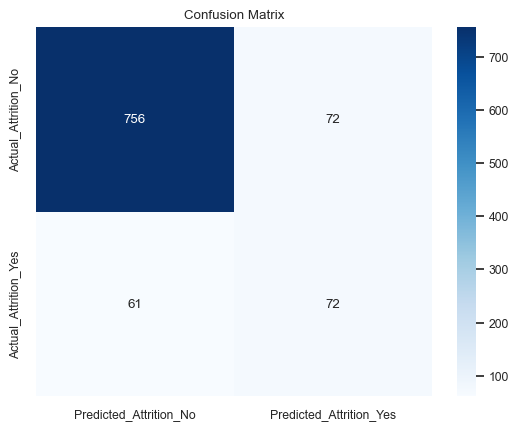

In [120]:
# Confusion Matrix of the best model
logit_cm = final_cm["logit"]

# heatmap
sns.heatmap(logit_cm, annot=True, fmt='d', cmap='Blues', cbar=True, 
            xticklabels=['Predicted_Attrition_No', 'Predicted_Attrition_Yes'], 
            yticklabels=['Actual_Attrition_No', 'Actual_Attrition_Yes'])
plt.title('Confusion Matrix')
plt.show()

In [121]:
# Confusion matrix of all models
final_cm

{'LGBM': array([[746,  82],
        [ 56,  77]], dtype=int64),
 'logit': array([[756,  72],
        [ 61,  72]], dtype=int64),
 'XGB': array([[762,  66],
        [ 60,  73]], dtype=int64),
 'AdaBoost': array([[760,  68],
        [ 70,  63]], dtype=int64),
 'RF': array([[769,  59],
        [ 67,  66]], dtype=int64),
 'MLP': array([[728, 100],
        [ 60,  73]], dtype=int64),
 'lda': array([[738,  90],
        [ 63,  70]], dtype=int64),
 'SVM': array([[756,  72],
        [ 59,  74]], dtype=int64)}

### 3.2.3.4. Feature Importance

In [122]:
logit_coef = best_coef["logit"]
logit_coef_df = pd.DataFrame(index=list(X_RnD_final.columns), data=list(logit_coef[0])).sort_values(ascending = False, by =0).reset_index()
logit_coef_df.columns = ["Variable", "Coef_logit"]

LGBM_coef = best_coef["LGBM"]
LGBM_coef_df = pd.DataFrame(index=list(X_RnD_final.columns), data=list(LGBM_coef)).sort_values(ascending = False, by =0).reset_index()
LGBM_coef_df.columns = ["Variable", "Coef_LGBM"]

pd.merge(logit_coef_df, LGBM_coef_df, on="Variable", how = "inner")

,Variable,Coef_logit,Coef_LGBM
0,OverTime_Yes,0.711534,221
1,JobRole_Laboratory Technician,0.414340,135
2,EducationField_Technical Degree,0.347567,55
3,BusinessTravel_Travel_Frequently,0.327779,71
4,EducationField_Medical,0.169566,0
5,YearsSinceLastPromotion,0.134584,0
6,NumCompaniesWorked,0.112408,1
7,OverTime_No,0.103030,0
8,DistanceFromHome,0.100325,9
9,Education,-0.024032,1


<Figure size 1000x600 with 0 Axes>

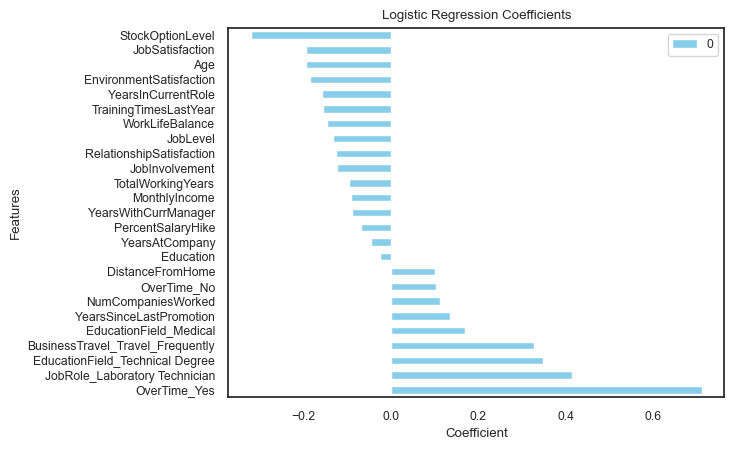

In [123]:
logit_coef_df_viz = pd.DataFrame(index=list(X_RnD_final.columns), data=list(logit_coef[0])).sort_values(ascending = False, by =0)

plt.figure(figsize=(10, 6))
logit_coef_df_viz.plot(kind="barh", color="skyblue")
plt.xlabel("Coefficient")
plt.ylabel("Features")
plt.title("Logistic Regression Coefficients")
plt.show()

In [124]:
# Top 5 important variables from logit
logit_abs = logit_coef_df["Coef_logit"].abs() # absolute coef
logit_abs_df = pd.DataFrame(data=[logit_coef_df["Variable"], logit_abs]).T.sort_values(by="Coef_logit", ascending=False)
logit_abs_df["Coef_logit"]=logit_abs_df["Coef_logit"].astype("float")
top5_coef_logit = logit_abs_df.nlargest(5, "Coef_logit").reset_index(drop=True)

print(f'Top 5 variables that might have affected to Attrition in R&D Dept. are {list(top5_coef_logit["Variable"])} in order.')
top5_coef_logit

Top 5 variables that might have affected to Attrition in R&D Dept. are ['OverTime_Yes', 'JobRole_Laboratory Technician', 'EducationField_Technical Degree', 'BusinessTravel_Travel_Frequently', 'StockOptionLevel'] in order.


,Variable,Coef_logit
0,OverTime_Yes,0.711534
1,JobRole_Laboratory Technician,0.414340
2,EducationField_Technical Degree,0.347567
3,BusinessTravel_Travel_Frequently,0.327779
4,StockOptionLevel,0.320191


In [125]:
# Top 5 important variables from LGBM
LGBM_abs = LGBM_coef_df["Coef_LGBM"].abs() # absolute coef
LGBM_abs_df = pd.DataFrame(data=[LGBM_coef_df["Variable"], LGBM_abs]).T.sort_values(by="Coef_LGBM", ascending=False)
LGBM_abs_df["Coef_LGBM"]=LGBM_abs_df["Coef_LGBM"].astype("float")
top5_coef_LGBM = LGBM_abs_df.nlargest(5, "Coef_LGBM").reset_index(drop=True)

print(f'Top 5 variables that might have affected to Attrition in R&D Dept. are {list(top5_coef_LGBM["Variable"])} in order.')
top5_coef_LGBM

Top 5 variables that might have affected to Attrition in R&D Dept. are ['OverTime_Yes', 'JobRole_Laboratory Technician', 'StockOptionLevel', 'JobSatisfaction', 'JobLevel'] in order.


,Variable,Coef_LGBM
0,OverTime_Yes,221.0
1,JobRole_Laboratory Technician,135.0
2,StockOptionLevel,127.0
3,JobSatisfaction,91.0
4,JobLevel,73.0


### 3.2.3.5. Best Model vs Others Comparison

In [126]:
print(f'T-Test result w/ {"SVM"} : {ttest_ind(f1["logit"], f1["SVM"])}')
print(f'T-Test result w/ {"XGB"} : {ttest_ind(f1["logit"], f1["XGB"])}')
print(f'T-Test result w/ {"RF"} : {ttest_ind(f1["logit"], f1["RF"])}')
print(f'T-Test result w/ {"MLP"} : {ttest_ind(f1["logit"], f1["MLP"])}')
print(f'T-Test result w/ {"LGBM"} : {ttest_ind(f1["logit"], f1["LGBM"])}')
print(f'T-Test result w/ {"lda"} : {ttest_ind(f1["logit"], f1["lda"])}')
print(f'T-Test result w/ {"AdaBoost"} : {ttest_ind(f1["logit"], f1["AdaBoost"])}',"\n")

print(f'W-Test result w/ {"SVM"} : {wilcoxon(f1["logit"], f1["SVM"])}')
print(f'W-Test result w/ {"XGB"} : {wilcoxon(f1["logit"], f1["XGB"])}')
print(f'W-Test result w/ {"RF"} : {wilcoxon(f1["logit"], f1["RF"])}')
print(f'W-Test result w/ {"MLP"} : {wilcoxon(f1["logit"], f1["MLP"])}')
print(f'W-Test result w/ {"LGBM"} : {wilcoxon(f1["logit"], f1["LGBM"])}')
print(f'W-Test result w/ {"lda"} : {wilcoxon(f1["logit"], f1["lda"])}')
print(f'W-Test result w/ {"AdaBoost"} : {wilcoxon(f1["logit"], f1["AdaBoost"])}')


T-Test result w/ SVM : TtestResult(statistic=0.3660710886292784, pvalue=0.7151010947076634, df=98.0)
T-Test result w/ XGB : TtestResult(statistic=2.1627395305404202, pvalue=0.03299411188654442, df=98.0)
T-Test result w/ RF : TtestResult(statistic=0.993794493443087, pvalue=0.32277040321505235, df=98.0)
T-Test result w/ MLP : TtestResult(statistic=4.020366617591725, pvalue=0.00011422007032597839, df=98.0)
T-Test result w/ LGBM : TtestResult(statistic=0.304147848375347, pvalue=0.7616601262818521, df=98.0)
T-Test result w/ lda : TtestResult(statistic=2.6755840223216225, pvalue=0.008743902432031218, df=98.0)
T-Test result w/ AdaBoost : TtestResult(statistic=2.838986479626653, pvalue=0.005502617425228639, df=98.0) 

W-Test result w/ SVM : WilcoxonResult(statistic=459.0, pvalue=0.26651383210414115)
W-Test result w/ XGB : WilcoxonResult(statistic=360.5, pvalue=0.01962824372936652)
W-Test result w/ RF : WilcoxonResult(statistic=476.0, pvalue=0.17452534056858326)
W-Test result w/ MLP : WilcoxonR

C:\Users\taewu\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


## 3.3. HR Department Analysis

### 3.3.1. Exploratory Data Analysis (HR)

### 3.3.1.1. Distribution

# of Attrition in HR Department : 12
# of Non-Attrition in HR Department : 51


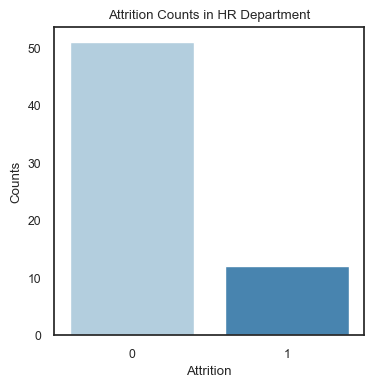

In [127]:
# Department set up 
data_HR = data.loc[data["Department"]=="Human Resources",]
X_HR = data_HR.drop(columns = ["Attrition", "Department"])
y_HR = data_HR["Attrition"]

data_HR = data_HR.drop(columns=["Department"])

# Attrition count plot
HR_attriton = y_HR.value_counts()
print(f'# of Attrition in HR Department : {HR_attriton[1]}')
print(f'# of Non-Attrition in HR Department : {HR_attriton[0]}')
plt.figure(figsize=(4, 4))
sns.countplot(data=data_HR, x="Attrition", palette="Blues")
plt.title("Attrition Counts in HR Department")
plt.xlabel("Attrition")
plt.ylabel("Counts")
plt.xticks(rotation=0)
plt.show()

# The data is imbalanced.

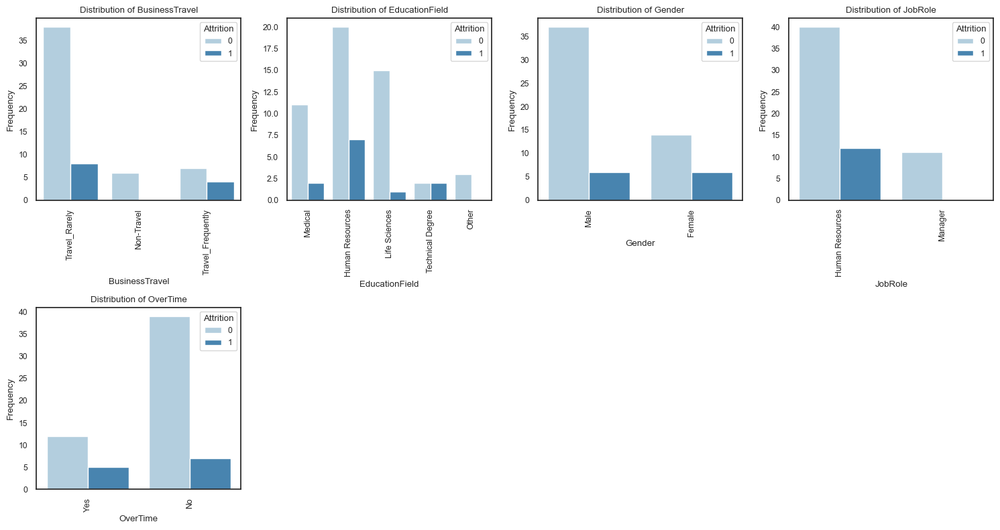

In [128]:
# Categorical variables count plot

# set up the categorical columns
cate_cols = X_HR.select_dtypes(include=['object']).columns

# counter plot for categorical variables
sns.set(font_scale=0.8)
sns.set_style("white")

# calculate the number of rows/columns needed for subplots
n_rows = int(np.ceil(len(cate_cols) / 4)) 

plt.figure(figsize=(15, n_rows * 4))  # Dynamic figure size

for i, col in enumerate(cate_cols, 1): 
    plt.subplot(n_rows, 4, i)  
    sns.countplot(x=cate_cols[i-1], data=X_HR, palette='Blues', hue=y_HR)
    plt.title(f"Distribution of {col}")
    plt.xlabel(f"{col}")
    plt.ylabel('Frequency')
    plt.tick_params(axis='x', rotation=90)

plt.tight_layout() 
plt.show()

In [129]:
# Travel_Frequently seems to influence on Attrition a lot. 
# People with Technical Degree/HR majors are more likely to leave the work
# Female is more prone to leave the work
# No Manager shows attrition
# OverTime also seems to affect to Attrition

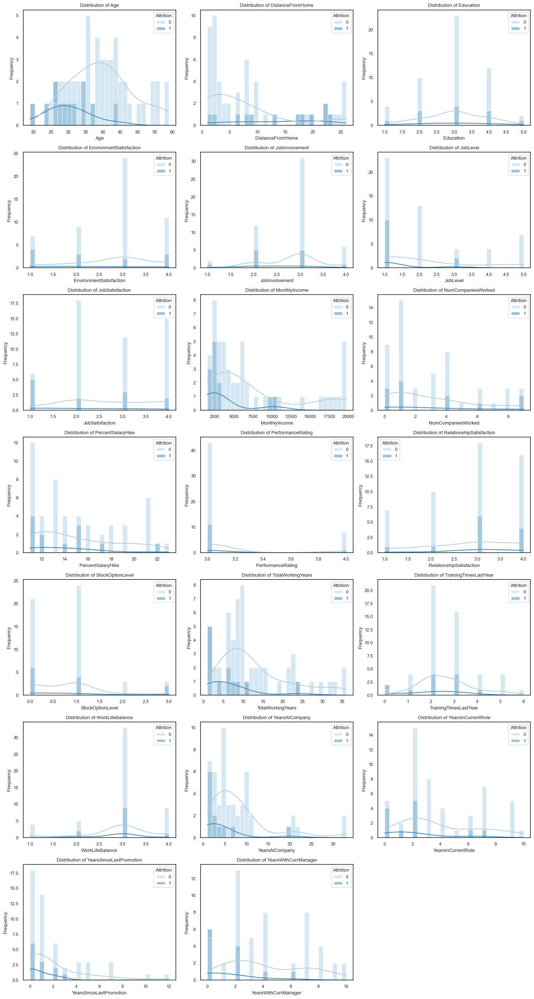

In [130]:
# Numerical variables distribution

# set up the numerical columns
numeric_cols = X_HR.select_dtypes(include=['int64', 'float64']).columns

# calculate the number of rows/columns needed for subplots
n_rows = int(np.ceil(len(numeric_cols) / 3))  

plt.figure(figsize=(15, n_rows * 4)) 

for i, col in enumerate(numeric_cols, 1): 
    plt.subplot(n_rows, 3, i)  
    sns.histplot(data=X_HR, x=col, bins=30, palette='Blues', hue=y_HR, kde=True) 
    plt.title(f"Distribution of {col}")
    plt.xlabel(f"{col}")
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [131]:
# Young generation seem to be more likely to leave the work 
# More DistanceFromHome, more Attrition
# lower Job level (associated with lower monthly income) also might be a contributing factor 
# Lower level of JobSatisfaction affects to Attrition
# Lower PercentSalaryHike, more Attrition
# More RelationshipSatisfaction, more Attrition
# As like Other Depts, Stock option could be also a trigger
# As like Other Depts, People without any work experience tend to leave the work easier
# As like Sales Dept, almost half of total working year 0 left the company (Need to be cared more)
# All year related variables has similar patterns

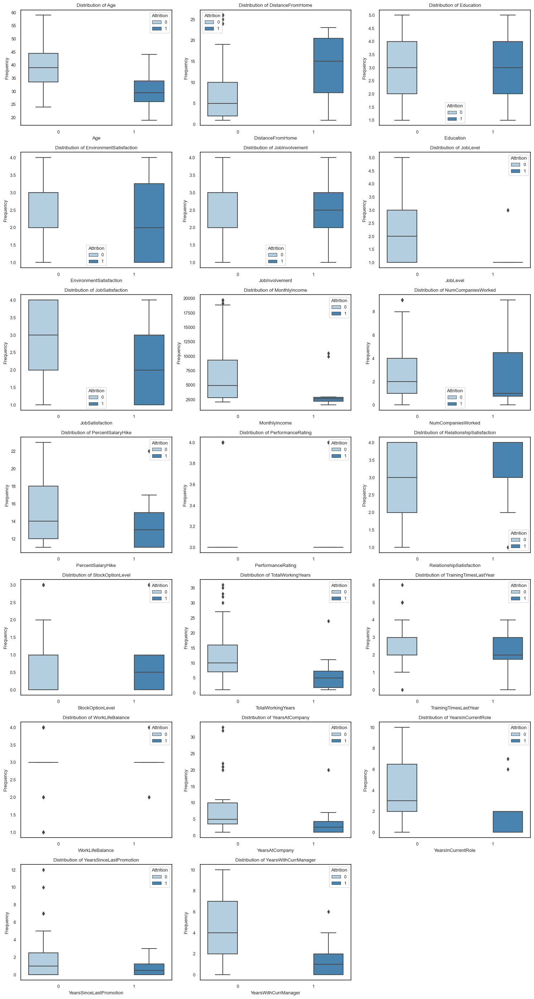

In [132]:
# Numerical variables distribution

# set up the numerical columns
numeric_cols = X_HR.select_dtypes(include=['int64', 'float64']).columns

# calculate the number of rows/columns needed for subplots
n_rows = int(np.ceil(len(numeric_cols) / 3))  

plt.figure(figsize=(15, n_rows * 4)) 

for i, col in enumerate(numeric_cols, 1): 
    plt.subplot(n_rows, 3, i)  
    sns.boxplot(x = "Attrition", y = col, data=data_HR, palette='Blues', hue=y_HR)
    plt.title(f"Distribution of {col}")
    plt.xlabel(f"{col}")
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [133]:
# box plot results are similar to what we have analyzed from distribution

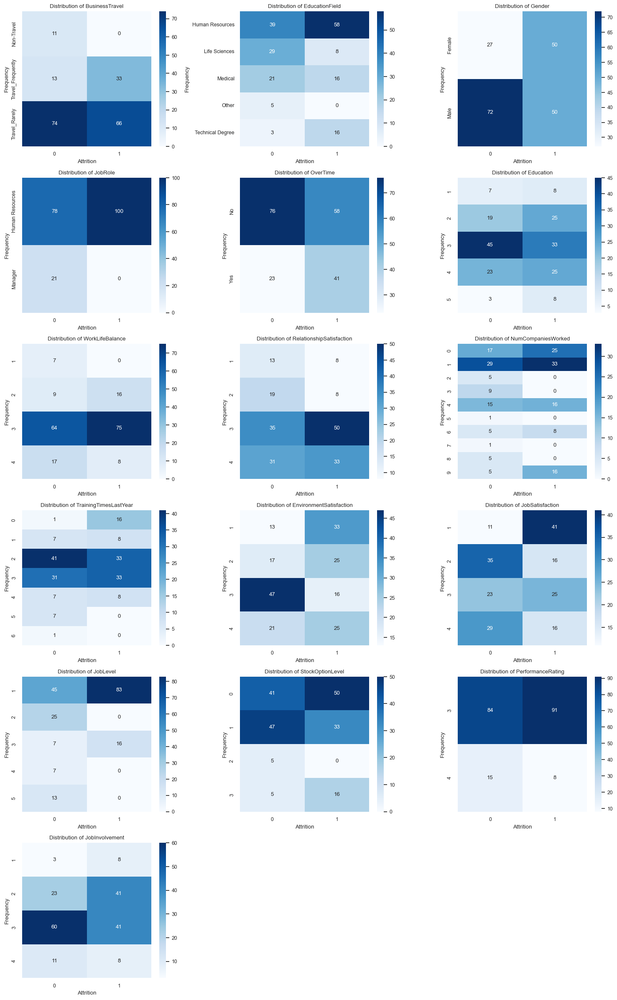

In [134]:
# Heatmap check for categorical col + numerical col(categorical order)

# set up the numerical columns that contain increasing order categories and combine them with categorical columns
numeric_cate_cols = list(set(numeric_cols) - set(["Age", "DistanceFromHome", "MonthlyIncome", "PercentSalaryHike", "TotalWorkingYears",
                                         "YearsAtCompany", "YearsInCurrentRole", "YearsSinceLastPromotion", 
                                          "YearsWithCurrManager"]))
cate_numerical_cate_col = list(cate_cols) + numeric_cate_cols

# calculate the number of rows/columns needed for subplots
n_rows = int(np.ceil(len(cate_numerical_cate_col) / 3))  

plt.figure(figsize=(15, n_rows * 4)) 

for i, col in enumerate(cate_numerical_cate_col, 1): 
    # percentage of each category in each variable
    grouped_data = data_HR.groupby([col, 'Attrition']).size().unstack()
    row_sums = grouped_data.sum(axis=0)
    grouped_data_percentage = (grouped_data.div(row_sums, axis=1).fillna(0) * 100).astype(int) # fillna applid for nan value
    plt.subplot(n_rows, 3, i)  
    sns.heatmap(grouped_data_percentage, cmap="Blues", annot=True, fmt="d")
    plt.title(f"Distribution of {col}")
    plt.xlabel("Attrition")
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [135]:
# Business Travel affect somewhat 
# Tech and HR degree seem to be more likely to leave the work
# Female tends to be more prone to Attrition
# Human Resources Job Role has much higher attrition proportion
# Overtime is a contributing factor
# Somehow higher RelationshipSastisfaction, higher Attrition
# JobSatisfaction seems to be highly affecting to Attrition
# Stock seems to be a influencing factor but not as much as other Dept.
# low Joblevel higher attrition
# EnvironmentSatisfaction appears to be trigger as well
# Numcompanywork affects a bit 

In [136]:
# Variable range adjustment(similar to Sales dept)
# certain categories within the variables occupy significantly smaller proportions compared to others.
# it might be beneficial to combine these less represented categories within each variable to avoid the overfitting issue.

data_HR = data_HR.copy() 
data_HR["TrainingTimesLastYear"] = data_HR["TrainingTimesLastYear"].apply(lambda x : x if x <=3 else 4)
data_HR["JobLevel"] = data_HR["JobLevel"].apply(lambda x : 4 if x ==5 else x)

### 3.3.1.2. Outlier Check

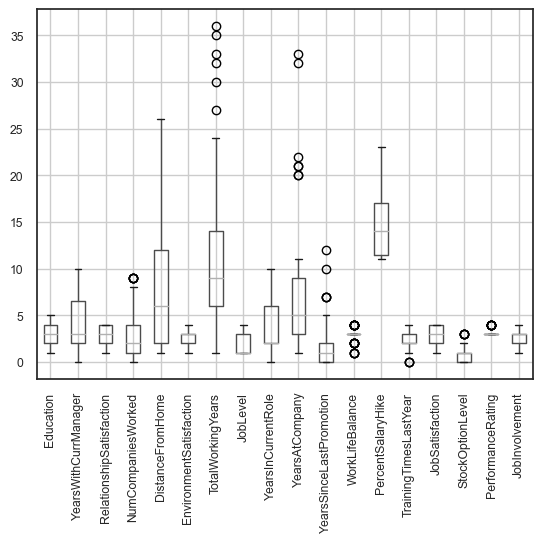

<Figure size 640x480 with 0 Axes>

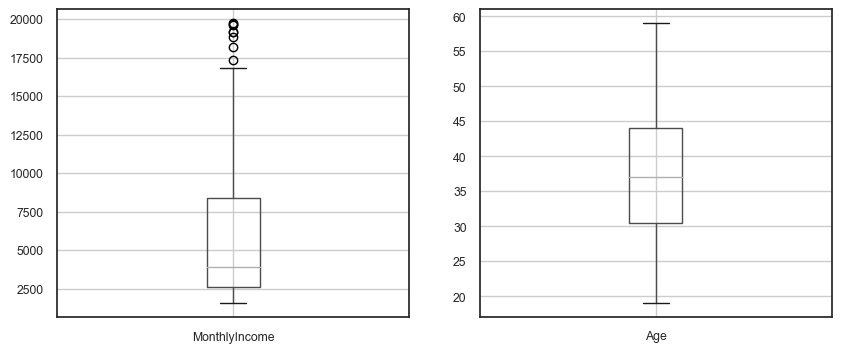

In [137]:
# outlier check for numerical variables

data_HR.boxplot(column=list(set(numeric_cols) - {"MonthlyIncome", "Age"}), rot = 90) 
plt.figure()
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
pd.DataFrame(data_HR["MonthlyIncome"]).boxplot(column="MonthlyIncome", ax=ax[0])
pd.DataFrame(data_HR["Age"]).boxplot(column="Age", ax=ax[1])
plt.show()

In [138]:
# Potential outliers transformed to the max value in each variable
outlier_group_list = ["StockOptionLevel", "TotalWorkingYears", "YearsAtCompany", "MonthlyIncome", 
                      "YearsSinceLastPromotion", "NumCompaniesWorked", "TrainingTimesLastYear"]

# Here, PerformanceRating only contains 2 categories. Therefore, outliers in PerformanceRating are not removed.
# Same reason applied for WorkLifeBalance

for i in outlier_group_list :
    q1 = np.percentile(data_HR[i],25)
    q3 = np.percentile(data_HR[i],75)
    iqr = q3-q1
    upper_bound = q3 + 1.5 * iqr
    lower_bound = q1 - 1.5 * iqr
    data_HR.loc[data_HR[i] > upper_bound, i] = upper_bound
    data_HR.loc[data_HR[i] < lower_bound, i] = lower_bound

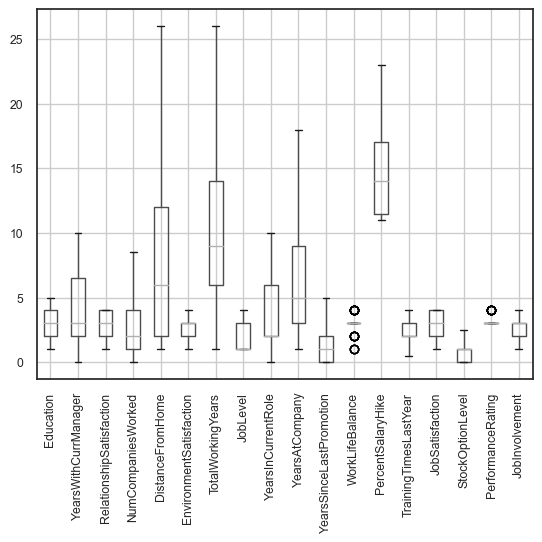

<Figure size 640x480 with 0 Axes>

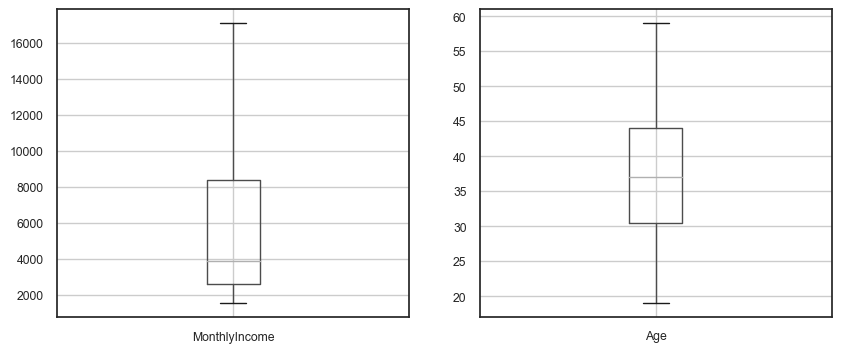

In [139]:
# Boxplot check again
data_HR.boxplot(column=list(set(numeric_cols) - {"MonthlyIncome", "Age"}), rot = 90) 
plt.figure()
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
pd.DataFrame(data_HR["MonthlyIncome"]).boxplot(column="MonthlyIncome", ax=ax[0])
pd.DataFrame(data_HR["Age"]).boxplot(column="Age", ax=ax[1])
plt.show()

### 3.3.1.3. Correlation

In [140]:
data_HR.info()

<class 'pandas.core.frame.DataFrame'>
Index: 63 entries, 79 to 1450
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       63 non-null     int64  
 1   Attrition                 63 non-null     int64  
 2   BusinessTravel            63 non-null     object 
 3   DistanceFromHome          63 non-null     int64  
 4   Education                 63 non-null     int64  
 5   EducationField            63 non-null     object 
 6   EnvironmentSatisfaction   63 non-null     int64  
 7   Gender                    63 non-null     object 
 8   JobInvolvement            63 non-null     int64  
 9   JobLevel                  63 non-null     int64  
 10  JobRole                   63 non-null     object 
 11  JobSatisfaction           63 non-null     int64  
 12  MonthlyIncome             63 non-null     float64
 13  NumCompaniesWorked        63 non-null     float64
 14  OverTime      

<Axes: >

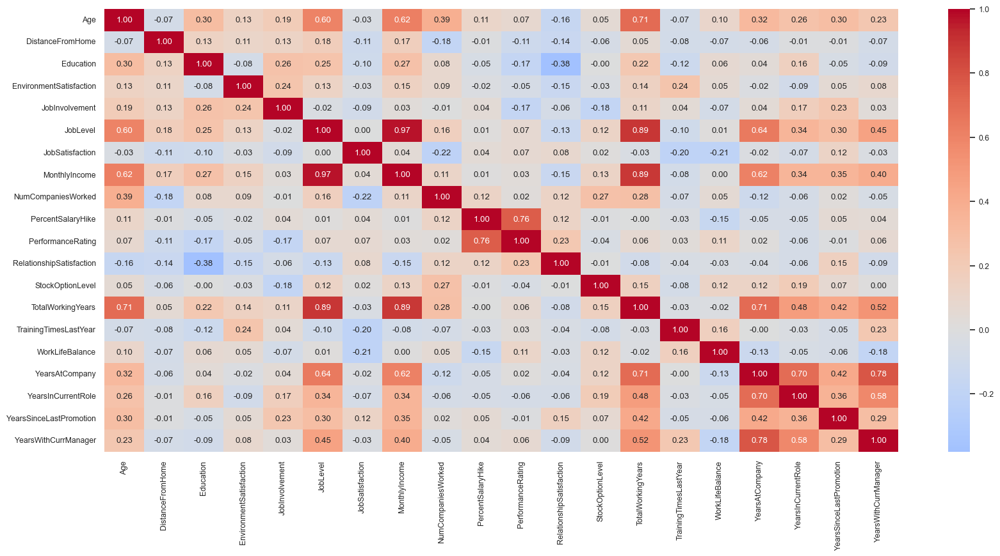

In [141]:
# re-define data after outlier adjustment, and create dummy variables for categorical variables
X_HR = data_HR.drop(columns = ["Attrition"])
data_HR = pd.concat([pd.DataFrame(y_HR), pd.get_dummies(X_HR)], axis=1) # dummy creation
X_HR = data_HR.drop(columns = ["Attrition"])

# correlation among numerical variables
corr_df = X_HR[numeric_cols].corr() 
corr_df_x = corr_df.sort_index().sort_index(axis=1) 
plt.figure(figsize=(20,9))
sns.heatmap(corr_df_x, annot=True, fmt=".2f", cmap="coolwarm", center=0) 

# Joblevel, MonthlyIncome seems to be correlated 

<Axes: >

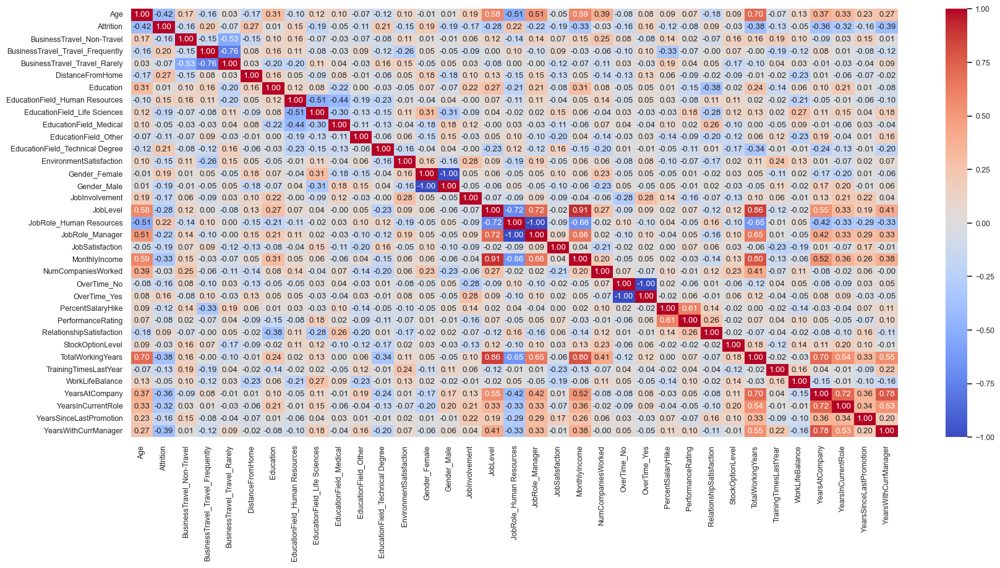

In [142]:
# correlations among all variables, using spearman
corr_df1 = data_HR.corr(method="spearman")
corr_df_x1 = corr_df1.sort_index().sort_index(axis=1) 
plt.figure(figsize=(20,9))
sns.heatmap(corr_df_x1, annot=True, fmt=".2f", cmap="coolwarm", center=0) 

# No significant correlation exists, even with the target variable

In [143]:
# R result
# table is VIF result in R. As we had a categorical variable, GVIF^(1/(2*Df)) can be considered this time,
# and 3.16 is equivalent to VIF 10 approximately. Therefore, we can assume that there is potential multicollinearity issue 
# when using all predictor variables.(MonthlyIncome, JobLevel, JobRole, MonthlyIncome, TotalWorkingYears, YearsAtCompany)

# > vif(model)
#                               GVIF Df GVIF^(1/(2*Df))
# Age                       3.046399  1        1.745394
# BusinessTravel            2.460624  2        1.252453
# DistanceFromHome          2.016514  1        1.420040
# Education                 2.049866  1        1.431735
# EducationField            8.344907  4        1.303700
# EnvironmentSatisfaction   1.534444  1        1.238727
# Gender                    2.076510  1        1.441010
# JobInvolvement            2.139608  1        1.462740
# JobLevel                 50.627545  1        7.115304
# JobRole                  10.977992  1        3.313305
# JobSatisfaction           1.656485  1        1.287045
# MonthlyIncome            69.765914  1        8.352599
# NumCompaniesWorked        4.336260  1        2.082369
# OverTime                  1.379279  1        1.174427
# PercentSalaryHike         5.607418  1        2.367999
# PerformanceRating         5.469670  1        2.338732
# RelationshipSatisfaction  1.893823  1        1.376162
# StockOptionLevel          1.632842  1        1.277827
# TotalWorkingYears        17.240551  1        4.152174
# TrainingTimesLastYear     1.627337  1        1.275671
# WorkLifeBalance           2.046973  1        1.430725
# YearsAtCompany           11.300026  1        3.361551
# YearsInCurrentRole        3.029324  1        1.740495
# YearsSinceLastPromotion   1.916766  1        1.384473
# YearsWithCurrManager      5.111063  1        2.260766

### 3.3.1.4. PCA, ISOMAP Plot for R&D Department

LinearRegression score : 0.7899 

Cumulative explained variance of 2 PCs (HR Dept.) : 0.3239


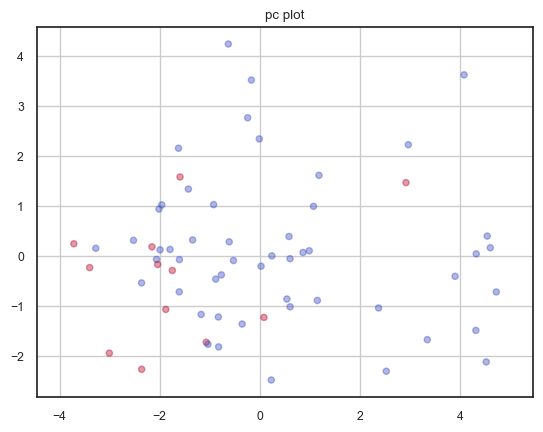

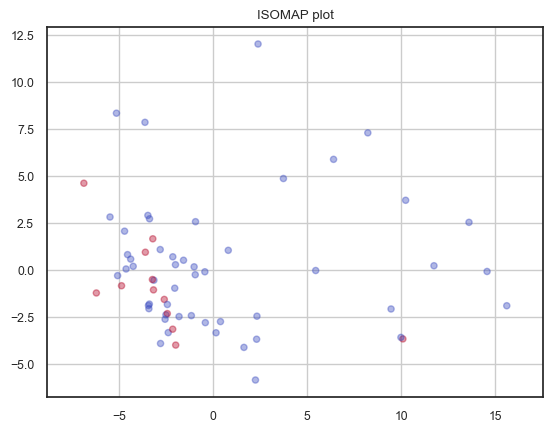

In [144]:
# Check the linearity
X_train, X_test, y_train, y_test = train_test_split(X_HR, y_HR, train_size = 0.7, test_size=0.3, random_state=42)

X_train[numeric_cols] = StandardScaler().fit(X_train[numeric_cols]).transform(X_train[numeric_cols]) 
X_test[numeric_cols] = StandardScaler().fit(X_test[numeric_cols]).transform(X_test[numeric_cols])

linear = LinearRegression()
linear.fit(X_train, y_train)
print(f'LinearRegression score : {round(linear.score(X_train, y_train),4)}', "\n") # linear


# PCA
X_HR_pca = X_HR.copy()
X_HR_pca[numeric_cols] = StandardScaler().fit(X_HR_pca[numeric_cols]).transform(X_HR_pca[numeric_cols]) 

pca = PCA(n_components =2).fit(X_HR_pca)
pc = pca.transform(X_HR_pca)
print(f'Cumulative explained variance of 2 PCs (HR Dept.) : {round(sum(pca.explained_variance_ratio_),4)}') 

plt.figure()
plt.scatter(pc[:,0], pc[:,1], s=20, c=y_HR, alpha = 0.4, cmap = "coolwarm")
plt.axis('equal')
plt.grid()
plt.title('pc plot')
plt.show() 

# ISOMAP
isomap = Isomap(n_components=2, n_neighbors=5)
X_reduced = isomap.fit_transform(X_HR_pca)

plt.figure()
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], s=20, c=y_HR, alpha = 0.4, cmap = "coolwarm")
plt.axis('equal')
plt.grid()
plt.title('ISOMAP plot')
plt.show() 

In [145]:
print(f'The # of variables including dummy variables is : {len(X_HR.columns)}')

numerical_cols = X_HR.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = X_HR.select_dtypes(include=['bool']).columns
list(X_HR.columns)

The # of variables including dummy variables is : 34


['Age',
 'DistanceFromHome',
 'Education',
 'EnvironmentSatisfaction',
 'JobInvolvement',
 'JobLevel',
 'JobSatisfaction',
 'MonthlyIncome',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager',
 'BusinessTravel_Non-Travel',
 'BusinessTravel_Travel_Frequently',
 'BusinessTravel_Travel_Rarely',
 'EducationField_Human Resources',
 'EducationField_Life Sciences',
 'EducationField_Medical',
 'EducationField_Other',
 'EducationField_Technical Degree',
 'Gender_Female',
 'Gender_Male',
 'JobRole_Human Resources',
 'JobRole_Manager',
 'OverTime_No',
 'OverTime_Yes']

### 3.3.2. Feature Selection

In [146]:
# modeling function
def modeling(model, X_train, X_test, y_train, y_test):
    model.fit(X_train,y_train)
    ypred = model.predict(X_test)
    return metrics(y_test, ypred)
    
# performance metrics function
def metrics(y_test, ypred):
    accuracy = accuracy_score(y_test,ypred)
    precision = precision_score(y_test,ypred)
    recall = recall_score(y_test,ypred)
    f1 = f1_score(y_test,ypred)
    roc_score = roc_auc_score(y_test,ypred,average='macro')
    result = {'accuracy': accuracy, 'precision': precision, 'recall': recall, 'f1': f1, 'roc_auc' : roc_score}
    return result

# define startified Kfold for CV later
stratified_kfold = StratifiedKFold(n_splits=10,
                                       shuffle=True,
                                       random_state=42)

### 3.3.2.1. LASSO

Best model searched for Lasso:
alpha = 0.056455725101871815
intercept = 0.19047619047619047
betas = [-0.08754267  0.04243398  0.         -0.         -0.         -0.
 -0.0218398  -0.          0.         -0.         -0.          0.
  0.         -0.         -0.00036114 -0.         -0.         -0.
 -0.         -0.06300788 -0.          0.         -0.          0.
 -0.         -0.         -0.          0.          0.         -0.
  0.         -0.         -0.          0.        ], 


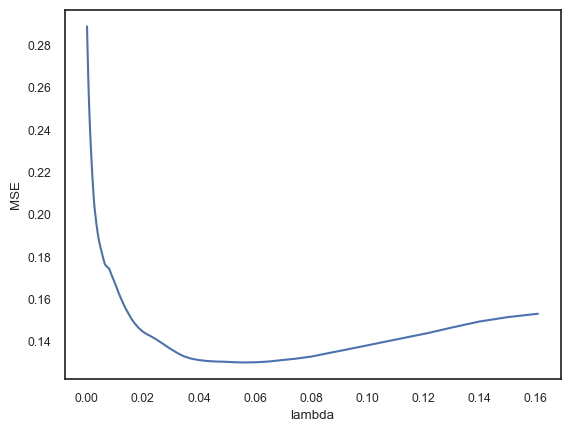

LASSO CV MSE best result : lambda = 0.056455725101871815, MSE = 0.13017140205625283


,variable,coef
0,Age,-0.087543
1,DistanceFromHome,0.042434
2,Education,0.000000
3,EnvironmentSatisfaction,-0.000000
4,JobInvolvement,-0.000000
5,JobLevel,-0.000000
6,JobSatisfaction,-0.021840
7,MonthlyIncome,-0.000000
8,NumCompaniesWorked,0.000000
9,PercentSalaryHike,-0.000000


In [147]:
lasso_model = LassoCV(cv = stratified_kfold, random_state=42, max_iter=10000) 

X_HR_lasso = X_HR.copy() 

# Scale the data before LASSO
X_HR_lasso[numeric_cols] = StandardScaler().fit(X_HR_lasso[numeric_cols]).transform(X_HR_lasso[numeric_cols]) 

# LASSO : find the optimal parameter lambda
lasso_model.fit(X_HR_lasso, y_HR)

print("Best model searched for Lasso:\nalpha = {}\nintercept = {}\nbetas = {}, ".format(lasso_model.alpha_,
                                                                            lasso_model.intercept_,
                                                                            lasso_model.coef_
                                                                            ))
# LASSO CV MSE check
lasso_cv_min_mse_idx = np.argmin(np.mean(lasso_model.mse_path_,axis=1))
lasso_cv_mse = np.mean(lasso_model.mse_path_,axis=1)
plt.figure()
plt.plot(lasso_model.alphas_, lasso_cv_mse)
plt.xlabel("lambda")
plt.ylabel("MSE")
plt.show()
print(f'LASSO CV MSE best result : lambda = {lasso_model.alpha_}, MSE = {lasso_cv_mse[lasso_cv_min_mse_idx]}')


# LASSO : optimal parameter lambda fitting to the model
lasso_opt_model = Lasso(alpha=lasso_model.alpha_)
lasso_opt_model.fit(X_HR_lasso, y_HR) 

lasso_coef_df = pd.DataFrame({"variable" :list(X_HR_lasso.columns), "coef":lasso_opt_model.coef_,})
lasso_coef_df

In [148]:
# Non-selected variables
non_selected_var_lasso = list(lasso_coef_df[lasso_coef_df["coef"]==0]["variable"].values)
print(f'The {len(non_selected_var_lasso)} non-selected variables from LASSO : {non_selected_var_lasso}')

The 29 non-selected variables from LASSO : ['Education', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel', 'MonthlyIncome', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'BusinessTravel_Non-Travel', 'BusinessTravel_Travel_Frequently', 'BusinessTravel_Travel_Rarely', 'EducationField_Human Resources', 'EducationField_Life Sciences', 'EducationField_Medical', 'EducationField_Other', 'EducationField_Technical Degree', 'Gender_Female', 'Gender_Male', 'JobRole_Human Resources', 'JobRole_Manager', 'OverTime_No', 'OverTime_Yes']


In [149]:
# Selected variables
selected_var_lasso =list(X_HR_lasso.drop(columns=non_selected_var_lasso).columns)

print(f'The {len(selected_var_lasso)} selected variables from LASSO : {list(selected_var_lasso)}')

The 5 selected variables from LASSO : ['Age', 'DistanceFromHome', 'JobSatisfaction', 'TrainingTimesLastYear', 'YearsWithCurrManager']


In [150]:
# Selected variables applied to Logistic model
X_HR_lasso_opt = X_HR_lasso.drop(columns=non_selected_var_lasso) 
X_HR_lasso_numeric_cols = X_HR_lasso_opt.select_dtypes(include=['int64', 'float64']).columns

# LASSO
lasso_result = {'accuracy': 0, 'precision': 0, 'recall': 0, 'f1': 0, 'roc_auc' : 0}

np.random.seed(42)

# Test on Logistic regression with 50 different split
for c in range(50) : # stratify applied as the data is relatively small
    X_train, X_test, y_train, y_test = train_test_split(X_HR_lasso_opt, y_HR, train_size = 0.7, test_size=0.3, stratify= y_HR)

    X_train[X_HR_lasso_numeric_cols] = StandardScaler().fit(X_train[X_HR_lasso_numeric_cols]).\
    transform(X_train[X_HR_lasso_numeric_cols]) 
    X_test[X_HR_lasso_numeric_cols] = StandardScaler().fit(X_test[X_HR_lasso_numeric_cols]).\
    transform(X_test[X_HR_lasso_numeric_cols]) 
        
    logit = LogisticRegression()
    lasso_metrics = modeling(logit, X_train, X_test, y_train, y_test)
    for metric, score in lasso_metrics.items() :
        lasso_result[metric] += score

print("Logistic Regression (cv=50) result, using selected variables from LASSO :")
{key: value / 50 for key, value in lasso_result.items()}

Logistic Regression (cv=50) result, using selected variables from LASSO :


{'accuracy': 0.8768421052631575,
 'precision': 0.8586666666666667,
 'recall': 0.52,
 'f1': 0.6270476190476192,
 'roc_auc': 0.746}

### 3.3.2.2. SelectKbest (Mutual Information, Chi-Squared, ANOVA)

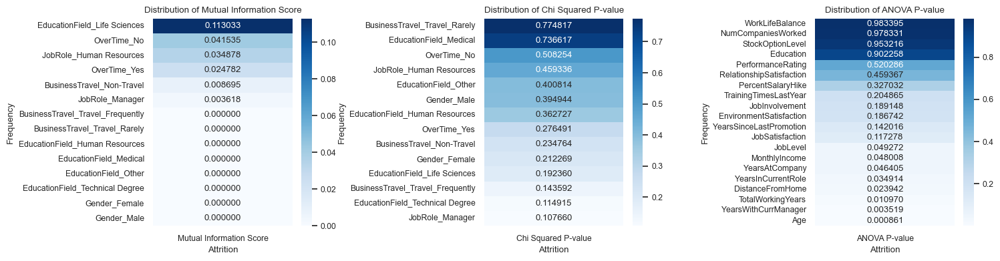

In [151]:
np.random.seed(42)

# filter categorical variables (Mutual Information)
kbest_MI = SelectKBest(score_func = mutual_info_classif, k = 'all')
# kbest_MI_fit = kbest_MI.fit(X_train_smt[categorical_cols], y_train_smt)
kbest_MI_fit = kbest_MI.fit(X_HR[categorical_cols], y_HR) 

kbest_MI_result = pd.DataFrame(data = kbest_MI_fit.scores_, index = list(X_HR[categorical_cols].columns), 
                             columns = ['Mutual Information Score']).sort_values(by = "Mutual Information Score", 
                                                                                 ascending=False)  # MI gives only score

# filter categorical variables (Chi Squared)
kbest_chi = SelectKBest(score_func = chi2, k = 'all')
# kbest_chi_fit = kbest_chi.fit(X_train_smt[categorical_cols], y_train_smt)
kbest_chi_fit = kbest_chi.fit(X_HR[categorical_cols], y_HR)


kbest_chi_result = pd.DataFrame(data = kbest_chi_fit.pvalues_, index = list(X_HR[categorical_cols].columns), 
                             columns = ['Chi Squared P-value']).sort_values(by = "Chi Squared P-value", ascending=False) \
                                # Chi Sqaured p value 

# filter numerical variables (ANOVA)
kbest_anova = SelectKBest(score_func = f_classif, k = 'all')
# kbest_anova_fit = kbest_anova.fit(X_train_smt[numerical_cols], y_train_smt)

# numerical variables scaling
X_HR_anova = X_HR.copy()
X_HR_anova[numeric_cols] = StandardScaler().fit(X_HR_anova[numeric_cols]).transform(X_HR_anova[numeric_cols]) 

kbest_anova_fit = kbest_anova.fit(X_HR_anova[numerical_cols], y_HR)


kbest_anova_result = pd.DataFrame(data = kbest_anova_fit.pvalues_, index = list(X_HR_anova[numerical_cols].columns), 
                             columns = ['ANOVA P-value']).sort_values(by = "ANOVA P-value", ascending=False) 

kbest_results = [kbest_MI_result, kbest_chi_result, kbest_anova_result]

plt.figure(figsize=(15, 1 * 4)) 

for i, kbest in enumerate(kbest_results, 1): 
    plt.subplot(1, 3, i)  
    sns.heatmap(kbest, cmap="Blues", annot=True, fmt="f")
    plt.title(f"Distribution of {list(kbest.columns)[0]}")
    plt.xlabel("Attrition")
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [152]:
kbest_selected_categorical = kbest_chi_result[(kbest_chi_result <= 0.05).any(axis=1)].index 
kbest_selected_numerical = kbest_anova_result[(kbest_anova_result <= 0.05).any(axis=1)].index

kbest_selected_cols = list(kbest_selected_categorical) + list(kbest_selected_numerical)
print(f'The {len(kbest_selected_cols)} selected variables from SelectKbest : {kbest_selected_cols}', "\n")

kbest_nonselected_cols = list(set(X_HR.columns) - set(kbest_selected_cols))
print(f'The {len(kbest_nonselected_cols)} non-selected variables from SelectKbest : {kbest_nonselected_cols}')

The 8 selected variables from SelectKbest : ['JobLevel', 'MonthlyIncome', 'YearsAtCompany', 'YearsInCurrentRole', 'DistanceFromHome', 'TotalWorkingYears', 'YearsWithCurrManager', 'Age'] 

The 26 non-selected variables from SelectKbest : ['NumCompaniesWorked', 'JobRole_Human Resources', 'OverTime_No', 'EducationField_Other', 'EnvironmentSatisfaction', 'EducationField_Human Resources', 'EducationField_Life Sciences', 'EducationField_Medical', 'JobInvolvement', 'Education', 'JobRole_Manager', 'RelationshipSatisfaction', 'BusinessTravel_Non-Travel', 'YearsSinceLastPromotion', 'WorkLifeBalance', 'Gender_Female', 'PercentSalaryHike', 'Gender_Male', 'EducationField_Technical Degree', 'OverTime_Yes', 'TrainingTimesLastYear', 'JobSatisfaction', 'BusinessTravel_Travel_Rarely', 'StockOptionLevel', 'PerformanceRating', 'BusinessTravel_Travel_Frequently']


In [153]:
# Applying to Logistic Regression, using selected variables form Kbest
X_HR_kbest = X_HR[kbest_selected_cols]

# Kbest result
kbest_result = {'accuracy': 0, 'precision': 0, 'recall': 0, 'f1': 0, 'roc_auc' : 0}

np.random.seed(42)

# Test on Logistic regression with 50 different split
for c in range(50) :
    X_train, X_test, y_train, y_test = train_test_split(X_HR_kbest, y_HR, train_size = 0.7, test_size=0.3,  stratify= y_HR)

    X_train[kbest_selected_numerical] = StandardScaler().fit(X_train[kbest_selected_numerical]).\
    transform(X_train[kbest_selected_numerical]) 
    X_test[kbest_selected_numerical] = StandardScaler().fit(X_test[kbest_selected_numerical]).\
    transform(X_test[kbest_selected_numerical]) 
    
    logit = LogisticRegression()
    kbest_metrics = modeling(logit, X_train, X_test, y_train, y_test)
    for metric, score in kbest_metrics.items() :
        kbest_result[metric] += score

print("Logistic Regression (cv=50) result, using selected variables from Kbest :")
{key: value / 50 for key, value in kbest_result.items()}

C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Logistic Regression (cv=50) result, using selected variables from Kbest :


{'accuracy': 0.8452631578947369,
 'precision': 0.7699999999999999,
 'recall': 0.395,
 'f1': 0.4952380952380955,
 'roc_auc': 0.6801666666666663}

### 3.3.2.3. Tree-based Selection method

In [154]:
# Random Forest 
clf_result_num = {}

# check different number of the variables used
for i in range(len(X_HR.columns)) :
    clf = RandomForestClassifier(n_estimators=100)
    
    clf_fit = clf.fit(X_HR, y_HR) # no scaling needed for RF
    clf_features = pd.DataFrame(clf_fit.feature_importances_, index=list(X_HR.columns), 
                                columns=["features"]).sort_values(by="features", ascending=False)
    clf_selected_features = clf_features.head(i+1).index 
    X_HR_clf = X_HR[clf_selected_features] 
    X_HR_clf_numeric = X_HR_clf.select_dtypes(include=("int64", "float")).columns

    clf_result = []
    clf_coef = {}
    
    np.random.seed(42)
    
    # run CV with Logistic Regression for each different number of variables
    for c in range(50) :
        X_train, X_test, y_train, y_test = train_test_split(X_HR_clf, y_HR, train_size = 0.7, test_size=0.3, stratify=y_HR)

        X_train[X_HR_clf_numeric] = StandardScaler().fit(X_train[X_HR_clf_numeric]).transform(X_train[X_HR_clf_numeric])
        X_test[X_HR_clf_numeric] = StandardScaler().fit(X_test[X_HR_clf_numeric]).transform(X_test[X_HR_clf_numeric]) 
  
        logit = LogisticRegression()
        clf_fit = logit.fit(X_train, y_train).predict(X_test)
        clf_f1 = f1_score(y_test, clf_fit)
        clf_result.append(clf_f1)
        clf_coef[c]=clf.feature_importances_
    clf_result_num[i+1] = np.mean(clf_result)

print(clf_result_num)

{1: 0.03066666666666667, 2: 0.16666666666666663, 3: 0.3681904761904762, 4: 0.3781904761904762, 5: 0.3913333333333333, 6: 0.5229047619047619, 7: 0.5683809523809524, 8: 0.566857142857143, 9: 0.5940000000000001, 10: 0.5901904761904763, 11: 0.5510952380952382, 12: 0.5532698412698412, 13: 0.5194761904761904, 14: 0.5590952380952381, 15: 0.5351904761904761, 16: 0.5132857142857142, 17: 0.5304285714285714, 18: 0.5256666666666665, 19: 0.4879523809523809, 20: 0.4969047619047619, 21: 0.48619047619047623, 22: 0.4870952380952381, 23: 0.47385714285714287, 24: 0.4498888888888889, 25: 0.43607936507936507, 26: 0.4353650793650793, 27: 0.45579365079365075, 28: 0.4688095238095238, 29: 0.4358095238095238, 30: 0.4358095238095238, 31: 0.4469523809523809, 32: 0.446, 33: 0.45399999999999996, 34: 0.45399999999999996}


In [155]:
max_key = max(clf_result_num, key=clf_result_num.get)
max_value = clf_result_num[max_key]
max_key, max_value
print(f"Logistic Regression (cv=50) result, {max_key} variables with f1 score of {max_value} from Random Forest Classifier")

Logistic Regression (cv=50) result, 9 variables with f1 score of 0.5940000000000001 from Random Forest Classifier


In [156]:
clf = RandomForestClassifier(n_estimators=100)
clf_fit = clf.fit(X_HR, y_HR)
clf_features = pd.DataFrame(clf_fit.feature_importances_, index=list(X_HR.columns), 
                            columns=["features"]).sort_values(by="features", ascending=False)
clf_selected_features = list(clf_features.head(max_key).index)

print(f'The {len(clf_selected_features)} selected variables from Random Forest Classifier : {clf_selected_features}', "\n")
rf_nonselected_cols = list(set(X_RnD.columns) - set(X_RnD[clf_selected_features]))
print(f'The {len(rf_nonselected_cols)} non-selected variables from Random Forest Classifier : {rf_nonselected_cols}')

The 9 selected variables from Random Forest Classifier : ['TotalWorkingYears', 'Age', 'DistanceFromHome', 'MonthlyIncome', 'YearsAtCompany', 'JobSatisfaction', 'TrainingTimesLastYear', 'YearsInCurrentRole', 'YearsWithCurrManager'] 

The 28 non-selected variables from Random Forest Classifier : ['NumCompaniesWorked', 'OverTime_No', 'EducationField_Other', 'EnvironmentSatisfaction', 'JobRole_Research Scientist', 'JobRole_Manufacturing Director', 'JobRole_Healthcare Representative', 'EducationField_Life Sciences', 'EducationField_Medical', 'JobRole_Laboratory Technician', 'JobInvolvement', 'Education', 'JobRole_Manager', 'RelationshipSatisfaction', 'BusinessTravel_Non-Travel', 'JobLevel', 'YearsSinceLastPromotion', 'WorkLifeBalance', 'Gender_Female', 'PercentSalaryHike', 'Gender_Male', 'EducationField_Technical Degree', 'OverTime_Yes', 'JobRole_Research Director', 'BusinessTravel_Travel_Rarely', 'StockOptionLevel', 'PerformanceRating', 'BusinessTravel_Travel_Frequently']


### 3.3.2.4. Forward Selection Method

In [157]:
logit = LogisticRegression(max_iter=3000)
np.random.seed(42)
sfs = SequentialFeatureSelector(logit, direction="forward", scoring='f1', cv=stratified_kfold, n_features_to_select='auto')
# backward too slow

# numerical variables scaling
X_HR_sfs = X_HR.copy()
X_HR_sfs[numeric_cols] = StandardScaler().fit(X_HR_sfs[numeric_cols]).transform(X_HR_sfs[numeric_cols]) 

sfs_fit = sfs.fit(X_HR_sfs, y_HR) 

selected_sfs = list(sfs_fit.get_feature_names_out())
print(f'The {len(selected_sfs)} selected variables are {selected_sfs}')

The 17 selected variables are ['Age', 'DistanceFromHome', 'PercentSalaryHike', 'PerformanceRating', 'StockOptionLevel', 'TotalWorkingYears', 'WorkLifeBalance', 'YearsAtCompany', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'BusinessTravel_Non-Travel', 'BusinessTravel_Travel_Frequently', 'BusinessTravel_Travel_Rarely', 'EducationField_Life Sciences', 'EducationField_Other', 'OverTime_No', 'OverTime_Yes']


In [158]:
non_selected_sfs = list(set(X_HR_sfs.columns)-set(list(sfs_fit.get_feature_names_out())))
print(f'The {len(non_selected_sfs)} non-selected variables are {non_selected_sfs}')

The 17 non-selected variables are ['Education', 'JobRole_Manager', 'RelationshipSatisfaction', 'Gender_Female', 'Gender_Male', 'NumCompaniesWorked', 'EducationField_Technical Degree', 'MonthlyIncome', 'JobRole_Human Resources', 'TrainingTimesLastYear', 'EducationField_Human Resources', 'EnvironmentSatisfaction', 'EducationField_Medical', 'JobSatisfaction', 'JobLevel', 'YearsInCurrentRole', 'JobInvolvement']


In [159]:
# Apply the selected variables to Logistic Regression (cv=50)

X_HR_sfs_opt = X_HR_sfs[selected_sfs] # after finding the features, use it on original data(not resampled)
X_HR_sfs_opt_numeric = X_HR_sfs_opt.select_dtypes(include=['int64', 'float64']).columns

# sfs result
sfs_result = {'accuracy': 0, 'precision': 0, 'recall': 0, 'f1': 0, 'roc_auc' : 0}

np.random.seed(42)

for c in range(50) :
    X_train, X_test, y_train, y_test = train_test_split(X_HR_sfs_opt, y_HR, train_size = 0.7, test_size=0.3, stratify=y_HR)

    X_train[X_HR_sfs_opt_numeric] = StandardScaler().fit(X_train[X_HR_sfs_opt_numeric]).transform(X_train[X_HR_sfs_opt_numeric]) 
    X_test[X_HR_sfs_opt_numeric] = StandardScaler().fit(X_test[X_HR_sfs_opt_numeric]).transform(X_test[X_HR_sfs_opt_numeric])
  
    logit = LogisticRegression()
    sfs_metrics = modeling(logit, X_train, X_test, y_train, y_test)
    for metric, score in sfs_metrics.items() :
        sfs_result[metric] += score

print("Logistic Regression (cv=50) result, using selected variables from Kbest :")
{key: value / 50 for key, value in sfs_result.items()}

C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Logistic Regression (cv=50) result, using selected variables from Kbest :


{'accuracy': 0.8431578947368422,
 'precision': 0.775,
 'recall': 0.355,
 'f1': 0.4668095238095238,
 'roc_auc': 0.6641666666666665}

### 3.3.2.5. Using All Variables

In [160]:
# Apply the selected variables to Logistic Regression (cv=50)

X_HR_all = X_HR.copy() 
X_HR_all_numeric = X_HR_all.select_dtypes(include=['int64', 'float64']).columns

# all result
all_result = {'accuracy': 0, 'precision': 0, 'recall': 0, 'f1': 0, 'roc_auc' : 0}

np.random.seed(42)

for c in range(50) :
    X_train, X_test, y_train, y_test = train_test_split(X_HR_all, y_HR, train_size = 0.7, test_size=0.3, stratify=y_HR)

    X_train[X_HR_all_numeric] = StandardScaler().fit(X_train[X_HR_all_numeric]).transform(X_train[X_HR_all_numeric]) 
    X_test[X_HR_all_numeric] = StandardScaler().fit(X_test[X_HR_all_numeric]).transform(X_test[X_HR_all_numeric])
   
    logit = LogisticRegression()
    all_metrics = modeling(logit, X_train, X_test, y_train, y_test)
    for metric, score in all_metrics.items() :
        all_result[metric] += score

print("Logistic Regression (cv=50) result, using all variables:")
{key: value / 50 for key, value in all_result.items()}

C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Logistic Regression (cv=50) result, using all variables:


C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'accuracy': 0.8273684210526316,
 'precision': 0.6366666666666667,
 'recall': 0.38,
 'f1': 0.4539999999999999,
 'roc_auc': 0.663333333333333}

In [161]:
# As data size for HR is relatively small, we can see that most of feature selection models filters out majority of variables 
# to avoid overfitting

### The selected variables from LASSO yield the best result

LinearRegression score : 0.363 

Cumulative explained variance of 2 PCs (HR Dept.) : 0.5092


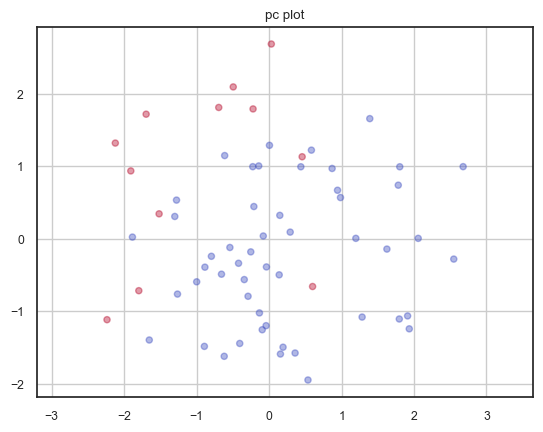

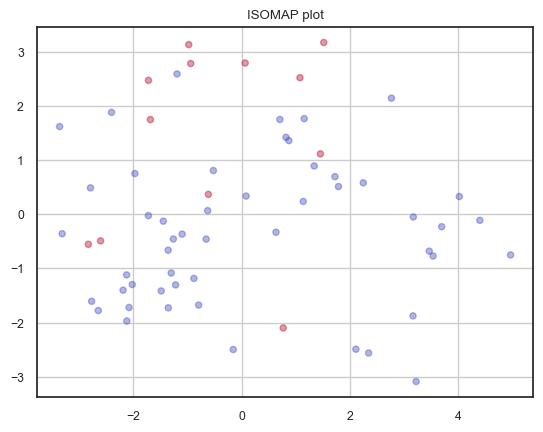

In [162]:
# The selected variables from LASSO yield the best result
# PCA, ISOMAP plot with the selected variables from RF

X_HR_final = X_HR[selected_var_lasso].copy()
X_HR_final_numerical_col = X_HR_final.select_dtypes(include = ["float64", "int64"]).columns
X_HR_final[X_HR_final_numerical_col] = StandardScaler().fit(X_HR_final[X_HR_final_numerical_col]).\
                                                transform(X_HR_final[X_HR_final_numerical_col]) 

linear = LinearRegression()
linear.fit(X_HR_final, y_HR)
print(f'LinearRegression score : {round(linear.score(X_HR_final, y_HR),4)}', "\n") # non - linear


# PCA
pca = PCA(n_components =2).fit(X_HR_final)
pc = pca.transform(X_HR_final)
print(f'Cumulative explained variance of 2 PCs (HR Dept.) : {round(sum(pca.explained_variance_ratio_),4)}') 

plt.figure()
plt.scatter(pc[:,0], pc[:,1], s=20, c=y_HR, alpha = 0.4, cmap = "coolwarm")
plt.axis('equal')
plt.grid()
plt.title('pc plot')
plt.show() 

# ISOMAP
isomap = Isomap(n_components=2, n_neighbors=5)
X_reduced = isomap.fit_transform(X_HR_final)

plt.figure()
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], s=20, c=y_HR, alpha = 0.4, cmap = "coolwarm")
plt.axis('equal')
plt.grid()
plt.title('ISOMAP plot')
plt.show() 

In [163]:
X_HR_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 63 entries, 79 to 1450
Data columns (total 5 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Age                    63 non-null     float64
 1   DistanceFromHome       63 non-null     float64
 2   JobSatisfaction        63 non-null     float64
 3   TrainingTimesLastYear  63 non-null     float64
 4   YearsWithCurrManager   63 non-null     float64
dtypes: float64(5)
memory usage: 3.0 KB


### SMOTE

In [164]:
weights = list(np.linspace(0.3, 1.0, 50))

smote_pipe = Pipeline([('smote', SMOTE(random_state=42)),
                       ('scale', StandardScaler()),
                         ('logit', LogisticRegression(random_state=42, max_iter = 5000))])

stratified_kfold = StratifiedKFold(n_splits=10,
                                       shuffle=True,
                                       random_state=42)

gcv_sm = GridSearchCV(estimator = smote_pipe, param_grid = {'smote__sampling_strategy' : weights}, scoring = 'f1', 
                   cv = stratified_kfold, error_score='raise')

gcv_result_sm = gcv_sm.fit(X_HR_final, y_HR) 
print(f'The best resampling ratio is {gcv_result_sm.best_params_["smote__sampling_strategy"]}, yielding score of ' 
      f'{gcv_result_sm.best_score_}')

The best resampling ratio is 0.5571428571428572, yielding score of 0.6


### SMOTENC (not used because there is no categorical variables)

In [165]:
# # Find categorical column indices for SMOTENC
# smotenc_cate_feature = [ind for ind, tf in enumerate(X_HR_final.dtypes == bool) if tf == True]
# smotenc_cate_feature

In [166]:
# # weights = list(np.linspace(0.29, 0.35, 50))
# weights = list(np.linspace(0.7, 1.0, 50))

# smotenc_pipe = Pipeline([('smotenc', SMOTENC(random_state=42, categorical_features = smotenc_cate_feature)), 
#                          ('scale', StandardScaler()),
#                          ('logit', LogisticRegression(random_state=42, max_iter = 5000))])

# gcv_smnc = GridSearchCV(estimator = smotenc_pipe, param_grid = {'smotenc__sampling_strategy' : weights}, scoring = 'f1', 
#                    cv = stratified_kfold, error_score='raise')

# gcv_result_smnc = gcv_smnc.fit(X_HR_final, y_HR) 
# print(f'The best resampling ratio is {gcv_result_smnc.best_params_["smotenc__sampling_strategy"]}, yielding score of ' 
#       f'{gcv_result_smnc.best_score_}')

### 3.3.3. Modeling

### 3.3.3.1. Parameter Tuning

In [167]:
# XGB Class Weight 
X_train, X_test, y_train, y_test = train_test_split(X_HR_final, y_HR, train_size = 0.7, test_size=0.3, random_state=42)
ratio = float(y_train.value_counts()[0]) / y_train.value_counts()[1]
y_pred_temp = XGBClassifier(scale_pos_weight=ratio, random_state=42, learning_rate = 0.005, n_estimators = 20, max_depth = 10).fit(X_train, y_train).predict(X_test)
ratio, f1_score(y_test, y_pred_temp)

(3.888888888888889, 0.0)

In [169]:
np.random.seed(42)
model_params = {
                "logit" : {'model' : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                                    sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('logit', LogisticRegression(random_state=42, tol=1.0e-2, max_iter=5000, 
                                                                         class_weight = {0:1, 1:1.5},
                                                                         solver='lbfgs'))]), # solver all similar result
                                            'params' : {'logit__penalty': ["l2"], 
                                                        'logit__C' : [1, 1.5, 2, 2.5]}},
                "SVM" : {'model' : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('nomal', MinMaxScaler()),
                                            ('SVM', SVC(random_state=42, tol=1.0e-2, max_iter=100000))]),
                          'params' : {'SVM__kernel': ["linear", "rbf", "sigmoid", "poly"], 
                                      'SVM__gamma' : ["auto", "scale"], 
                                     'SVM__class_weight' : ["balanced", None, {0:1, 1:5}], 
                                     'SVM__C' : [14, 15, 16, 20]}},
                "LGBM" : {'model' : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('LGBM', lgb.LGBMClassifier(random_state=42))]),
                          'params' : {'LGBM__num_leaves' : [2, 3, 4, 5],
                                      'LGBM__n_estimators':[1, 2, 3, 4, 5],
                                      'LGBM__learning_rate': [0.005],
                                      'LGBM__verbosity':[-1]}},
                "XGB": {'model': Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('XGB', XGBClassifier(random_state=42, 
                                                                  scale_pos_weight=ratio))]),
                        'params': { 'XGB__learning_rate': [0.005],
                                    'XGB__n_estimators': [1, 2, 3, 5], 
                                    'XGB__max_depth':[2, 3, 4, 5]}},
                "AdaBoost": {'model': Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('AdaBoost', AdaBoostClassifier(random_state=42))]),
                        'params': {'AdaBoost__estimator': [DecisionTreeClassifier(max_depth=i) for i in range(2,6,1)], 
                                   'AdaBoost__n_estimators':[1, 2, 3, 4],
                                   'AdaBoost__learning_rate':[0.005]}},
                "RF": {'model' : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('RF', RandomForestClassifier(random_state=42))]),
                       'params' : {'RF__n_estimators' : [1, 2, 3, 4, 5],
                                   'RF__min_samples_split' : [2, 3, 4, 5],
                                   'RF__max_depth' : [2, 3, 4, 5], 
                                   'RF__class_weight' : ["balanced", None, {0:1, 1:1.5}]}},  
                "MLP": {'model' : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('MLP', MLPClassifier(random_state=42, max_iter =1000, tol=1e-2))]),
                       'params' : {'MLP__learning_rate_init' : [0.005],
                                   'MLP__hidden_layer_sizes' : [(5,), (10, ), (15, ), (20, )],
                                   'MLP__activation' : ['identity', 'logistic', 'tanh', 'relu'],
                                    'MLP__solver' : ['lbfgs', 'sgd', 'adam']}},
                "lda" : {'model' : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('lda', LinearDiscriminantAnalysis(tol=1.0e-2))]),
                          'params' : {'lda__solver': ["svd", "lsqr", "eigen"], 
                                     'lda__shrinkage' : ["auto", None]}}}

In [170]:
np.random.seed(42)

X_train, X_test, y_train, y_test = train_test_split(X_HR_final, y_HR, train_size = 0.7, test_size=0.3, random_state=42, 
                                                    stratify=y_HR)

best_para = []
best_score = []
test_score = []
grid_cm = {}
best_coef = {}

stratified_kfold = StratifiedKFold(n_splits=5, # split 5
                                       shuffle=True, 
                                       random_state=42)

for name, model in model_params.items() :
    grid_cv = GridSearchCV(model['model'], model['params'], cv=stratified_kfold, scoring='f1')
    grid_cv.fit(X_train, y_train) 
    
    best_para.append(grid_cv.best_params_) 
    best_score.append(grid_cv.best_score_) 
    
    # test score 
    y_pred = grid_cv.predict(X_test)
    grid_test_score = f1_score(y_test, y_pred)
    test_score.append(grid_test_score)
    
    # confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    grid_cm[name] = cm

    # feature importance or coef
    if name in ["LGBM", "XGB", "AdaBoost", "RF"] :
        best_coef[name] = grid_cv.best_estimator_.named_steps[name].feature_importances_
    elif name in ["MLP"] :
        best_coef[name] = grid_cv.best_estimator_.named_steps[name].coefs_
    elif name in ["SVM"] :
        if grid_cv.best_estimator_["SVM"].kernel=="linear" : 
            best_coef[name] = grid_cv.best_estimator_.named_steps[name].coef_
        else : 
            continue
    else :
        best_coef[name] = grid_cv.best_estimator_.named_steps[name].coef_

C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
5 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\taewu\anaconda3\Lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\discriminant_analysis.py", line 615, in fit
    raise NotImplementedError("shrinkage not supported w

In [171]:
# validation set score vs test set score
pd.DataFrame({"CV Validation score" : best_score, "Test score" : test_score}, model_params.keys()).sort_values(
    by="CV Validation score", ascending=False)

,CV Validation score,Test score
MLP,0.766667,0.571429
SVM,0.733333,0.333333
logit,0.613333,0.500000
RF,0.613333,0.333333
lda,0.546667,0.444444
AdaBoost,0.480952,0.500000
XGB,0.302626,0.347826
LGBM,0.000000,0.000000


In [172]:
# check the optimal parameters for each model
para_dict = {}
for idx, result in enumerate(best_para):
    model_name = list(result.keys())[0].split('__')[0]
    para_dict[model_name] = result

para_dict

{'logit': {'logit__C': 1.5, 'logit__penalty': 'l2'},
 'SVM': {'SVM__C': 14,
  'SVM__class_weight': 'balanced',
  'SVM__gamma': 'scale',
  'SVM__kernel': 'poly'},
 'LGBM': {'LGBM__learning_rate': 0.005,
  'LGBM__n_estimators': 1,
  'LGBM__num_leaves': 2,
  'LGBM__verbosity': -1},
 'XGB': {'XGB__learning_rate': 0.005,
  'XGB__max_depth': 2,
  'XGB__n_estimators': 1},
 'AdaBoost': {'AdaBoost__estimator': DecisionTreeClassifier(max_depth=4),
  'AdaBoost__learning_rate': 0.005,
  'AdaBoost__n_estimators': 1},
 'RF': {'RF__class_weight': 'balanced',
  'RF__max_depth': 4,
  'RF__min_samples_split': 4,
  'RF__n_estimators': 4},
 'MLP': {'MLP__activation': 'relu',
  'MLP__hidden_layer_sizes': (15,),
  'MLP__learning_rate_init': 0.005,
  'MLP__solver': 'lbfgs'},
 'lda': {'lda__shrinkage': 'auto', 'lda__solver': 'lsqr'}}

In [173]:
grid_cm

{'logit': array([[13,  2],
        [ 2,  2]], dtype=int64),
 'SVM': array([[9, 6],
        [2, 2]], dtype=int64),
 'LGBM': array([[15,  0],
        [ 4,  0]], dtype=int64),
 'XGB': array([[ 0, 15],
        [ 0,  4]], dtype=int64),
 'AdaBoost': array([[13,  2],
        [ 2,  2]], dtype=int64),
 'RF': array([[14,  1],
        [ 3,  1]], dtype=int64),
 'MLP': array([[14,  1],
        [ 2,  2]], dtype=int64),
 'lda': array([[12,  3],
        [ 2,  2]], dtype=int64)}

### 3.3.3.2. Modeling with the optimal parameters

In [174]:
# Final model pipeline with the optimal parameters
np.random.seed(42)
model_pipeline = {
                "LGBM" : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('LGBM', lgb.LGBMClassifier(random_state=42, num_leaves = para_dict["LGBM"]["LGBM__num_leaves"]
                                                                    , n_estimators= para_dict["LGBM"]["LGBM__n_estimators"],
                                                                   learning_rate = para_dict["LGBM"]["LGBM__learning_rate"]
                                                                    ,verbosity = -1))]),
                "logit" : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                                    sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('logit', LogisticRegression(random_state=42, tol=1.0e-2, max_iter=5000,
                                                                         class_weight = {0:1, 1:1.5},
                                                                         solver='sag', penalty= para_dict["logit"]["logit__penalty"], 
                                                                         C = para_dict["logit"]["logit__C"]))]),
                "XGB": Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('XGB', XGBClassifier(random_state=42, scale_pos_weight=ratio, 
                                                                  learning_rate= para_dict["XGB"]["XGB__learning_rate"]
                                                                  , n_estimators= para_dict["XGB"]["XGB__n_estimators"],
                                                                 max_depth = para_dict["XGB"]["XGB__max_depth"]))]),
                "AdaBoost": Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('AdaBoost', AdaBoostClassifier(random_state=42, estimator = para_dict["AdaBoost"]["AdaBoost__estimator"], 
                                                                            n_estimators = para_dict["AdaBoost"]["AdaBoost__n_estimators"], 
                                                                            learning_rate = para_dict["AdaBoost"]["AdaBoost__learning_rate"]))]),
                "RF": Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('RF', RandomForestClassifier(random_state=42, class_weight = para_dict["RF"]["RF__class_weight"],
                                                                          n_estimators = para_dict["RF"]["RF__n_estimators"], 
                                                                         min_samples_split =para_dict["RF"]["RF__min_samples_split"] , 
                                                                          max_depth = para_dict["RF"]["RF__max_depth"]))]),
                "MLP": Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('MLP', MLPClassifier(random_state=42, max_iter =1000, tol=1e-2, 
                                                                  activation=para_dict["MLP"]["MLP__activation"],
                                                                  solver = para_dict["MLP"]["MLP__solver"],
                                                                 learning_rate_init= para_dict["MLP"]["MLP__learning_rate_init"], 
                                                                  hidden_layer_sizes= para_dict["MLP"]["MLP__hidden_layer_sizes"]))]),
                "lda" : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                            ('lda', LinearDiscriminantAnalysis(tol=1.0e-2, solver = para_dict["lda"]["lda__solver"], 
                                                                              shrinkage = para_dict["lda"]["lda__shrinkage"]))]),
                 "SVM" : Pipeline(steps = [('smote', SMOTE(random_state=42, 
                                            sampling_strategy=gcv_result_sm.best_params_['smote__sampling_strategy'])),
                                            ('scaler', StandardScaler()),
                                           ('nomal', MinMaxScaler()),
                                            ('SVM', SVC(random_state=42, tol=1.0e-2, max_iter=100000, kernel= para_dict["SVM"]["SVM__kernel"], 
                                                       gamma= para_dict["SVM"]["SVM__gamma"], C = para_dict["SVM"]["SVM__C"], 
                                                       class_weight = para_dict["SVM"]["SVM__class_weight"]))])}

In [175]:
recall, f1, precision, accuracy, roc_auc = {}, {}, {}, {}, {}
recall_mean, f1_mean, precision_mean, accuracy_mean, roc_auc_mean = {}, {}, {}, {}, {}

final_cm = {}


# stratified_kfold1 = StratifiedKFold(n_splits=50,
#                                        shuffle=True,
#                                        random_state=42)

s_split = ShuffleSplit(n_splits=50, test_size=0.3, random_state=42) # Monte Carlo gives better result than KFold

for name, pipe in model_pipeline.items() :
    recall[name] = cross_val_score(estimator=pipe, X=X_HR_final, y=y_HR, cv=s_split, scoring='recall')
    f1[name] = cross_val_score(estimator=pipe, X=X_HR_final, y=y_HR, cv=s_split, scoring = 'f1')
    precision[name] = cross_val_score(estimator=pipe, X=X_HR_final, y=y_HR, cv=s_split, scoring = 'precision')
    roc_auc[name] = cross_val_score(estimator=pipe, X=X_HR_final, y=y_HR, cv=s_split, scoring = 'roc_auc')
    accuracy[name] = cross_val_score(estimator=pipe, X=X_HR_final, y=y_HR, cv=s_split, scoring = 'accuracy')
    y_pred = cross_val_predict(estimator=pipe, X=X_HR_final, y=y_HR, cv=stratified_kfold) # cross_val_predict only accepts Kfold

    recall_mean[name] = np.mean(recall[name])
    f1_mean[name] = np.mean(f1[name])
    precision_mean[name] = np.mean(precision[name])
    roc_auc_mean[name] = np.mean(roc_auc[name])
    accuracy_mean[name] = np.mean(accuracy[name])
        
    cm = confusion_matrix(y_HR, y_pred)
    final_cm[name] = cm


C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision 

C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision 

C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\taewu\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### 3.3.3.3. Performance Comparison

In [176]:
# validation set score vs test set score
f1_df = pd.DataFrame(list(f1_mean.items()), columns=['Model', 'F1_Score']).sort_values(by="F1_Score", ascending=False).reset_index(drop=True)
recall_df = pd.DataFrame(list(recall_mean.items()), columns=['Model', 'Recall_Score']).sort_values(by="Recall_Score", ascending=False).reset_index(drop=True)
precision_df = pd.DataFrame(list(precision_mean.items()), columns=['Model', 'Precision_Score']).sort_values(by="Precision_Score", ascending=False).reset_index(drop=True)
accuracy_df = pd.DataFrame(list(accuracy_mean.items()), columns=['Model', 'Accuracy_Score']).sort_values(by="Accuracy_Score", ascending=False).reset_index(drop=True)
roc_auc_df = pd.DataFrame(list(roc_auc_mean.items()), columns=['Model', 'ROC_AUC_Score']).sort_values(by="ROC_AUC_Score", ascending=False).reset_index(drop=True)

tempdf1 = pd.merge(f1_df, recall_df, on=["Model"], how="inner")
tempdf2 = pd.merge(tempdf1, precision_df, on=["Model"], how="inner")
tempdf3 = pd.merge(tempdf2, accuracy_df, on=["Model"], how="inner")
result_df = pd.merge(tempdf3, roc_auc_df, on=["Model"], how="inner")

result_df

,Model,F1_Score,Recall_Score,Precision_Score,Accuracy_Score,ROC_AUC_Score
0,logit,0.633916,0.761667,0.594857,0.846316,0.895798
1,lda,0.610967,0.728333,0.584325,0.842105,0.879985
2,MLP,0.578403,0.668667,0.603048,0.835789,0.860282
3,SVM,0.524869,0.658667,0.481948,0.791579,0.842872
4,AdaBoost,0.518766,0.617333,0.501183,0.789474,0.730939
5,RF,0.481799,0.514000,0.541833,0.825263,0.796076
6,XGB,0.316019,1.000000,0.191579,0.191579,0.718688
7,LGBM,0.000000,0.000000,0.000000,0.808421,0.686946


In [177]:
# based model (without feature engeenering / selection, etc) check
data_temp = pd.read_csv("dataset/WA_Fn-UseC_-HR-Employee-Attrition.csv")
data_temp = data_temp.loc[data["Department"]=="Human Resources",].drop(columns = ["Department"])
data_temp = data_temp.drop(columns = ["EmployeeCount", "EmployeeNumber", "DailyRate", "HourlyRate", "MonthlyRate",  
                            "MaritalStatus", "Over18", "StandardHours"])
X_temp = pd.get_dummies(data_temp.drop(columns=["Attrition"]))
y_temp = data_temp["Attrition"].apply(lambda x : 1 if x == "Yes" else 0)

print(f'The # of variables used (including dummies) : {len(X_temp.columns)}')

np.random.seed(42)

s_split = ShuffleSplit(n_splits=50, test_size=0.3, random_state=42) 

based_f1 = {}
based_model_check = {"SVM" : Pipeline(steps = [('scaler', StandardScaler()),
                                            ('SVM', SVC(random_state=42, tol=1.0e-2, max_iter=100000))]), 
                    "logit" : Pipeline(steps = [('scaler', StandardScaler()),
                                            ('logit', LogisticRegression(random_state=42, tol=1.0e-2, max_iter=5000))]),
                      "lda" : Pipeline(steps = [('scaler', StandardScaler()),
                                            ('lda', LinearDiscriminantAnalysis(tol=1.0e-2))]),
                    "MLP": Pipeline(steps = [('scaler', StandardScaler()),
                                            ('MLP', MLPClassifier(random_state=42, max_iter =1000, tol=1e-2))])}
for name, pipe in based_model_check.items() :
    based_f1[name] = np.mean(cross_val_score(estimator=pipe, X=X_temp, y=y_temp, cv=s_split, scoring='f1'))

print(f'The F1 score of base models, using all variables without feature engineering :')
based_f1

The # of variables used (including dummies) : 34
The F1 score of base models, using all variables without feature engineering :


{'SVM': 0.0,
 'logit': 0.4356075036075036,
 'lda': 0.36097491397491394,
 'MLP': 0.3052380952380952}

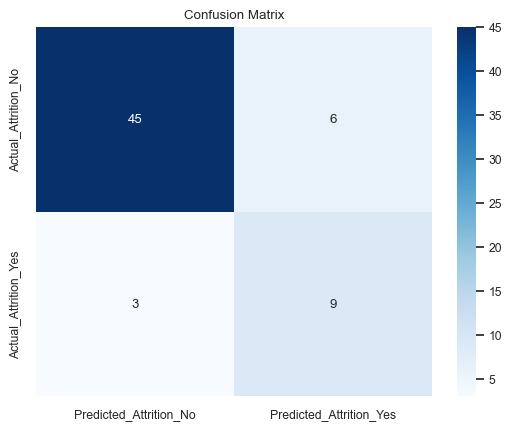

In [178]:
# Confusion Matrix of the best model
logit_cm = final_cm["logit"]

# heatmap
sns.heatmap(logit_cm, annot=True, fmt='d', cmap='Blues', cbar=True, 
            xticklabels=['Predicted_Attrition_No', 'Predicted_Attrition_Yes'], 
            yticklabels=['Actual_Attrition_No', 'Actual_Attrition_Yes'])
plt.title('Confusion Matrix')
plt.show()

In [179]:
# Confusion matrix of all models
final_cm

{'LGBM': array([[51,  0],
        [12,  0]], dtype=int64),
 'logit': array([[45,  6],
        [ 3,  9]], dtype=int64),
 'XGB': array([[ 0, 51],
        [ 0, 12]], dtype=int64),
 'AdaBoost': array([[47,  4],
        [ 4,  8]], dtype=int64),
 'RF': array([[46,  5],
        [ 5,  7]], dtype=int64),
 'MLP': array([[47,  4],
        [ 5,  7]], dtype=int64),
 'lda': array([[45,  6],
        [ 4,  8]], dtype=int64),
 'SVM': array([[42,  9],
        [ 5,  7]], dtype=int64)}

### 3.3.3.4. Feature Importance

In [180]:
logit_coef = best_coef["logit"]
logit_coef_df = pd.DataFrame(index=list(X_HR_final.columns), data=list(logit_coef[0])).sort_values(ascending = False, by =0).reset_index()
logit_coef_df.columns = ["Variable", "Coef_logit"]

lda_coef = best_coef["lda"]
lda_coef_df = pd.DataFrame(index=list(X_HR_final.columns), data=list(lda_coef[0])).sort_values(ascending = False, by =0).reset_index()
lda_coef_df.columns = ["Variable", "Coef_lda"]

pd.merge(logit_coef_df, lda_coef_df, on="Variable", how = "inner")

,Variable,Coef_logit,Coef_lda
0,DistanceFromHome,1.063035,1.336646
1,TrainingTimesLastYear,-0.828188,-0.480796
2,Age,-1.025035,-0.891008
3,JobSatisfaction,-1.123067,-0.924127
4,YearsWithCurrManager,-1.434815,-1.276354


<Figure size 1000x600 with 0 Axes>

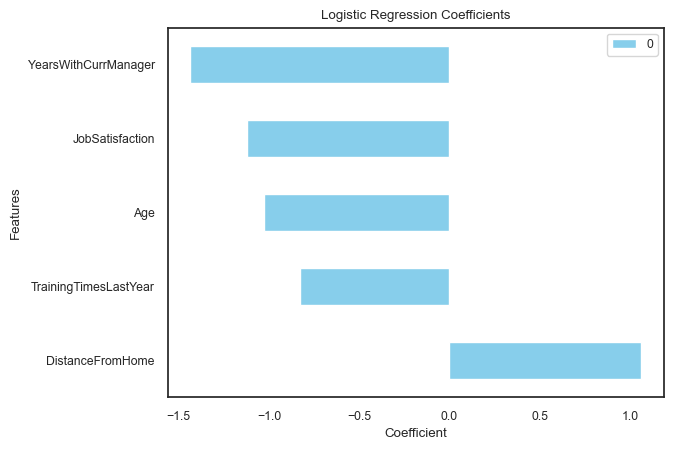

In [181]:
logit_coef_df_viz = pd.DataFrame(index=list(X_HR_final.columns), data=list(logit_coef[0])).sort_values(ascending = False, by =0)

plt.figure(figsize=(10, 6))
logit_coef_df_viz.plot(kind="barh", color="skyblue")
plt.xlabel("Coefficient")
plt.ylabel("Features")
plt.title("Logistic Regression Coefficients")
plt.show()

In [182]:
# Top 5 important variables from logit
logit_abs = logit_coef_df["Coef_logit"].abs() # absolute coef
logit_abs_df = pd.DataFrame(data=[logit_coef_df["Variable"], logit_abs]).T.sort_values(by="Coef_logit", ascending=False)
logit_abs_df["Coef_logit"]=logit_abs_df["Coef_logit"].astype("float")
top5_coef_logit = logit_abs_df.nlargest(5, "Coef_logit").reset_index(drop=True)

print(f'Top 5 variables that might have affected to Attrition in R&D Dept. are {list(top5_coef_logit["Variable"])} in order.')
top5_coef_logit

Top 5 variables that might have affected to Attrition in R&D Dept. are ['YearsWithCurrManager', 'JobSatisfaction', 'DistanceFromHome', 'Age', 'TrainingTimesLastYear'] in order.


,Variable,Coef_logit
0,YearsWithCurrManager,1.434815
1,JobSatisfaction,1.123067
2,DistanceFromHome,1.063035
3,Age,1.025035
4,TrainingTimesLastYear,0.828188


In [183]:
# Top 5 important variables from LDA
lda_abs = lda_coef_df["Coef_lda"].abs() # absolute coef
lda_abs_df = pd.DataFrame(data=[lda_coef_df["Variable"], lda_abs]).T.sort_values(by="Coef_lda", ascending=False)
lda_abs_df["Coef_lda"]=lda_abs_df["Coef_lda"].astype("float")
top5_coef_lda = lda_abs_df.nlargest(5, "Coef_lda").reset_index(drop=True)

print(f'Top 5 variables that might have affected to Attrition in HR Dept. are {list(top5_coef_lda["Variable"])} in order.')
top5_coef_lda

Top 5 variables that might have affected to Attrition in HR Dept. are ['DistanceFromHome', 'YearsWithCurrManager', 'JobSatisfaction', 'Age', 'TrainingTimesLastYear'] in order.


,Variable,Coef_lda
0,DistanceFromHome,1.336646
1,YearsWithCurrManager,1.276354
2,JobSatisfaction,0.924127
3,Age,0.891008
4,TrainingTimesLastYear,0.480796


In [184]:
# Here although they are 5 different attributes that shows linear relationships with Attrition, 
# YearsWithCurrManager, TrainingTimeesLastYear, Age all indicates young people with less number of year in the companies
# are likely to leave the work in general.

### 3.3.3.5. Best Model vs Others Comparison

In [185]:
print(f'T-Test result w/ {"SVM"} : {ttest_ind(f1["logit"], f1["SVM"])}')
print(f'T-Test result w/ {"XGB"} : {ttest_ind(f1["logit"], f1["XGB"])}')
print(f'T-Test result w/ {"RF"} : {ttest_ind(f1["logit"], f1["RF"])}')
print(f'T-Test result w/ {"MLP"} : {ttest_ind(f1["logit"], f1["MLP"])}')
print(f'T-Test result w/ {"LGBM"} : {ttest_ind(f1["logit"], f1["LGBM"])}')
print(f'T-Test result w/ {"lda"} : {ttest_ind(f1["logit"], f1["lda"])}')
print(f'T-Test result w/ {"AdaBoost"} : {ttest_ind(f1["logit"], f1["AdaBoost"])}',"\n")

print(f'W-Test result w/ {"SVM"} : {wilcoxon(f1["logit"], f1["SVM"])}')
print(f'W-Test result w/ {"XGB"} : {wilcoxon(f1["logit"], f1["XGB"])}')
print(f'W-Test result w/ {"RF"} : {wilcoxon(f1["logit"], f1["RF"])}')
print(f'W-Test result w/ {"MLP"} : {wilcoxon(f1["logit"], f1["MLP"])}')
print(f'W-Test result w/ {"LGBM"} : {wilcoxon(f1["logit"], f1["LGBM"])}')
print(f'W-Test result w/ {"lda"} : {wilcoxon(f1["logit"], f1["lda"])}')
print(f'W-Test result w/ {"AdaBoost"} : {wilcoxon(f1["logit"], f1["AdaBoost"])}')

T-Test result w/ SVM : TtestResult(statistic=2.6258118289988954, pvalue=0.010030726656688893, df=98.0)
T-Test result w/ XGB : TtestResult(statistic=9.581375305980746, pvalue=9.810167665469431e-16, df=98.0)
T-Test result w/ RF : TtestResult(statistic=3.09577839840175, pvalue=0.0025595553292859785, df=98.0)
T-Test result w/ MLP : TtestResult(statistic=1.2782575834173602, pvalue=0.20417782987421798, df=98.0)
T-Test result w/ LGBM : TtestResult(statistic=21.035433985061903, pvalue=4.0851420683404655e-38, df=98.0)
T-Test result w/ lda : TtestResult(statistic=0.512826081986676, pvalue=0.6092270123170076, df=98.0)
T-Test result w/ AdaBoost : TtestResult(statistic=2.6172601196505965, pvalue=0.010268324620712723, df=98.0) 

W-Test result w/ SVM : WilcoxonResult(statistic=219.5, pvalue=0.0022053712012105515)
W-Test result w/ XGB : WilcoxonResult(statistic=48.5, pvalue=4.9604764740251994e-11)
W-Test result w/ RF : WilcoxonResult(statistic=133.5, pvalue=0.00034362065981861705)
W-Test result w/ MLP

C:\Users\taewu\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:4088: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
